## Analyzing the Impact of Inflation on Canada's Labour Market Dynamics from 2021-2024: Trends, Disparities, and Predictive Insights
### Joudi Sinjab
#### SID: 500768188
#### Supervisor: Professor Tamer Abdou

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import sweetviz as sv
import pingouin as pg
import itertools
from scipy import stats
import scikit_posthocs as sp
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.vector_ar.vecm import coint_johansen, VECM, select_coint_rank
import statsmodels.api as sm
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.stattools import jarque_bera
from pmdarima import auto_arima
from sklearn.metrics import mean_absolute_error, root_mean_squared_error, mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay, RocCurveDisplay
from sklearn.feature_selection import RFE

pd.set_option("display.max_columns", None)  # Show all columns
pd.set_option("display.width", 1000)
pd.set_option('display.float_format', '{:.3f}'.format) 

## Data Cleaning & Preprocessing

###  Data Loading & Cleaning – Labour Force Survey (LFS)


In [ ]:
## Listing all CSV file paths
csv_files = [
    'Data/LFS/LFS_raw/pub0920.csv', 'Data/LFS/LFS_raw/pub1020.csv', 'Data/LFS/LFS_raw/pub1120.csv', 'Data/LFS/LFS_raw/pub1220.csv',
    'Data/LFS/LFS_raw/pub0121.csv', 'Data/LFS/LFS_raw/pub0221.csv', 'Data/LFS/LFS_raw/pub0321.csv', 'Data/LFS/LFS_raw/pub0421.csv',
    'Data/LFS/LFS_raw/pub0521.csv', 'Data/LFS/LFS_raw/pub0621.csv', 'Data/LFS/LFS_raw/pub0721.csv', 'Data/LFS/LFS_raw/pub0821.csv',
    'Data/LFS/LFS_raw/pub0921.csv', 'Data/LFS/LFS_raw/pub1021.csv', 'Data/LFS/LFS_raw/pub1121.csv', 'Data/LFS/LFS_raw/pub1221.csv',
    'Data/LFS/LFS_raw/pub0122.csv', 'Data/LFS/LFS_raw/pub0222.csv', 'Data/LFS/LFS_raw/pub0322.csv', 'Data/LFS/LFS_raw/pub0422.csv',
    'Data/LFS/LFS_raw/pub0522.csv', 'Data/LFS/LFS_raw/pub0622.csv', 'Data/LFS/LFS_raw/pub0722.csv', 'Data/LFS/LFS_raw/pub0822.csv',
    'Data/LFS/LFS_raw/pub0922.csv', 'Data/LFS/LFS_raw/pub1022.csv', 'Data/LFS/LFS_raw/pub1122.csv', 'Data/LFS/LFS_raw/pub1222.csv',
    'Data/LFS/LFS_raw/pub0123.csv', 'Data/LFS/LFS_raw/pub0223.csv', 'Data/LFS/LFS_raw/pub0323.csv', 'Data/LFS/LFS_raw/pub0423.csv',
    'Data/LFS/LFS_raw/pub0523.csv', 'Data/LFS/LFS_raw/pub0623.csv', 'Data/LFS/LFS_raw/pub0723.csv', 'Data/LFS/LFS_raw/pub0823.csv',
    'Data/LFS/LFS_raw/pub0923.csv', 'Data/LFS/LFS_raw/pub1023.csv', 'Data/LFS/LFS_raw/pub1123.csv', 'Data/LFS/LFS_raw/pub1223.csv',
    'Data/LFS/LFS_raw/pub0124.csv', 'Data/LFS/LFS_raw/pub0224.csv', 'Data/LFS/LFS_raw/pub0324.csv', 'Data/LFS/LFS_raw/pub0424.csv',
    'Data/LFS/LFS_raw/pub0524.csv', 'Data/LFS/LFS_raw/pub0624.csv', 'Data/LFS/LFS_raw/pub0724.csv', 'Data/LFS/LFS_raw/pub0824.csv',
    'Data/LFS/LFS_raw/pub0924.csv', 'Data/LFS/LFS_raw/pub1024.csv', 'Data/LFS/LFS_raw/pub1124.csv', 'Data/LFS/LFS_raw/pub1224.csv',
    'Data/LFS/LFS_raw/pub0125.csv', 'Data/LFS/LFS_raw/pub0225.csv'
]

## Load all CSVs into a list of DataFrames
dfs = [pd.read_csv(file) for file in csv_files]
  
## Concatenate them into one DataFrame
LFS = pd.concat(dfs, ignore_index=True)
print(f"There are {LFS.shape[0]} rows, and {LFS.shape[1]} columns in the LFS dataset")

## Checking data for duplicates
print(f"There are {LFS.duplicated().sum()} duplicates in LFS\n")


There are 5507987 rows, and 60 columns in the LFS dataset
There are 0 duplicates in LFS



In [3]:
## Printing summary information
print("====================Information about LFS dataset====================")
print(LFS.info())

## Printing summary statistics
print("====================Summary information about LFS dataset====================")
LFS.describe()

====================Information about LFS dataset====================
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5507987 entries, 0 to 5507986
Data columns (total 60 columns):
 #   Column    Dtype  
---  ------    -----  
 0   REC_NUM   int64  
 1   SURVYEAR  int64  
 2   SURVMNTH  int64  
 3   LFSSTAT   int64  
 4   PROV      int64  
 5   CMA       int64  
 6   AGE_12    int64  
 7   AGE_6     float64
 8   GENDER    int64  
 9   MARSTAT   int64  
 10  EDUC      int64  
 11  MJH       float64
 12  EVERWORK  float64
 13  FTPTLAST  float64
 14  COWMAIN   float64
 15  IMMIG     int64  
 16  NAICS_21  float64
 17  NOC_10    float64
 18  NOC_43    float64
 19  YABSENT   float64
 20  WKSAWAY   float64
 21  PAYAWAY   float64
 22  UHRSMAIN  float64
 23  AHRSMAIN  float64
 24  FTPTMAIN  float64
 25  UTOTHRS   float64
 26  ATOTHRS   float64
 27  HRSAWAY   float64
 28  YAWAY     float64
 29  PAIDOT    float64
 30  UNPAIDOT  float64
 31  XTRAHRS   float64
 32  WHYPT     float64
 33  TENURE 

,REC_NUM,SURVYEAR,SURVMNTH,LFSSTAT,PROV,CMA,AGE_12,AGE_6,GENDER,MARSTAT,EDUC,MJH,EVERWORK,FTPTLAST,COWMAIN,IMMIG,NAICS_21,NOC_10,NOC_43,YABSENT,WKSAWAY,PAYAWAY,UHRSMAIN,AHRSMAIN,FTPTMAIN,UTOTHRS,ATOTHRS,HRSAWAY,YAWAY,PAIDOT,UNPAIDOT,XTRAHRS,WHYPT,TENURE,PREVTEN,HRLYEARN,UNION,PERMTEMP,ESTSIZE,FIRMSIZE,DURUNEMP,FLOWUNEM,UNEMFTPT,WHYLEFTO,WHYLEFTN,DURJLESS,AVAILABL,LKPUBAG,LKEMPLOY,LKRELS,LKATADS,LKANSADS,LKOTHERN,PRIORACT,YNOLOOK,TLOLOOK,SCHOOLN,EFAMTYPE,AGYOWNK,FINALWT
count,5507987.000,5507987.000,5507987.000,5507987.000,5507987.000,5507987.000,5507987.000,1041102.000,5507987.000,5507987.000,5507987.000,3217830.000,2290157.000,371814.000,3589644.000,5507987.000,3589644.000,3589644.000,3589644.000,298279.000,298279.000,267036.000,3217830.000,3217830.000,3217830.000,3217830.000,3217830.000,2519720.000,423501.000,2519720.000,2519720.000,2519720.000,590710.000,3217830.000,371814.000,2769600.000,2769600.000,2769600.000,2769600.000,2769600.000,198400.000,208631.000,208631.000,371814.000,371814.000,1943232.000,232369.000,22803.000,89875.000,60767.000,144369.000,80427.000,44856.000,186304.000,73331.000,12096.000,4082914.000,5507987.000,1423889.000,5507987.000
mean,51574.341,2022.524,6.588,2.264,34.649,1.691,7.328,3.580,1.514,2.822,3.405,1.055,1.989,1.338,2.138,2.734,13.105,5.246,23.126,1.746,13.946,1.534,358.389,320.540,1.184,366.157,327.411,17.980,2.151,8.637,6.537,15.173,4.110,96.144,64.055,3234.573,2.355,1.246,2.191,2.980,17.654,4.402,1.361,3.356,7.702,109.101,1.943,1.000,1.000,1.000,1.000,1.000,1.000,1.514,2.409,1.707,1.141,6.276,2.205,317.559
std,30377.710,1.316,3.574,1.418,14.636,2.768,3.572,1.734,0.500,2.155,1.628,0.227,0.560,0.473,1.216,0.557,5.105,2.652,12.698,1.127,21.842,0.499,118.136,163.791,0.387,123.566,168.202,50.596,1.054,36.594,29.113,46.148,1.841,85.037,83.279,1741.215,0.924,0.715,1.042,1.171,21.325,2.150,0.573,1.425,3.421,89.060,0.231,0.000,0.000,0.000,0.000,0.000,0.000,0.959,1.969,0.455,0.398,5.377,1.089,302.611
min,1.000,2020.000,1.000,1.000,10.000,0.000,1.000,1.000,1.000,1.000,0.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,1.000,1.000,1.000,0.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,321.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,0.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,0.000,1.000,1.000,1.000,1.000,1.000
25%,25500.000,2021.000,3.000,1.000,24.000,0.000,4.000,2.000,1.000,1.000,2.000,1.000,2.000,1.000,2.000,3.000,10.000,3.000,11.000,1.000,1.000,1.000,325.000,240.000,1.000,350.000,240.000,0.000,1.000,0.000,0.000,0.000,3.000,20.000,5.000,2000.000,1.000,1.000,1.000,2.000,4.000,2.000,1.000,3.000,5.000,23.000,2.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,2.000,1.000,130.000
50%,51000.000,2023.000,7.000,1.000,35.000,0.000,8.000,4.000,2.000,2.000,4.000,1.000,2.000,1.000,2.000,3.000,14.000,5.000,25.000,2.000,3.000,2.000,400.000,375.000,1.000,400.000,375.000,0.000,3.000,0.000,0.000,0.000,4.000,66.000,20.000,2780.000,3.000,1.000,2.000,3.000,8.000,5.000,1.000,4.000,9.000,89.000,2.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,2.000,2.000,1.000,4.000,2.000,210.000
75%,76500.000,2024.000,10.000,4.000,47.000,3.000,11.000,5.000,2.000,6.000,5.000,1.000,2.000,2.000,2.000,3.000,17.000,7.000,34.000,3.000,17.000,2.000,400.000,400.000,1.000,400.000,400.000,0.000,3.000,0.000,0.000,0.000,5.000,169.000,92.000,4019.000,3.000,1.000,3.000,4.000,24.000,6.000,2.000,4.000,10.000,200.000,2.000,1.000,1.000,1.000,1.000,1.000,1.000,2.000,4.000,2.000,1.000,11.000,3.000,376.000
max,113780.000,2025.000,12.000,4.000,59.000,9.000,12.000,6.000,2.000,6.000,6.000,2.000,3.000,2.000,7.000,3.000,21.000,10.000,43.000,3.000,99.000,2.000,990.000,990.000,2.000,990.000,990.000,990.000,4.000,990.000,990.000,990.000,7.000,240.000,240.000,23590.000,3.000,4.000,4.000,4.000,99.000,8.000,3.000,5.000,13.000,240.000,2.000,1.000,1.000,1.000,1.000,1.000,1.000,3.000,6.000,2.000,3.000,18.000,4.000,6526.000


In [4]:
## Renaming columns for clarity 
LFS = LFS.rename(columns={'SURVYEAR' : 'survey_year', 'SURVMNTH' : 'survey_month', 'LFSSTAT' : 'lf_status', 'PROV' : 'province', 'CMA' : 'cmetrop_area', 'AGE_12' : 'age_5y_group', 'AGE_6' : '2_3y_age', 
                          'GENDER' : 'gender', 'MARSTAT' : 'marital_stat', 'EDUC' : 'education', 'MJH' : 'multiple_jobh', 'EVERWORK' : 'work_lasty', 'FTPTlast' : 'ft_pt_last', 
                          'COWMAIN' : 'main_class_worker', 'IMMIG' : 'immigration_stat', 'YABSENT' : 'rsn_absent_fullwk', 'WKSAWAY' : 'weeks_absent', 'PAYAWAY' : 'paid_for_absence', 
                          'UHRSMAIN': 'usualhrs_main', 'AHRSMAIN' : 'actualhrs_main', 'FTPTMAIN' : 'ft_pt_main', 'UTOTHRS' : 'usualhrs_all', 'ATOTHRS' : 'actualhrs_all',
                          'HRSAWAY' : 'hrs_away', 'YAWAY' : 'rsn_away', 'PAIDOT' : 'paid_overtime', 'UNPAIDOT' : 'unpaid_overtime', 'XTRAHRS' : 'hrs_overtime', 
                          'WHYPT' : 'rsn_pt', 'TENURE' : 'current_tenure', 'PREVTEN' : 'prev_tenure', 'HRLYEARN' : 'hourly_wage', 'UNION' : 'union_stat', 
                          'PERMTEMP' : 'job_permenancy', 'ESTSIZE' : 'estab_size', 'FIRMSIZE' : 'firm_size', 'DURUNEMP' : 'duration_unemp', 
                          'FLOWUNEM' : 'flow_to_unemp', 'UNEMFTPT' : 'job_seekers_temp_layoffs_status', 'WHYLEFTO' : 'rsn_left_old', 
                          'WHYLEFTN' : 'rsn_left_new', 'DURJLESS' : 'duration_jobless', 'AVAILABL' : 'availability', 'LKEMPLOY' : 'unemp_checked_employers',
                          'LKPUBAG' : 'unemp_public_agency', 'LKRELS' : 'unemp_checked_friends', 'LKATADS' : 'unemp_job_ads', 'LKANSADS' : 'unemp_answered_ads',
                          'LKOTHERN' : 'unemp_other_methods', 'PRIORACT' : 'prior_activity', 'YNOLOOK' : 'rsn_not_looking', 'TLOLOOK' : 'temp_layoff_looked', 
                          'SCHOOLN' : 'student_status', 'EFAMTYPE' : 'econ_fam_type', 'AGYOWNK' : 'age_youngest', 'FINALWT' : 'final_wt', 'FTPTLAST' : 'ft_pt_last'})

##### The following columns were removed due to high missingness or limited relevance in this study's scope.

In [5]:
## Dropping highly null columns and unrelevant columns to analysis
col_to_drop = ['cmetrop_area', '2_3y_age', 'rsn_absent_fullwk', 'rsn_away', 'rsn_pt',  'age_youngest', 'unemp_public_agency', 'unemp_checked_employers', 'unemp_checked_friends', 'unemp_job_ads', 'unemp_answered_ads', 
                'unemp_other_methods', 'rsn_not_looking', 'job_seekers_temp_layoffs_status', 'rsn_left_old', 'rsn_left_new', 'temp_layoff_looked', 'prior_activity', 'availability']

for col in col_to_drop:
    LFS.drop(columns=[col], inplace=True)
    print(f"{col} has been dropped from LFS dataframe.")

cmetrop_area has been dropped from LFS dataframe.
2_3y_age has been dropped from LFS dataframe.
rsn_absent_fullwk has been dropped from LFS dataframe.
rsn_away has been dropped from LFS dataframe.
rsn_pt has been dropped from LFS dataframe.
age_youngest has been dropped from LFS dataframe.
unemp_public_agency has been dropped from LFS dataframe.
unemp_checked_employers has been dropped from LFS dataframe.
unemp_checked_friends has been dropped from LFS dataframe.
unemp_job_ads has been dropped from LFS dataframe.
unemp_answered_ads has been dropped from LFS dataframe.
unemp_other_methods has been dropped from LFS dataframe.
rsn_not_looking has been dropped from LFS dataframe.
job_seekers_temp_layoffs_status has been dropped from LFS dataframe.
rsn_left_old has been dropped from LFS dataframe.
rsn_left_new has been dropped from LFS dataframe.
temp_layoff_looked has been dropped from LFS dataframe.
prior_activity has been dropped from LFS dataframe.
availability has been dropped from LFS

In [6]:
## Formatting Dates columns
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

LFS['REF_DATE'] = LFS['survey_year'].astype(str) + "-" + LFS['survey_month'].astype(str).str.zfill(2)
LFS['REF_DATE'] = pd.to_datetime(LFS['REF_DATE'], format='%Y-%m')

LFS['Month'] = LFS['REF_DATE'].dt.strftime('%b')
LFS['Month'] = pd.Categorical(LFS['Month'], categories=month_order, ordered=True)
LFS['REF_DATE'] = LFS['REF_DATE'].dt.date

## Sorting the data by month
LFS = LFS.sort_values('Month')
LFS.drop(columns=['survey_year', 'survey_month'], inplace=True)

In [7]:
## Formatting numerical columns

## Data documentation states that two decimal spaces are implied, changing the format to show true hourly wage
LFS['hourly_wage'] = LFS['hourly_wage']/100

## Data documentation states that one decimal space is implied
LFS['usualhrs_main'] = LFS['usualhrs_main'] / 10
LFS['actualhrs_main'] = LFS['actualhrs_main'] / 10
LFS['usualhrs_all'] = LFS['usualhrs_all'] / 10
LFS['actualhrs_all'] = LFS['actualhrs_all'] / 10
LFS['hrs_away'] = LFS['hrs_away'] / 10
LFS['paid_overtime'] = LFS['paid_overtime'] / 10
LFS['unpaid_overtime'] = LFS['unpaid_overtime'] / 10
LFS['hrs_overtime'] = LFS['hrs_overtime'] / 10

In [8]:
## Formatting categorical variable types 
ordinal_vars = [
    'lf_status', 'age_5y_group', 'education', 'marital_stat', 'work_lasty',
    'job_permenancy', 'estab_size', 'firm_size', 'student_status', 
]

nominal_vars = [
    'province', 'gender', 'multiple_jobh', 'ft_pt_last', 'main_class_worker', 'immigration_stat', 
    'NAICS_21', 'NOC_10', 'NOC_43', 'ft_pt_main', 'union_stat', 'flow_to_unemp' , 'econ_fam_type', 'paid_for_absence'
]
## Converting ordinal variables
for var in ordinal_vars:
    LFS[var] = LFS[var].astype(pd.Int64Dtype())  # Nullable integer type
    LFS[var] = pd.Categorical(LFS[var], ordered=True)

## Converting nominal variables
for var in nominal_vars:
    LFS[var] = LFS[var].astype(pd.Int64Dtype())  # Nullable integer type
    LFS[var] = LFS[var].astype('category')

In [9]:
## Checking dataframe information
print(LFS.info())

## Inspecting the first few rows of the dataset
LFS.head()

<class 'pandas.core.frame.DataFrame'>
Index: 5507987 entries, 2753993 to 2691911
Data columns (total 41 columns):
 #   Column             Dtype   
---  ------             -----   
 0   REC_NUM            int64   
 1   lf_status          category
 2   province           category
 3   age_5y_group       category
 4   gender             category
 5   marital_stat       category
 6   education          category
 7   multiple_jobh      category
 8   work_lasty         category
 9   ft_pt_last         category
 10  main_class_worker  category
 11  immigration_stat   category
 12  NAICS_21           category
 13  NOC_10             category
 14  NOC_43             category
 15  weeks_absent       float64 
 16  paid_for_absence   category
 17  usualhrs_main      float64 
 18  actualhrs_main     float64 
 19  ft_pt_main         category
 20  usualhrs_all       float64 
 21  actualhrs_all      float64 
 22  hrs_away           float64 
 23  paid_overtime      float64 
 24  unpaid_overtime    floa

,REC_NUM,lf_status,province,age_5y_group,gender,marital_stat,education,multiple_jobh,work_lasty,ft_pt_last,main_class_worker,immigration_stat,NAICS_21,NOC_10,NOC_43,weeks_absent,paid_for_absence,usualhrs_main,actualhrs_main,ft_pt_main,usualhrs_all,actualhrs_all,hrs_away,paid_overtime,unpaid_overtime,hrs_overtime,current_tenure,prev_tenure,hourly_wage,union_stat,job_permenancy,estab_size,firm_size,duration_unemp,flow_to_unemp,duration_jobless,student_status,econ_fam_type,final_wt,REF_DATE,Month
2753993,62081,4,24,10,2,2,2,NaN,1,1,2,3,7,7,31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,240.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000,1,5,345,2023-01-01,Jan
3978222,38908,3,48,10,2,1,2,NaN,2,NaN,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.000,7,23.000,1,11,61,2024-01-01,Jan
3978221,38907,4,35,2,1,6,2,NaN,3,NaN,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,7,268,2024-01-01,Jan
3978220,38906,1,35,8,1,1,4,1,NaN,NaN,3,3,6,8,35,NaN,NaN,60.000,60.000,1,60.000,60.000,NaN,NaN,NaN,NaN,240.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,4,249,2024-01-01,Jan
3978219,38905,1,48,4,1,6,4,1,NaN,NaN,2,3,20,8,35,NaN,NaN,40.000,40.000,1,40.000,40.000,0.000,0.000,0.000,0.000,33.000,NaN,38.000,3,1,1,1,NaN,NaN,NaN,1,5,81,2024-01-01,Jan


In [10]:
## Exporting the cleaned dataset to a CSV file
LFS.to_csv('Data/LFS_Cleaned.csv', index=False)

### Data Loading & Cleaning – Job Vacancy Dataset


In [11]:
## Reading the Job Vacancies CSV file
df = pd.read_csv('Data/Job vacancies, payroll employees, and job vacancy rate by industry sector, monthly, adjusted for seasonality.csv')

## Pivot the dataset to wide format based on the Statistics column
df_wide = df.pivot(index=["REF_DATE", "North American Industry Classification System (NAICS)"], 
                   columns=["Statistics"], values="VALUE").reset_index()

## Inspecting the shape of pivoted dataset
print(f"There are {df_wide.shape[0]} rows, and {df_wide.shape[1]} columns in the pivoted JV dataset")

There are 1071 rows, and 5 columns in the pivoted JV dataset


In [12]:
## Inspecting the first few rows of the pivoted dataset
df_wide.head()

Statistics,REF_DATE,North American Industry Classification System (NAICS),Job vacancies,Job vacancy rate,Payroll employees
0,2020-10,Accommodation and food services [72],48150.000,4.600,992655.000
1,2020-10,"Administrative and support, waste management a...",45235.000,5.600,761670.000
2,2020-10,"Agriculture, forestry, fishing and hunting [11]",16925.000,6.800,233620.000
3,2020-10,"Arts, entertainment and recreation [71]",5935.000,2.700,214675.000
4,2020-10,Construction [23],44195.000,4.200,1000060.000


In [13]:
## Printing the summary information
print("====================Summary information about JV dataset====================")
print(df_wide.info(), "\n") 

## Printing the summary statistics
print("\n====================Summary statistics about JV dataset====================")
df_wide.describe()

====================Summary information about JV dataset====================
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1071 entries, 0 to 1070
Data columns (total 5 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   REF_DATE                                               1071 non-null   object 
 1   North American Industry Classification System (NAICS)  1071 non-null   object 
 2   Job vacancies                                          1062 non-null   float64
 3   Job vacancy rate                                       1062 non-null   float64
 4   Payroll employees                                      1071 non-null   float64
dtypes: float64(3), object(2)
memory usage: 42.0+ KB
None 


====================Summary statistics about JV dataset====================


Statistics,Job vacancies,Job vacancy rate,Payroll employees
count,1062.000,1062.000,1071.000
mean,71485.339,4.013,1578931.130
std,159075.253,1.747,3410834.329
min,685.000,0.500,112735.000
25%,11787.500,2.700,292560.000
50%,27282.500,3.800,808025.000
75%,58678.750,5.100,1294655.000
max,1003395.000,13.300,17317010.000


In [14]:
## Formatting Date columns
df_wide['REF_DATE'] = pd.to_datetime(df_wide['REF_DATE'], format='%Y-%m') 

## Renaming columns for clarity 
df_wide = df_wide.rename(columns={"North American Industry Classification System (NAICS)": "NAICS_21_label", "Job vacancies": "Job Vacancies (#)",
                                 "Job vacancy rate": "Job Vacancy Rate (%)", "Payroll employees": "Payroll Employees (#)"})

## Checking for missing values
print(f"There is {df_wide.isnull().sum()} missing values in JV dataset:\n")
df_wide[df_wide.isnull().any(axis=1)]

There is Statistics
REF_DATE                 0
NAICS_21_label           0
Job Vacancies (#)        9
Job Vacancy Rate (%)     9
Payroll Employees (#)    0
dtype: int64 missing values in JV dataset:



Statistics,REF_DATE,NAICS_21_label,Job Vacancies (#),Job Vacancy Rate (%),Payroll Employees (#)
19,2020-10-01,Utilities [22],NaN,NaN,122230.000
187,2021-06-01,Utilities [22],NaN,NaN,123850.000
334,2022-01-01,Utilities [22],NaN,NaN,128520.000
342,2022-02-01,Finance and insurance [52],NaN,NaN,784225.000
439,2022-06-01,Utilities [22],NaN,NaN,129405.000
536,2022-11-01,"Mining, quarrying, and oil and gas extraction ...",NaN,NaN,205700.000
565,2022-12-01,Utilities [22],NaN,NaN,130780.000
943,2024-06-01,Utilities [22],NaN,NaN,135020.000
1037,2024-11-01,Information and cultural industries [51],NaN,NaN,355840.000


In [15]:
## Extract Year
df_wide["Year"] = df_wide["REF_DATE"].dt.year 

## Interpolating missing values
df_wide["Job Vacancies (#)"] = df_wide.groupby(["Year", "NAICS_21_label"])["Job Vacancies (#)"].transform(lambda x: x.interpolate(method='linear', limit_direction='both'))
df_wide["Job Vacancy Rate (%)"] = df_wide.groupby(["Year", "NAICS_21_label"])["Job Vacancy Rate (%)"].transform(lambda x: x.interpolate(method='linear', limit_direction='both'))

##### **Handling Missing Values in the Job Vacancy Dataset**
Missing values in the `Job Vacancies (#)` and `Job Vacancy Rate (%)` columns were identified across different industries and years.

**Time-Series Interpolation (Linear)**
   - Missing values were estimated using **linear interpolation**, and no missing data was at the beginning or end of the dataset.
   - This method ensures that missing values are filled based on the closest valid values before and after the gap.
   - Interpolation was applied separately for each **industry-year group** to maintain industry-specific trends.

**Final Outcome**
- The dataset's missing values were **fully imputed** using interpolation, ensuring that labor market trends were preserved without introducing artificial bias.
- This method **maintains continuity** in monthly data while reflecting natural fluctuations in job vacancies and job vacancy rates.
- This approach ensures that the **data remains accurate and reliable** for further analysis.


In [16]:
## Define industry mapping to match LFS categories across all years
industry_mapping = {
    'Management of companies and enterprises [55]': 'Business, building and other support services [55-56]',
    'Administrative and support, waste management and remediation services [56]': 'Business, building and other support services [55-56]',
    'Information and cultural industries [51]': 'Information, culture and recreation [51-71]',
    'Arts, entertainment and recreation [71]': 'Information, culture and recreation [51-71]'
}

## Apply mapping to create a new industry column
df_wide["NAICS_combined"] = df_wide["NAICS_21_label"].replace(industry_mapping)
df_wide["NAICS_combined"] = df_wide["NAICS_combined"].fillna(df_wide["NAICS_21_label"])  # Ensure unmapped values remain

## Aggregating data while keeping `Original_NAICS`
JV = df_wide.groupby(["REF_DATE", "NAICS_combined"]).agg({
    "Job Vacancies (#)": "sum",
    "Payroll Employees (#)": "sum",
    "Job Vacancy Rate (%)": lambda x: (x * df_wide.loc[x.index, "Payroll Employees (#)"]).sum() /
                                             df_wide.loc[x.index, "Payroll Employees (#)"].sum()
}).reset_index()

In [17]:
## Extract month name and convert it to an ordered categorical type
df_wide['Month'] = df_wide['REF_DATE'].dt.strftime('%b') 
df_wide['Month'] = pd.Categorical(df_wide['Month'], categories=month_order, ordered=True)

In [18]:
## Extracting cleaned JV dataset to a CSV file
JV.to_csv('Data/JV_Cleaned.csv', index=False)

### Data Cleaning – Consumer Price Index (CPI)


In [19]:
## Reading the Consumer Price Index CSV file
original_CPI = pd.read_csv('Data/Consumer Price Index, monthly, seasonally adjusted.csv')

## Pivot the dataset to wide format based on the Products and Product Groups column
CPI_pivot = original_CPI.pivot(index="REF_DATE", columns="Products and product groups", values="VALUE").reset_index()

## Inspecting the shape of pivoted dataset
print(f"There are {CPI_pivot.shape[0]} rows, and {CPI_pivot.shape[1]} columns in the CPI dataset")

There are 74 rows, and 12 columns in the CPI dataset


In [20]:
## Inspection of the first few rows of the pivoted CPI dataset
CPI_pivot.head()

Products and product groups,REF_DATE,"Alcoholic beverages, tobacco products and recreational cannabis",All-items,All-items excluding food,All-items excluding food and energy,Clothing and footwear,Food,Health and personal care,"Household operations, furnishings and equipment","Recreation, education and reading",Shelter,Transportation
0,2019-01,170.900,134.300,131.600,129.100,95.000,147.900,126.000,123.800,115.900,143.000,137.800
1,2019-02,171.000,134.700,132.000,129.500,95.600,148.500,126.400,123.500,115.800,143.400,139.100
2,2019-03,170.900,135.200,132.500,129.700,95.400,149.000,126.700,123.300,116.000,143.800,140.800
3,2019-04,171.100,135.600,132.900,130.000,95.500,149.000,126.800,123.500,116.100,144.100,141.300
4,2019-05,171.300,136.000,133.300,130.400,95.700,149.500,127.300,123.800,117.300,144.200,142.400


In [21]:
## Printing the summary information
print("====================Summary information about CPI dataset====================")
print(CPI_pivot.info(), '\n')

## Printing the summary statistics
print("====================Summary statisics about CPI dataset:=======================")
CPI_pivot.describe()

====================Summary information about CPI dataset====================
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74 entries, 0 to 73
Data columns (total 12 columns):
 #   Column                                                           Non-Null Count  Dtype  
---  ------                                                           --------------  -----  
 0   REF_DATE                                                         74 non-null     object 
 1   Alcoholic beverages, tobacco products and recreational cannabis  74 non-null     float64
 2   All-items                                                        74 non-null     float64
 3   All-items excluding food                                         74 non-null     float64
 4   All-items excluding food and energy                              74 non-null     float64
 5   Clothing and footwear                                            74 non-null     float64
 6   Food                                                          

Products and product groups,"Alcoholic beverages, tobacco products and recreational cannabis",All-items,All-items excluding food,All-items excluding food and energy,Clothing and footwear,Food,Health and personal care,"Household operations, furnishings and equipment","Recreation, education and reading",Shelter,Transportation
count,74.000,74.000,74.000,74.000,74.000,74.000,74.000,74.000,74.000,74.000,74.000
mean,181.332,147.707,143.858,140.004,94.904,168.315,137.628,127.792,121.428,161.073,157.554
std,9.752,10.086,9.183,8.109,1.598,15.515,8.884,3.728,4.905,14.449,13.381
min,170.800,134.300,131.600,129.100,90.500,147.900,126.000,123.200,114.400,143.000,136.200
25%,171.950,137.350,134.225,131.925,93.700,154.050,129.025,123.825,116.800,146.725,142.875
50%,178.400,146.800,143.350,138.450,94.850,164.350,134.750,127.400,121.450,158.100,160.450
75%,191.375,157.950,153.100,147.850,96.050,185.150,146.750,131.175,126.350,173.650,170.375
max,198.500,163.700,158.700,153.900,98.700,191.500,152.400,133.500,130.400,186.700,175.700


In [22]:
## Formatting Date columns
CPI_pivot["REF_DATE"] = pd.to_datetime(CPI_pivot["REF_DATE"], format='%Y-%m')

## Extract month name and convert it to an ordered categorical type
CPI_pivot['Month'] = CPI_pivot['REF_DATE'].dt.strftime('%b') 
CPI_pivot['Month'] = pd.Categorical(CPI_pivot['Month'], categories=month_order, ordered=True)

## Extract Year
CPI_pivot["Year"] = CPI_pivot["REF_DATE"].dt.year 

## Sorting by date
CPI_pivot = CPI_pivot.sort_values(by="REF_DATE")

In [23]:
## Extracting  All-items column and creating a new dataframe copy
CPI = CPI_pivot[['REF_DATE', 'Month', 'Year', "All-items"]]
CPI = CPI.copy()

## Extracting cleaned CPI dataset to a CSV file
CPI.to_csv('Data/CPI_Cleaned.csv', index=False)

## Basic Data Exploration

In [24]:
## Creating basic exploratory data analysis reports

# LFS_report = sv.analyze(LFS)
# LFS_report.show_html('LFS_EDA_Report.html')

# JV_report = sv.analyze(JV)
# JV_report.show_html('JV_EDA_Report.html')

# CPI_report = sv.analyze(CPI)
# CPI_report.show_html('CPI_EDA_Report.html')

## Feature Engineering

### CPI Feature Engineering

In [25]:
## Converting to CPI indec to Month-over-Month percentage change
CPI["Inflation_Rate_MoM"] = CPI["All-items"].pct_change() * 100  

## Creating a 1-month lagged CPI column
CPI["CPI_Lagged_1M"] = CPI["All-items"].shift(1)  

## Calculating Month-over-Month Inflation Rate using lagged CPI
CPI["Inflation_Rate_1M_Lagged"] = ((CPI["All-items"] - CPI["CPI_Lagged_1M"]) / CPI["CPI_Lagged_1M"]) * 100

## Calculating Year-over-Year (YoY) Inflation Rate using 12-month lagged CPI
CPI["CPI_Lagged_12M"] = CPI["All-items"].shift(12) 
CPI["Inflation_Rate_YoY"] = ((CPI["All-items"] - CPI["CPI_Lagged_12M"]) / CPI["CPI_Lagged_12M"]) * 100
# Lagged YoY inflation rate (1–3 months)
CPI["Inflation_Rate_YoY_Lag1"] = CPI["Inflation_Rate_YoY"].shift(1)
CPI["Inflation_Rate_YoY_Lag3"] = CPI["Inflation_Rate_YoY"].shift(3)

### Feature Engineering – Labour Force Survey (LFS) and Job Vacancy Dataset

In [26]:
## Defining employment categories to avoid null values
employed = LFS[LFS['lf_status'].isin([1, 2])]

unemployed = LFS[LFS['lf_status'] == 3]

labour_force = LFS[LFS['lf_status'].isin([1, 2, 3])]

hourly_wage = employed[(employed['hourly_wage'] != 0) & (~employed['hourly_wage'].isna())]

jobless = LFS[(LFS['lf_status'] == 3) & ((LFS['work_lasty'] == 1) | (LFS['work_lasty'] == 2))]

weight_col = 'final_wt'


In [27]:
## Grouping by REF_DATE and summing weights to calculate the total estimated number of employed, unemployed, labour force, and working-age population
monthly_employed = employed.groupby('REF_DATE')[weight_col].sum()

monthly_unemployed = unemployed.groupby('REF_DATE')[weight_col].sum()

monthly_labour_force = labour_force.groupby('REF_DATE')[weight_col].sum()

monthly_working_age_pop = LFS.groupby('REF_DATE')[weight_col].sum()

## Grouping by REF_DATE and calculating the weighted sum of hourly wages across employed individuals
weighted_hourly_wage_sum = hourly_wage.groupby('REF_DATE')["hourly_wage"].apply(
    lambda x: (x * hourly_wage.loc[x.index, weight_col]).sum()
)

## Grouping by REF_DATE and summing weights to get the total weighted population of hourly wage earners
total_weight = hourly_wage.groupby('REF_DATE')[weight_col].sum()

## Grouping by REF_DATE and calculating the weighted sum of jobless duration for unemployed individuals who have previously worked
weighted_jobless_duration_sum = jobless.groupby("REF_DATE")["duration_jobless"].apply(
    lambda x: (x * jobless.loc[x.index, "final_wt"]).sum()
)

## Grouping by REF_DATE and summing weights to get the total weighted population of jobless individuals
total_weight_jobless = jobless.groupby("REF_DATE")["final_wt"].sum()


In [28]:
## Calculating Weighted Average Hourly Wage 
average_hourly_wage = weighted_hourly_wage_sum / total_weight

## Calculating Weighted Average Jobless Duration
weighted_jobless_duration = weighted_jobless_duration_sum / total_weight_jobless

## Calculating Monthly Employment & Unemployment Rates & Labour Force Participation Rate
employment_rate = (monthly_employed / monthly_working_age_pop) * 100
unemployment_rate = (monthly_unemployed / monthly_labour_force) * 100
participation_rate = (monthly_labour_force / monthly_working_age_pop) * 100

## Combining into a DataFrame
monthly_rates = pd.DataFrame({
    'Employment_Rate(%)': employment_rate,
    'Unemployment_Rate(%)': unemployment_rate, 
    'Labour_Force_Participation_Rate(%)': participation_rate,
    'Unemployed': monthly_unemployed,
    'Average_Hourly_Wage': average_hourly_wage, 
    'Duration_Jobless(Months)': weighted_jobless_duration
}).reset_index()

In [29]:
## Ensuring REF_DATE is datetime for merge compatibility
monthly_rates['REF_DATE'] = pd.to_datetime(monthly_rates['REF_DATE'])

## Merging with JV & CPI data 
total_vacancies = JV[JV['NAICS_combined'] == 'Total, all industries']
monthly_rates = monthly_rates.merge(total_vacancies, on= 'REF_DATE', how='left')
monthly_rates = monthly_rates.merge(CPI, on= 'REF_DATE', how='left')

## Calculating Market Tightness 
monthly_rates["Market_Tightness"] = monthly_rates["Job Vacancies (#)"] / monthly_rates["Unemployed"]



In [30]:
## Sorting by date
monthly_rates.sort_values(by='REF_DATE', inplace=True)

# Feature engineering lagged Job Vacancy Rate & Unemployment Rate by 1 month
monthly_rates["Lagged_1M_Job_Vacancy_Rate"] = (
    monthly_rates["Job Vacancy Rate (%)"].shift(1))

monthly_rates["Lagged_1M_Unemployment_Rate"] = (
    monthly_rates["Unemployment_Rate(%)"].shift(1))

In [31]:
## Droping redundant NAICS_combined column
monthly_rates.drop(columns=["NAICS_combined", "Unemployed"], inplace=True)

## Removing rows where Year == 2020
monthly_rates = monthly_rates[monthly_rates["Year"] != 2020]

## Extracting monthly rates for 2025 to use for later forecasting 
monthly_2025 = monthly_rates[monthly_rates['Year'] == 2025].copy()

## Dropping rows with missing values
monthly_rates.dropna(inplace=True)

## Exporting working dataset to CSV
monthly_rates.to_csv('Monthly Labour Market Rates.csv', index=False)
monthly_2025.to_csv('2025 Monthly Labour Market Rates.csv', index=False)

### Feature Engineering – Labour Market Indicators by Industry

In [32]:
## Grouping Employed (LF_STATUS: 1, 2) by month & industry
employed_by_month_industry = (
    LFS[LFS['lf_status'].isin([1, 2])]
    .groupby(['REF_DATE', 'NAICS_21'], observed=False)[weight_col]
    .sum()
    .reset_index()
    .rename(columns={weight_col: 'total_employed'})
)

## Grouping Unemployed (LF_STATUS: 3) by month & industry
unemployed_by_month_industry = (
    LFS[LFS['lf_status'] == 3]
    .groupby(['REF_DATE', 'NAICS_21'], observed=False)[weight_col]
    .sum()
    .reset_index()
    .rename(columns={weight_col: 'total_unemployed'})
)

## Grouping Labour Force Participation
participation_by_month_industry = (
    LFS[LFS['lf_status'].isin([1, 2, 3])]
    .groupby(['REF_DATE', 'NAICS_21'], observed=False)[weight_col]
    .sum()
    .reset_index()
    .rename(columns={weight_col: 'total_participation'})
)

## Grouping Working Age Population
working_age_by_month_industry = (
    LFS
    .groupby(['REF_DATE', 'NAICS_21'], observed=False)[weight_col]
    .sum()
    .reset_index()
    .rename(columns={weight_col: 'total_working_age'})
)

## Grouping Duration Jobless
jobless_industry = LFS[(LFS['lf_status'] == 3) & ((LFS['work_lasty'] == 1) | (LFS['work_lasty'] == 2))]

weighted_jobless_duration_sum = (
    jobless_industry
    .groupby(['REF_DATE', 'NAICS_21'], observed=False)[["duration_jobless", weight_col]] 
    .apply(lambda x: (x["duration_jobless"] * x[weight_col]).sum())
    .reset_index(name="weighted_jobless_duration_sum")
)

## Compute Total Weights per Industry & Month
total_weight_jobless = (
    jobless_industry.groupby(["REF_DATE", "NAICS_21"], observed=False)["final_wt"]
    .sum()
    .reset_index(name="total_weight_jobless")
)

## Grouping Hourly Wage
hourly_wage = LFS[(LFS['lf_status'].isin([1, 2])) & (LFS['hourly_wage'] != 0) & (~LFS['hourly_wage'].isna())]

weighted_hourly_wage_sum = (
    hourly_wage
    .groupby(['REF_DATE', 'NAICS_21'], observed=False)[["hourly_wage", weight_col]]  
    .apply(lambda x: (x["hourly_wage"] * x[weight_col]).sum())
    .reset_index(name="weighted_hourly_wage_sum")
)

## Computing Total Weights per Industry & Month
total_weight_hourly_wage = (
    hourly_wage.groupby(["REF_DATE", "NAICS_21"], observed=False)[weight_col]
    .sum()
    .reset_index(name="total_weight_hourly_wage")
)

## Merging all employment-related metrics
monthly_totals = (
    employed_by_month_industry
    .merge(unemployed_by_month_industry, on=['REF_DATE', 'NAICS_21'], how='outer')
    .merge(participation_by_month_industry, on=['REF_DATE', 'NAICS_21'], how='outer')
    .merge(working_age_by_month_industry, on=['REF_DATE', 'NAICS_21'], how='outer')
    .merge(total_weight_jobless, on=['REF_DATE', 'NAICS_21'], how='outer')
    .merge(weighted_jobless_duration_sum, on=['REF_DATE', 'NAICS_21'], how='outer')
    .merge(total_weight_hourly_wage, on=['REF_DATE', 'NAICS_21'], how='outer')
    .merge(weighted_hourly_wage_sum, on=['REF_DATE', 'NAICS_21'], how='outer')
)


In [33]:
## Inspecting first few rows
monthly_totals.head()

,REF_DATE,NAICS_21,total_employed,total_unemployed,total_participation,total_working_age,total_weight_jobless,weighted_jobless_duration_sum,total_weight_hourly_wage,weighted_hourly_wage_sum
0,2020-09-01,1,286125,9707,295832,323708,9707,47850.000,123044,2554083.130
1,2020-09-01,2,55231,5275,60506,69826,5275,19680.000,45416,1357742.900
2,2020-09-01,3,16828,6238,23066,31566,6238,23079.000,7950,185220.540
3,2020-09-01,4,225784,27257,253041,267383,27257,159029.000,215833,10013609.180
4,2020-09-01,5,140835,1689,142524,146054,1689,7610.000,140835,6486970.550


In [34]:
## Ensuring REF_DATE is in datetime format
monthly_totals["REF_DATE"] = pd.to_datetime(monthly_totals["REF_DATE"])
JV["REF_DATE"] = pd.to_datetime(JV["REF_DATE"])
CPI["REF_DATE"] = pd.to_datetime(CPI["REF_DATE"])

## Droping "Total, all industries" from JV dataset
JV = JV[JV['NAICS_combined'] != 'Total, all industries']

# Mapping JV industries to numerical categories
industry_encoding = {
    'Accommodation and food services [72]': 1, 
    'Business, building and other support services [55-56]': 2, 
    'Agriculture, forestry, fishing and hunting [11]': 3, 
    'Construction [23]': 4,
    'Educational services [61]': 5, 
    'Finance and insurance [52]': 6,
    'Health care and social assistance [62]': 7,
    'Information, culture and recreation [51-71]': 8, 
    'Manufacturing [31-33]': 9, 
    'Mining, quarrying, and oil and gas extraction [21]': 10, 
    'Other services (except public administration) [81]': 11,
    'Professional, scientific and technical services [54]': 12,
    'Public administration [91]': 13,
    'Real estate and rental and leasing [53]': 14,
    'Retail trade [44-45]': 15,
    'Transportation and warehousing [48-49]': 16,
    'Utilities [22]': 17,
    'Wholesale trade [41]': 18
}

JV["Industry_Label"] = JV["NAICS_combined"]
JV['JV_industry'] = JV['NAICS_combined'].map(industry_encoding)

if JV['JV_industry'].isnull().any():
    print("Warning: Some industries could not be mapped. Check for missing values.")

# Mapping LFS to JV industry codes
LFS_to_JV = {
    1 : 3,
    2 : 3,  
    3 : 3,  
    4 : 10,
    5 : 17,
    6 : 4,
    7 : 9,  
    8 : 9,  
    9 : 18,
    10: 15,
    11: 16,
    12: 6,
    13: 14,
    14: 12,
    15: 2,  
    16: 5,
    17: 7,
    18: 8,  
    19: 1,
    20: 11,
    21: 13,
}
monthly_totals['NAICS_21_mapped'] = monthly_totals['NAICS_21'].map(LFS_to_JV)

# Converting to categorical types
monthly_totals['NAICS_21'] = monthly_totals['NAICS_21'].astype('category')
monthly_totals['NAICS_21_mapped'] = monthly_totals['NAICS_21_mapped'].astype('category')

# Checking for missing mappings
if monthly_totals['NAICS_21_mapped'].isnull().any():
    print("Warning: Some industries could not be mapped. Check missing values:", 
          monthly_totals[monthly_totals['NAICS_21_mapped'].isnull()]['NAICS_21'].unique())

# Merging JV & CPI with industry monthly rates
monthly_totals = monthly_totals.merge(
    JV[['REF_DATE', 'JV_industry', 'Industry_Label', 'Job Vacancies (#)', 'Payroll Employees (#)', 'Job Vacancy Rate (%)']], 
    left_on=["REF_DATE", "NAICS_21_mapped"], 
    right_on=["REF_DATE", "JV_industry"], 
    how="left"
)

## Dropping null values from September 2020 and Jan-Feb 2025
monthly_totals.dropna(inplace=True)

In [35]:
## Display first few rows
monthly_totals.head()

,REF_DATE,NAICS_21,total_employed,total_unemployed,total_participation,total_working_age,total_weight_jobless,weighted_jobless_duration_sum,total_weight_hourly_wage,weighted_hourly_wage_sum,NAICS_21_mapped,JV_industry,Industry_Label,Job Vacancies (#),Payroll Employees (#),Job Vacancy Rate (%)
21,2020-10-01,1,287401,13462,300863,330035,13462,57446.000,128688,2674172.340,3,3.000,"Agriculture, forestry, fishing and hunting [11]",16925.000,233620.000,6.800
22,2020-10-01,2,44657,4807,49464,57869,4807,23125.000,35327,1080353.060,3,3.000,"Agriculture, forestry, fishing and hunting [11]",16925.000,233620.000,6.800
23,2020-10-01,3,16436,6820,23256,32741,6820,32261.000,4183,113228.340,3,3.000,"Agriculture, forestry, fishing and hunting [11]",16925.000,233620.000,6.800
24,2020-10-01,4,248627,24772,273399,286151,24772,172005.000,236330,10721868.230,10,10.000,"Mining, quarrying, and oil and gas extraction ...",4195.000,183335.000,2.200
25,2020-10-01,5,138456,1107,139563,142207,1107,5140.000,138456,6397023.410,17,17.000,Utilities [22],1420.000,122230.000,1.100


Agriculture, forestry, fishing and hunting [11] and Manufacturing [31-33] are each one industry in JV. However, in LFS the Manufacturing [31-33] is divided into 2 sub-industries and Agriculture, forestry, fishing and hunting [11] is divided into 3 sub-industries. The job vacancy data needs to be proportional to each industry. 

In [36]:
# Selecting industries needing adjustment
adjusted_rates = monthly_totals[monthly_totals['NAICS_21'].isin([1,2,3,7,8])]

# Calculating total weighted labour force per JV industry
total_weighted_labour_force_per_JV = (
    adjusted_rates.groupby(['REF_DATE', 'NAICS_21_mapped'], observed=False)['total_participation']
    .sum()
    .reset_index()
    .rename(columns={'total_participation': 'total_weighted_labour_force_JV'})
)

# Merging total weighted labour force per JV industry
adjusted_rates = adjusted_rates.merge(total_weighted_labour_force_per_JV, on=['REF_DATE', 'NAICS_21_mapped'], how='left')

# Computing labour force proportion using weighted values & replacing NaN proportions with 0
adjusted_rates['labour_force_proportion'] = adjusted_rates['total_participation'] / adjusted_rates['total_weighted_labour_force_JV']
adjusted_rates['labour_force_proportion'] = adjusted_rates['labour_force_proportion'].fillna(0)

In [37]:
# Adjusing Job Vacancies and Payroll Employees based on labour force proportion
adjusted_rates['Adjusted Job Vacancies'] = (
    adjusted_rates['Job Vacancies (#)'] * adjusted_rates['labour_force_proportion']
).round(0)

adjusted_rates['Adjusted Payroll Employees'] = (
    adjusted_rates['Payroll Employees (#)'] * adjusted_rates['labour_force_proportion']
).round(0)

# Computing adjusted Job Vacancy Rate (%)
adjusted_rates['Adjusted Job Vacancy Rate (%)'] = (
    adjusted_rates['Adjusted Job Vacancies'] /
    (adjusted_rates['Adjusted Payroll Employees'] + adjusted_rates['Adjusted Job Vacancies'])
) * 100

In [38]:
# Droping old columns and renaming adjusted values
adjusted_rates.drop(columns=['Job Vacancies (#)', 'Payroll Employees (#)', 'Job Vacancy Rate (%)'], inplace=True)
adjusted_rates.rename(columns=
                      {'Adjusted Job Vacancies': 'Job Vacancies (#)', 
                       'Adjusted Payroll Employees': 'Payroll Employees (#)', 
                       'Adjusted Job Vacancy Rate (%)': 'Job Vacancy Rate (%)'}, inplace=True)

# Ensuring industries that need adjustment are removed from main dataset
industries_to_update = [1, 2, 3, 7, 8]
monthly_totals = monthly_totals[~monthly_totals['NAICS_21'].isin(industries_to_update)]

# Appending adjusted data back into dataset
monthly_industry_rates = pd.concat([monthly_totals, adjusted_rates], ignore_index=True)

# Ensuring data is sorted correctly
monthly_industry_rates = monthly_industry_rates.sort_values(by=['REF_DATE', 'NAICS_21']).reset_index(drop=True)

In [39]:
# Calculate labour market indicators by weight
monthly_industry_rates["Employment_Rate(%)"] = (monthly_industry_rates["total_employed"] / monthly_industry_rates["total_working_age"]) * 100
monthly_industry_rates["Unemployment_Rate(%)"] = (monthly_industry_rates["total_unemployed"] / monthly_industry_rates["total_participation"]) * 100
monthly_industry_rates["Labour_Force_Participation_Rate(%)"] = (monthly_industry_rates["total_participation"] / monthly_industry_rates["total_working_age"]) * 100
monthly_industry_rates["Duration_Jobless(Months)"] = monthly_industry_rates["weighted_jobless_duration_sum"] / monthly_industry_rates["total_weight_jobless"]
monthly_industry_rates["Average_Hourly_Wage"] = monthly_industry_rates["weighted_hourly_wage_sum"] / monthly_industry_rates["total_weight_hourly_wage"]
monthly_industry_rates["Market_Tightness"] = monthly_industry_rates["Job Vacancies (#)"] / monthly_industry_rates["total_unemployed"]

In [40]:
## Adding NAICS_21 labels
naics_21_labels = {
    1: "Agriculture",
    2: "Forestry and logging and support activities for forestry",
    3: "Fishing, hunting and trapping",
    4: "Mining, quarrying, and oil and gas extraction",
    5: "Utilities",
    6: "Construction",
    7: "Manufacturing - durable goods",
    8: "Manufacturing - non-durable goods",
    9: "Wholesale trade",
    10: "Retail trade",
    11: "Transportation and warehousing",
    12: "Finance and insurance",
    13: "Real estate and rental and leasing",
    14: "Professional, scientific and technical services",
    15: "Business, building and other support services",
    16: "Educational services",
    17: "Health care and social assistance",
    18: "Information, culture and recreation",
    19: "Accommodation and food services",
    20: "Other services (except public administration)",
    21: "Public administration"
}

## Mapping NAICS_21 to labels
monthly_industry_rates["NAICS_21_Label"] = monthly_industry_rates["NAICS_21"].map(naics_21_labels)

## Droping redundant columns
monthly_industry_rates.drop(columns= 
                            ['total_employed', 'total_unemployed', 'total_participation', 'total_working_age', 
                             'total_weight_jobless', 'weighted_jobless_duration_sum', 'total_weight_hourly_wage', 
                             'weighted_hourly_wage_sum', 'labour_force_proportion',
                             'NAICS_21_mapped', 'total_weighted_labour_force_JV'], inplace=True)

In [41]:
## Lagging Job Vacancy Rate & Unemployment Rate by 1 month
monthly_industry_rates["Lagged_Job_Vacancy_Rate"] = (
    monthly_industry_rates
    .groupby("NAICS_21", observed=False)["Job Vacancy Rate (%)"]
    .shift(1)
)

monthly_industry_rates["Lagged_Unemployment_Rate"] = (
    monthly_industry_rates
    .groupby("NAICS_21", observed=False)["Unemployment_Rate(%)"]
    .shift(1)
)

monthly_industry_rates["Lagged_Market_Tightness"] = (
    monthly_industry_rates
    .groupby("NAICS_21", observed=False)["Market_Tightness"]
    .shift(1)
)

## Merging with JV & CPI data
monthly_industry_rates = monthly_industry_rates.merge(CPI, on=['REF_DATE'], how='left')

In [42]:
## Renameing Industry_Label -> JV_Industry_Label
monthly_industry_rates.rename(columns={
    "Industry_Label": "JV_Industry_Label",
    
}, inplace=True)

## Removing rows where Year == 2020 & 2025
monthly_industry_rates = monthly_industry_rates[monthly_industry_rates["Year"] != 2020]
monthly_industry_rates = monthly_industry_rates[monthly_industry_rates["Year"] != 2025]

# Checking for missing values
print(monthly_industry_rates.isna().sum())

REF_DATE                              0
NAICS_21                              0
JV_industry                           0
JV_Industry_Label                     0
Job Vacancies (#)                     0
Payroll Employees (#)                 0
Job Vacancy Rate (%)                  0
Employment_Rate(%)                    0
Unemployment_Rate(%)                  0
Labour_Force_Participation_Rate(%)    0
Duration_Jobless(Months)              0
Average_Hourly_Wage                   0
Market_Tightness                      0
NAICS_21_Label                        0
Lagged_Job_Vacancy_Rate               0
Lagged_Unemployment_Rate              0
Lagged_Market_Tightness               0
Month                                 0
Year                                  0
All-items                             0
Inflation_Rate_MoM                    0
CPI_Lagged_1M                         0
Inflation_Rate_1M_Lagged              0
CPI_Lagged_12M                        0
Inflation_Rate_YoY                    0


In [43]:
## Extracting dataframe to CSV format
monthly_industry_rates.to_csv('Monthly Industry Labour Market Rates.csv', index=False)

## Monthly Trends in Key Labour Market Indicators (2021–2024)


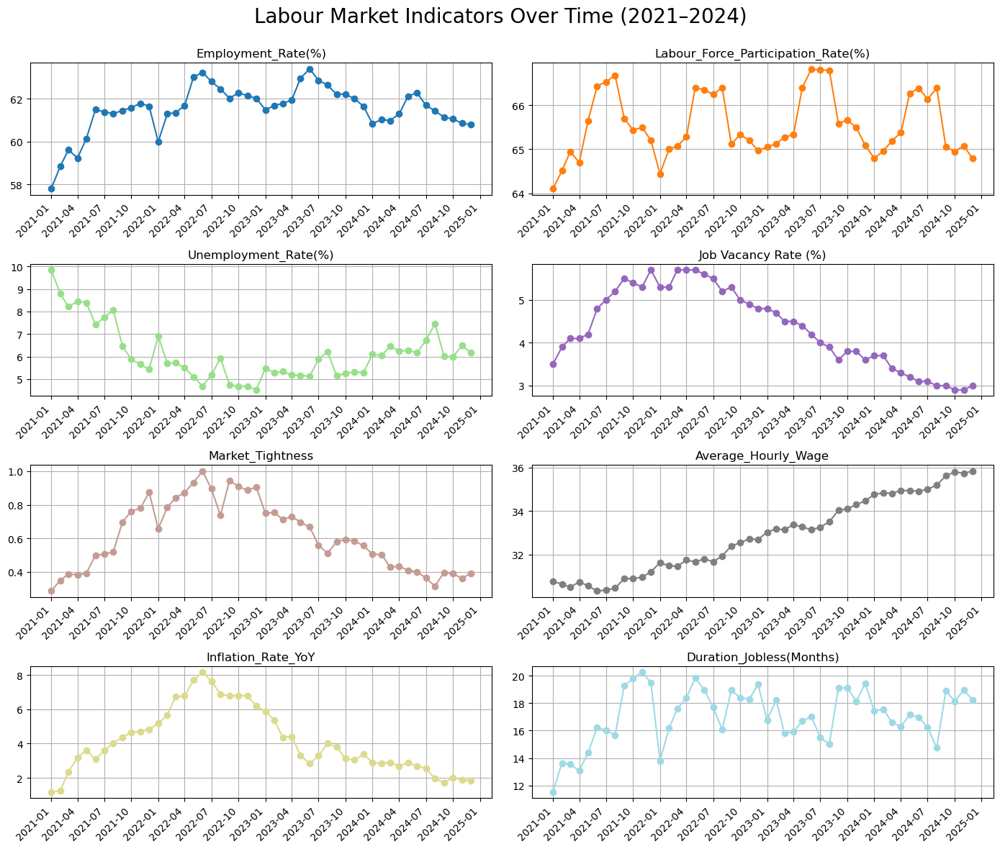

In [44]:
overall_indicators = monthly_rates.copy()

## List of indicators to plot
indicators = ["Employment_Rate(%)", "Labour_Force_Participation_Rate(%)", "Unemployment_Rate(%)", 
              "Job Vacancy Rate (%)", "Market_Tightness", "Average_Hourly_Wage", "Inflation_Rate_YoY", "Duration_Jobless(Months)"]
num_plots = len(indicators)

ncols = 2
nrows = int(np.ceil(len(indicators) / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(14, 3 * nrows), sharex=False)
axes = axes.flatten()

## Colour cycle — one distinct colour per plot
colors = plt.cm.tab20(np.linspace(0, 1, len(indicators)))

## Quarterly ticks
locator = mdates.MonthLocator(interval=3)
formatter = mdates.DateFormatter("%Y-%m")

for ax, col, color in zip(axes, indicators, colors):
    ax.plot(overall_indicators["REF_DATE"], overall_indicators[col], marker="o", linestyle="-", color=color)
    ax.set_title(col)
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(formatter)
    ax.grid(True)


# Rotate all x-tick labels
for ax in axes:
    plt.setp(ax.xaxis.get_ticklabels(), rotation=45, ha="right")

fig.suptitle("Labour Market Indicators Over Time (2021–2024)", fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()

In [45]:
overall_indicators.describe()

,REF_DATE,Employment_Rate(%),Unemployment_Rate(%),Labour_Force_Participation_Rate(%),Average_Hourly_Wage,Duration_Jobless(Months),Job Vacancies (#),Payroll Employees (#),Job Vacancy Rate (%),Year,All-items,Inflation_Rate_MoM,CPI_Lagged_1M,Inflation_Rate_1M_Lagged,CPI_Lagged_12M,Inflation_Rate_YoY,Inflation_Rate_YoY_Lag1,Inflation_Rate_YoY_Lag3,Market_Tightness,Lagged_1M_Job_Vacancy_Rate,Lagged_1M_Unemployment_Rate
count,48,48.000,48.000,48.000,48.000,48.000,48.000,48.000,48.000,48.000,48.000,48.000,48.000,48.000,48.000,48.000,48.000,48.000,48.000,48.000,48.000
mean,2022-12-16 05:00:00,61.525,6.133,65.543,32.852,17.088,755601.979,16664436.562,4.350,2022.500,152.688,0.331,152.192,0.331,146.713,4.120,4.100,4.049,0.612,4.362,6.175
min,2021-01-01 00:00:00,57.793,4.518,64.101,30.315,11.519,515655.000,15167450.000,2.900,2021.000,139.100,-0.066,138.500,-0.066,135.400,1.164,0.874,0.585,0.285,2.900,4.518
25%,2021-12-24 06:00:00,61.124,5.267,65.056,31.389,15.991,629811.250,16276597.500,3.600,2021.750,146.025,0.171,145.025,0.171,138.950,2.833,2.833,2.833,0.406,3.600,5.267
50%,2022-12-16 12:00:00,61.660,5.903,65.334,32.872,17.299,757405.000,16963647.500,4.300,2022.500,154.600,0.286,154.250,0.286,145.750,3.604,3.604,3.604,0.582,4.300,5.903
75%,2023-12-08 18:00:00,62.167,6.469,66.294,34.532,18.910,910608.750,17190713.750,5.225,2023.250,159.400,0.466,159.100,0.466,154.450,5.439,5.439,5.439,0.765,5.225,6.546
max,2024-12-01 00:00:00,63.407,9.841,66.829,35.834,20.253,1003395.000,17317010.000,5.700,2024.000,162.300,1.138,162.000,1.138,159.400,8.173,8.173,8.173,1.001,5.700,9.841
std,NaN,1.104,1.211,0.708,1.761,2.016,158618.056,676630.763,0.919,1.130,7.575,0.272,7.710,0.272,8.194,1.874,1.903,1.977,0.205,0.904,1.247


In [46]:
# Peak employment rate
print(overall_indicators.loc[overall_indicators['Employment_Rate(%)'].idxmax(), ['REF_DATE', 'Employment_Rate(%)']])

# Lowest employment rate
print(overall_indicators.loc[overall_indicators['Employment_Rate(%)'].idxmin(), ['REF_DATE', 'Employment_Rate(%)']])


REF_DATE              2023-06-01 00:00:00
Employment_Rate(%)                 63.407
Name: 33, dtype: object
REF_DATE              2021-01-01 00:00:00
Employment_Rate(%)                 57.793
Name: 4, dtype: object


In [47]:
# Highest unemployment rate
print(overall_indicators.loc[overall_indicators['Unemployment_Rate(%)'].idxmax(), ['REF_DATE', 'Unemployment_Rate(%)']])

# Lowest unemployment rate
print(overall_indicators.loc[overall_indicators['Unemployment_Rate(%)'].idxmin(), ['REF_DATE', 'Unemployment_Rate(%)']])


REF_DATE                2021-01-01 00:00:00
Unemployment_Rate(%)                  9.841
Name: 4, dtype: object
REF_DATE                2022-12-01 00:00:00
Unemployment_Rate(%)                  4.518
Name: 27, dtype: object


In [48]:
print(overall_indicators.iloc[-1][['REF_DATE', 'Unemployment_Rate(%)']])

REF_DATE                2024-12-01 00:00:00
Unemployment_Rate(%)                  6.166
Name: 51, dtype: object


In [49]:
overall_indicators.loc[overall_indicators['Job Vacancy Rate (%)'].idxmax(), ['REF_DATE', 'Job Vacancy Rate (%)']]


REF_DATE                2021-12-01 00:00:00
Job Vacancy Rate (%)                  5.700
Name: 15, dtype: object

In [50]:
print(overall_indicators.iloc[-1][['REF_DATE', 'Job Vacancy Rate (%)']])

REF_DATE                2024-12-01 00:00:00
Job Vacancy Rate (%)                  3.000
Name: 51, dtype: object


In [51]:
overall_indicators.loc[overall_indicators['Market_Tightness'].idxmax(), ['REF_DATE', 'Market_Tightness']]


REF_DATE            2022-06-01 00:00:00
Market_Tightness                  1.001
Name: 21, dtype: object

In [52]:
print(overall_indicators.iloc[-1][['REF_DATE', 'Market_Tightness']])

REF_DATE            2024-12-01 00:00:00
Market_Tightness                  0.391
Name: 51, dtype: object


In [53]:
print(overall_indicators.loc[overall_indicators['Inflation_Rate_YoY'].idxmax(), ['REF_DATE', 'Inflation_Rate_YoY']])
print(overall_indicators.iloc[-1][['REF_DATE', 'Inflation_Rate_YoY']])

REF_DATE              2022-06-01 00:00:00
Inflation_Rate_YoY                  8.173
Name: 21, dtype: object
REF_DATE              2024-12-01 00:00:00
Inflation_Rate_YoY                  1.819
Name: 51, dtype: object


In [54]:
# Starting wage
print(overall_indicators.iloc[0][['REF_DATE', 'Average_Hourly_Wage']])

# Ending wage (latest)
print(overall_indicators.iloc[-1][['REF_DATE', 'Average_Hourly_Wage']])


REF_DATE               2021-01-01 00:00:00
Average_Hourly_Wage                 30.752
Name: 4, dtype: object
REF_DATE               2024-12-01 00:00:00
Average_Hourly_Wage                 35.834
Name: 51, dtype: object


In [55]:
# Longest jobless duration
print(overall_indicators.loc[overall_indicators['Duration_Jobless(Months)'].idxmax(), ['REF_DATE', 'Duration_Jobless(Months)']])

# Shortest jobless duration
print(overall_indicators.loc[overall_indicators['Duration_Jobless(Months)'].idxmin(), ['REF_DATE', 'Duration_Jobless(Months)']])


REF_DATE                    2021-11-01 00:00:00
Duration_Jobless(Months)                 20.253
Name: 14, dtype: object
REF_DATE                    2021-01-01 00:00:00
Duration_Jobless(Months)                 11.519
Name: 4, dtype: object


### Correlation Matrix of Labour Market Indicators

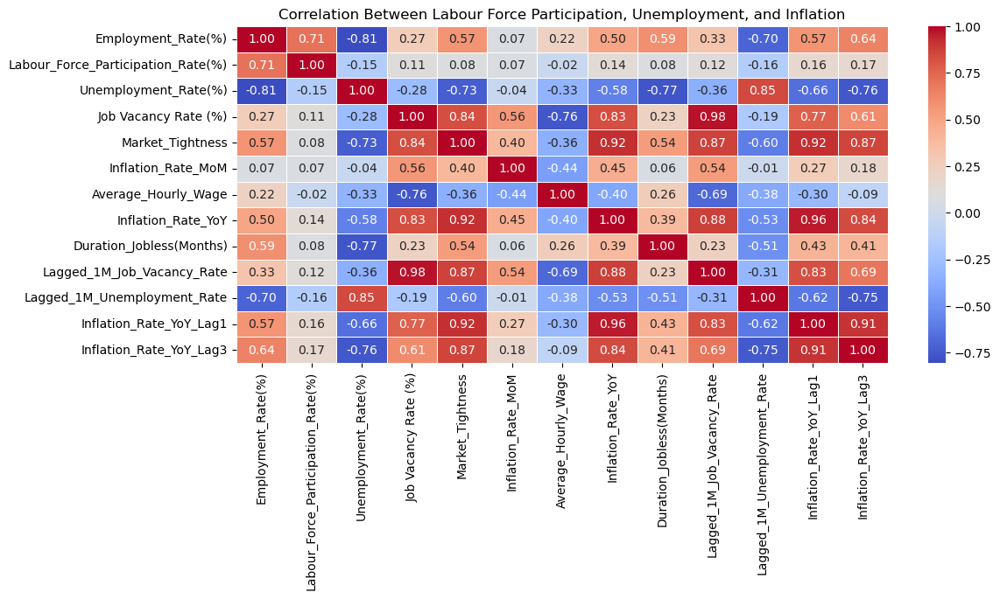

In [56]:
corr_variables = ['Employment_Rate(%)', 'Labour_Force_Participation_Rate(%)', 'Unemployment_Rate(%)', 'Job Vacancy Rate (%)', 'Market_Tightness', 'Inflation_Rate_MoM', 'Average_Hourly_Wage', 'Inflation_Rate_YoY', 'Duration_Jobless(Months)', 
                  'Lagged_1M_Job_Vacancy_Rate', 'Lagged_1M_Unemployment_Rate', 'Inflation_Rate_YoY_Lag1', 'Inflation_Rate_YoY_Lag3']
# Compute correlation
plt.figure(figsize=(12, 5))
sns.heatmap(overall_indicators[corr_variables].corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Between Labour Force Participation, Unemployment, and Inflation")
plt.show()

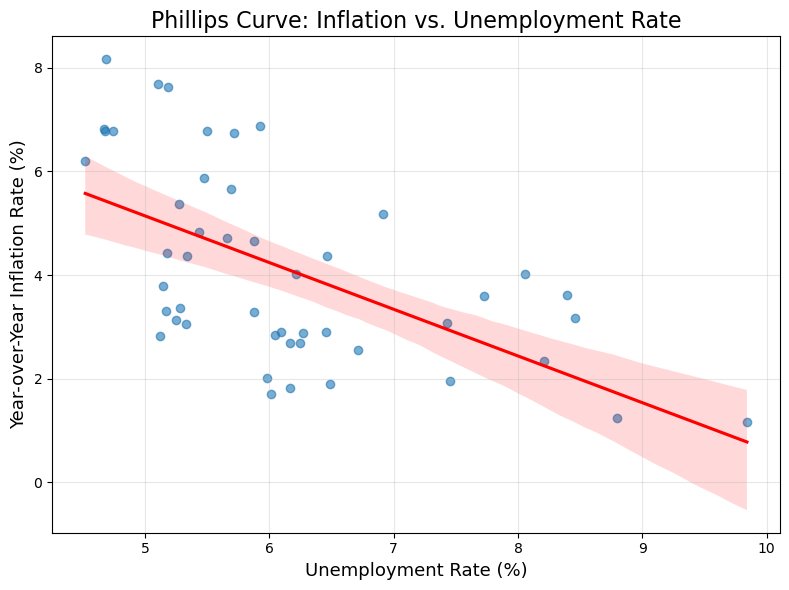

In [57]:
# Overall Phillips Curve
plt.figure(figsize=(8,6))

sns.regplot(
    data=overall_indicators,
    x='Unemployment_Rate(%)',
    y='Inflation_Rate_YoY',
    scatter_kws={'alpha':0.6},
    line_kws={'color':'red'}
)

plt.title('Phillips Curve: Inflation vs. Unemployment Rate', fontsize=16)
plt.xlabel('Unemployment Rate (%)', fontsize=13)
plt.ylabel('Year-over-Year Inflation Rate (%)', fontsize=13)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


### Exploring Relationships Between Inflation and Labour Market Indicators

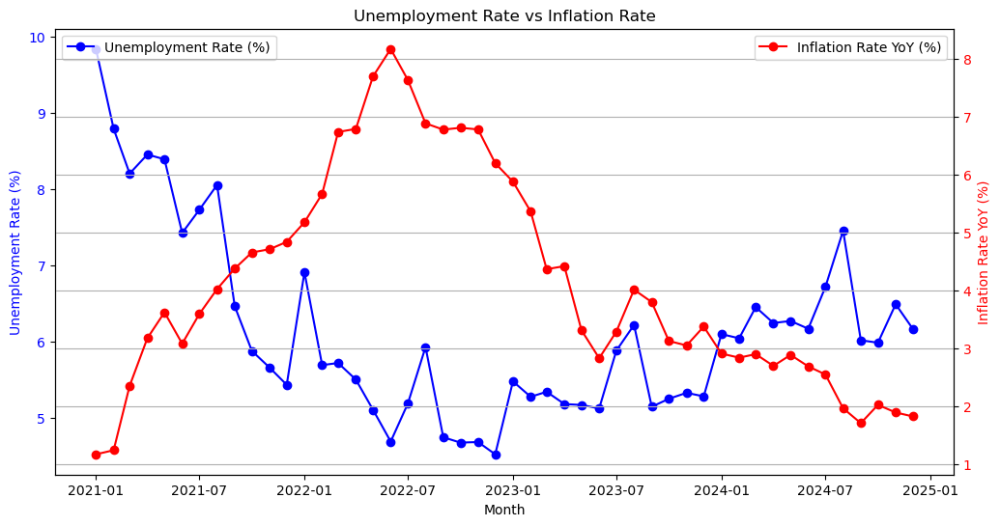

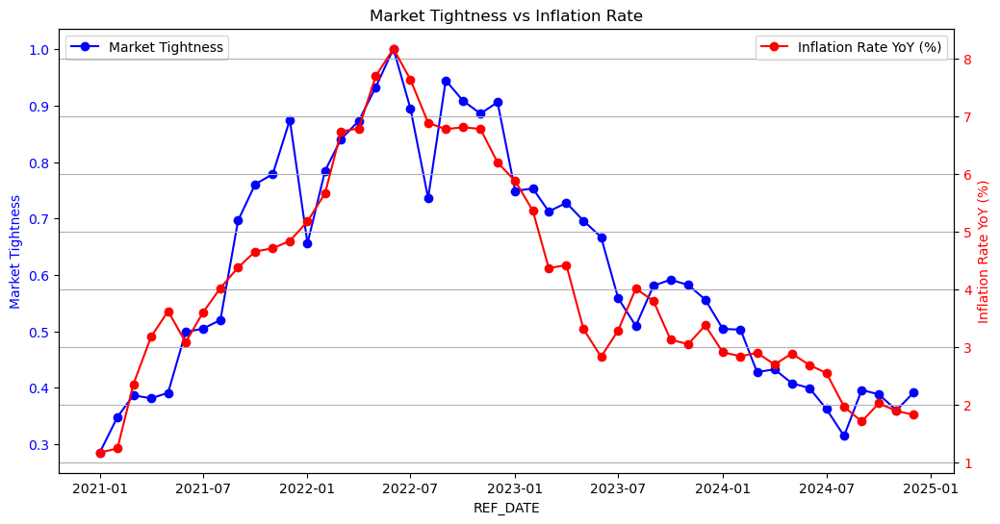

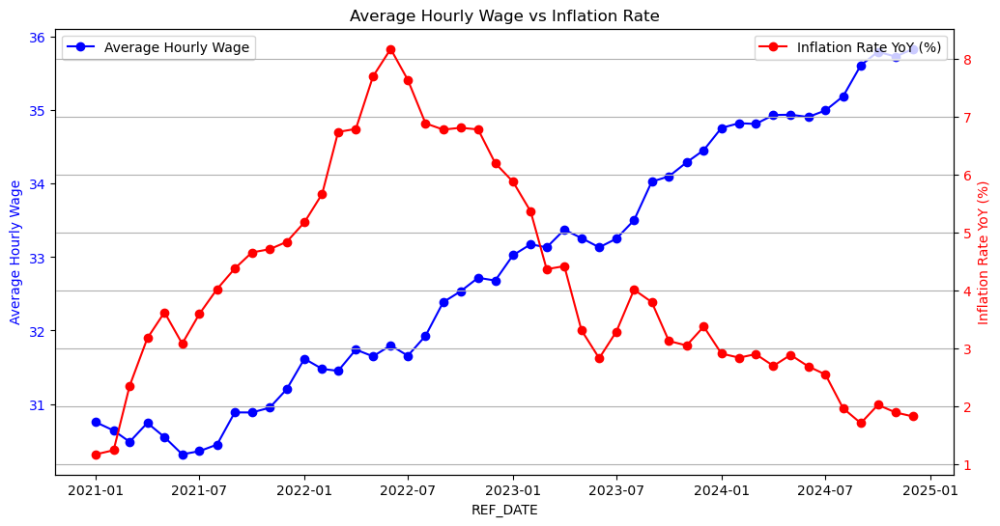

In [58]:
# Plot 1: Unemployment Rate vs Inflation Rate
fig, ax1 = plt.subplots(figsize=(12, 6))

# Primary y-axis for Unemployment Rate
ax1.set_xlabel('Month')
ax1.set_ylabel('Unemployment Rate (%)', color='blue')
ax1.plot(overall_indicators['REF_DATE'], overall_indicators['Unemployment_Rate(%)'], label='Unemployment Rate (%)', marker="o", color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Secondary y-axis for Inflation Rate
ax2 = ax1.twinx()
ax2.set_ylabel('Inflation Rate YoY (%)', color='red')
ax2.plot(overall_indicators['REF_DATE'], overall_indicators['Inflation_Rate_YoY'], label="Inflation Rate YoY (%)", marker="o", color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Title and formatting
plt.title("Unemployment Rate vs Inflation Rate")
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.grid()
plt.xticks(rotation=45)
plt.show()

# Plot 2: Market Tightness vs Inflation Rate
fig, ax1 = plt.subplots(figsize=(12, 6))

# Primary y-axis for Market Tightness
ax1.set_xlabel('REF_DATE')
ax1.set_ylabel('Market Tightness', color='blue')
ax1.plot(overall_indicators['REF_DATE'], overall_indicators['Market_Tightness'], label='Market Tightness', marker="o", color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Secondary y-axis for Inflation Rate
ax2 = ax1.twinx()
ax2.set_ylabel('Inflation Rate YoY (%)', color='red')
ax2.plot(overall_indicators['REF_DATE'], overall_indicators['Inflation_Rate_YoY'], label="Inflation Rate YoY (%)", marker="o", color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Title and formatting
plt.title("Market Tightness vs Inflation Rate")
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.grid()
plt.xticks(rotation=45)
plt.show()

# Plot 3: Average Hourly Wage vs Inflation Rate
fig, ax1 = plt.subplots(figsize=(12, 6))

# Primary y-axis for Average Hourly Wage
ax1.set_xlabel('REF_DATE')
ax1.set_ylabel('Average Hourly Wage', color='blue')
ax1.plot(overall_indicators['REF_DATE'], overall_indicators['Average_Hourly_Wage'], label='Average Hourly Wage', marker="o", color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Secondary y-axis for Inflation Rate
ax2 = ax1.twinx()
ax2.set_ylabel('Inflation Rate YoY (%)', color='red')
ax2.plot(overall_indicators['REF_DATE'], overall_indicators['Inflation_Rate_YoY'], label="Inflation Rate YoY (%)", marker="o", color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Title and formatting
plt.title("Average Hourly Wage vs Inflation Rate")
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.grid()
plt.xticks(rotation=45)
plt.show()


## Industry-Level Labour Market Analysis


/var/folders/n9/29yl9jnj61q74vg3ydjdf3qh0000gn/T/ipykernel_74272/3520352841.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=14)
/var/folders/n9/29yl9jnj61q74vg3ydjdf3qh0000gn/T/ipykernel_74272/3520352841.py:50: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


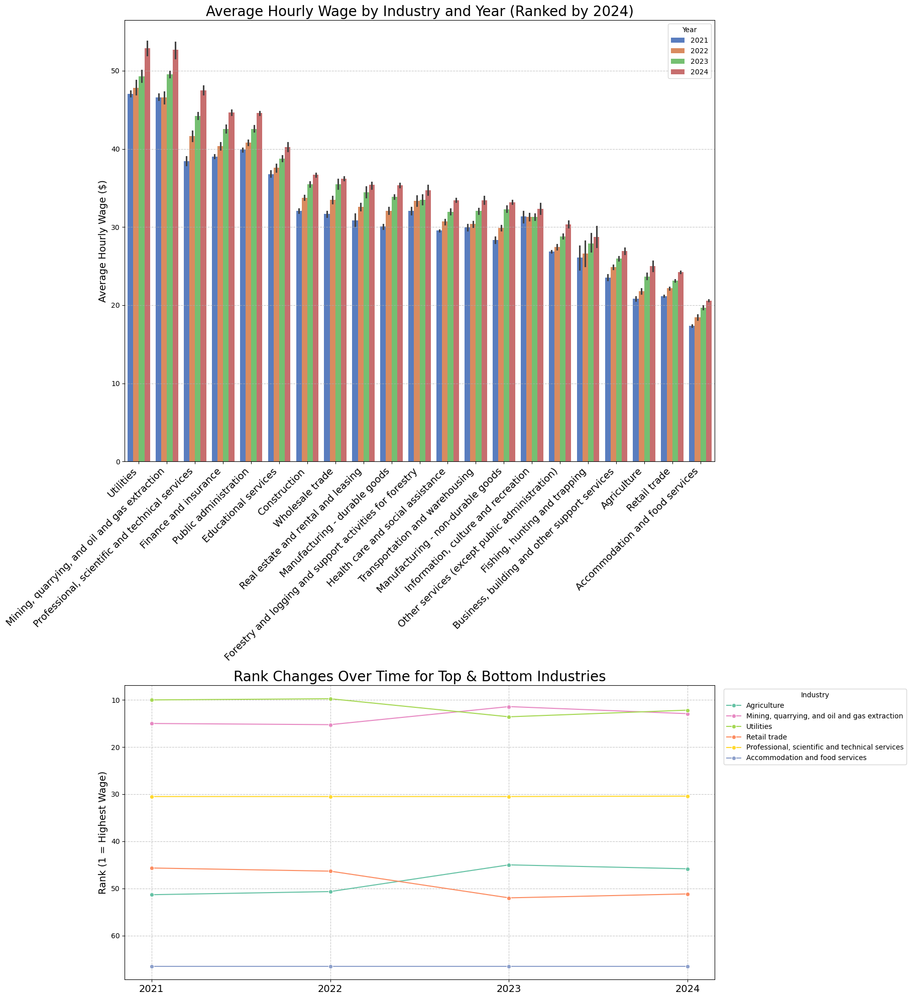

In [59]:
## Prepare data for the grouped bar chart (using 2024 for ordering)
industry_trends = monthly_industry_rates.copy()

## Filter for 2024 and sort industries by Average Hourly Wage
df_2024_agg = (
    industry_trends[industry_trends["Year"] == 2024]
    .groupby("NAICS_21_Label", as_index=False, observed=False)["Average_Hourly_Wage"]
    .mean()
)
df_2024_sorted = df_2024_agg.sort_values("Average_Hourly_Wage", ascending=False)
ordered_industries = df_2024_sorted["NAICS_21_Label"].tolist()


## Prepare data for the bump chart (focus on top and bottom industries based on 2024 ranking)
top_n = 3
bottom_n = 3

# Select top_n and bottom_n industries from the 2024 data
selected_industries = list(df_2024_sorted.head(top_n)["NAICS_21_Label"]) + \
                      list(df_2024_sorted.tail(bottom_n)["NAICS_21_Label"])

# Filter the full dataset for these industries
df_selected = industry_trends[industry_trends["NAICS_21_Label"].isin(selected_industries)].copy()

# For each year, compute the rank (with 1 = highest wage)
df_selected["Rank"] = df_selected.groupby("Year")["Average_Hourly_Wage"].rank(ascending=False)


## Create the combined figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(18, 20), gridspec_kw={'height_ratios': [3, 2]})

## Subplot 1: Grouped Bar Chart for Average Hourly Wage by Industry and Year
sns.barplot(
    data=industry_trends,
    x="NAICS_21_Label",
    y="Average_Hourly_Wage",
    hue="Year",
    order=ordered_industries, 
    palette="muted",
    ax=ax1
)
ax1.set_title("Average Hourly Wage by Industry and Year (Ranked by 2024)", fontsize=20)
ax1.set_xlabel("")
ax1.set_ylabel("Average Hourly Wage ($)", fontsize=14)
ax1.tick_params(axis="x", labelsize=12, labelrotation=45, right=True)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=14)
ax1.grid(axis="y", linestyle="--", alpha=0.7)

## Subplot 2: Bump Chart for Rank Changes Over Time for Top & Bottom Industries
sns.lineplot(
    data=df_selected,
    x="Year",
    y="Rank",
    hue="NAICS_21_Label",
    marker="o",
    palette="Set2",
    ax=ax2, 
    ci=None
)
ax2.set_title("Rank Changes Over Time for Top & Bottom Industries", fontsize=20)
ax2.set_xlabel("")
ax2.set_ylabel("Rank (1 = Highest Wage)", fontsize=14)
ax2.invert_yaxis()
ax2.set_xticks(sorted(industry_trends["Year"].unique()))
ax2.tick_params(axis="x", labelsize=14)
ax2.grid(True, linestyle="--", alpha=0.7)

## Filter the legend to only include selected industries
handles, labels = ax2.get_legend_handles_labels()
selected_labels = df_selected['NAICS_21_Label'].unique().tolist()
filtered = [(h, l) for h, l in zip(handles, labels) if l in selected_labels]

## Rebuild the legend with only the selected industries
if filtered:
    filtered_handles, filtered_labels = zip(*filtered)
    ax2.legend(filtered_handles, filtered_labels, title="Industry", bbox_to_anchor=(1.01, 1), loc='upper left')

## Adjust layout and show the plot
plt.subplots_adjust(right=1) 
plt.tight_layout()
plt.show()


/var/folders/n9/29yl9jnj61q74vg3ydjdf3qh0000gn/T/ipykernel_74272/1792155319.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("NAICS_21_Label", as_index=False)["Duration_Jobless(Months)"]
/var/folders/n9/29yl9jnj61q74vg3ydjdf3qh0000gn/T/ipykernel_74272/1792155319.py:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=14)
/var/folders/n9/29yl9jnj61q74vg3ydjdf3qh0000gn/T/ipykernel_74272/1792155319.py:44: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


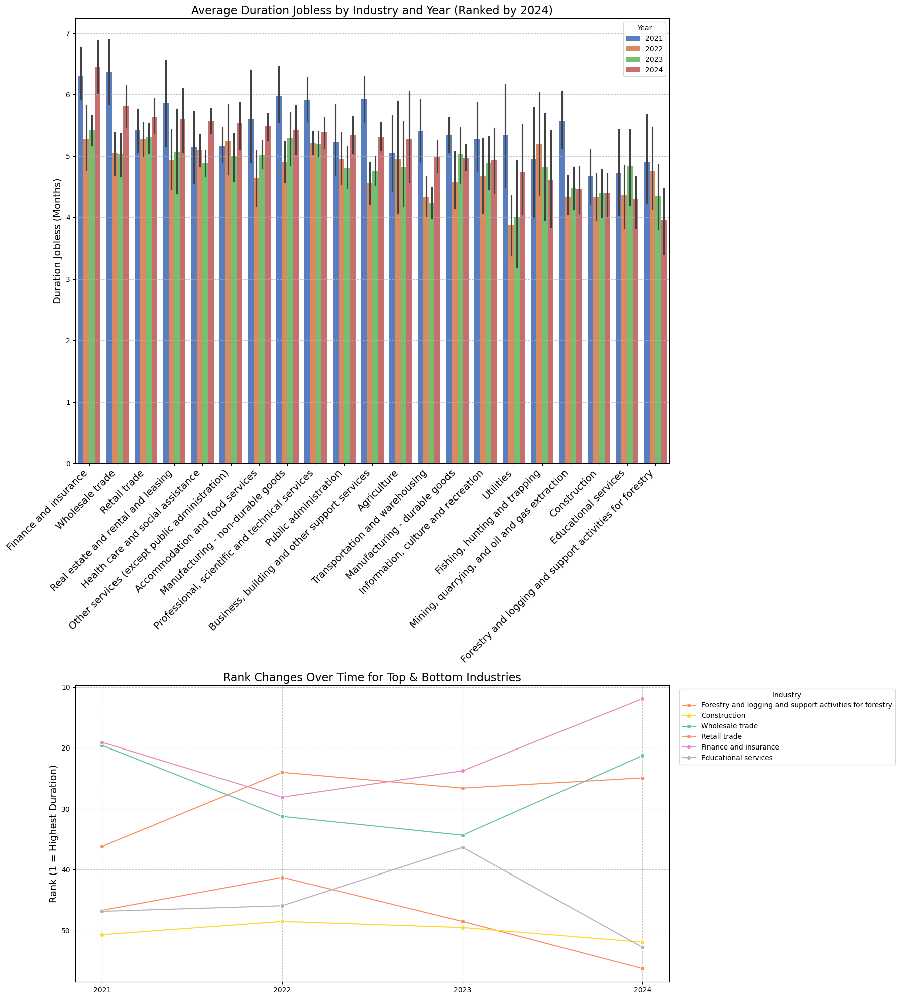

In [60]:
## Filter for 2024 and sort industries by Duration_Jobless
df_2024_agg = (
    industry_trends[industry_trends["Year"] == 2024]
    .groupby("NAICS_21_Label", as_index=False)["Duration_Jobless(Months)"]
    .mean()
)
df_2024_sorted = df_2024_agg.sort_values("Duration_Jobless(Months)", ascending=False)
ordered_industries = df_2024_sorted["NAICS_21_Label"].tolist()

## Select top_n and bottom_n industries from the 2024 data
selected_industries = list(df_2024_sorted.head(top_n)["NAICS_21_Label"]) + \
                      list(df_2024_sorted.tail(bottom_n)["NAICS_21_Label"])

## Filter the full dataset for these industries
df_selected = industry_trends[industry_trends["NAICS_21_Label"].isin(selected_industries)].copy()

## For each year, compute the rank (with 1 = highest wage)
df_selected["Rank"] = df_selected.groupby("Year")["Duration_Jobless(Months)"].rank(ascending=False)


## Create the combined figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(18, 20), gridspec_kw={'height_ratios': [3, 2]})

## Subplot 1: Grouped Bar Chart for Duration Jobless by Industry and Year
sns.barplot(
    data=industry_trends,
    x="NAICS_21_Label",
    y="Duration_Jobless(Months)",
    hue="Year",
    order=ordered_industries,
    estimator=np.mean,
    palette="muted",
    ax=ax1
)
ax1.set_title("Average Duration Jobless by Industry and Year (Ranked by 2024)", fontsize=16)
ax1.set_xlabel("")
ax1.set_ylabel("Duration Jobless (Months)", fontsize=14)
ax1.tick_params(axis="x", rotation=45)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=14)
ax1.grid(axis="y", linestyle="--", alpha=0.7)


## Subplot 2: Bump Chart for Rank Changes Over Time for Top & Bottom Industries
sns.lineplot(
    data=df_selected,
    x="Year",
    y="Rank",
    hue="NAICS_21_Label",
    marker="o",
    palette="Set2",
    ax=ax2, 
    ci=None
)
ax2.set_title("Rank Changes Over Time for Top & Bottom Industries", fontsize=16)
ax2.set_xlabel("")
ax2.set_ylabel("Rank (1 = Highest Duration)", fontsize=14)
ax2.invert_yaxis()  
ax2.set_xticks(sorted(industry_trends["Year"].unique()))
ax2.grid(True, linestyle="--", alpha=0.7)



## Filter the legend to only include selected industries
handles, labels = ax2.get_legend_handles_labels()
selected_labels = df_selected['NAICS_21_Label'].unique().tolist()
filtered = [(h, l) for h, l in zip(handles, labels) if l in selected_labels]

## Rebuild the legend with only the selected industries
if filtered:
    filtered_handles, filtered_labels = zip(*filtered)
    ax2.legend(filtered_handles, filtered_labels, title="Industry", bbox_to_anchor=(1.01, 1), loc='upper left')

plt.tight_layout()
plt.show()


/var/folders/n9/29yl9jnj61q74vg3ydjdf3qh0000gn/T/ipykernel_74272/2245804283.py:39: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize =14)
/var/folders/n9/29yl9jnj61q74vg3ydjdf3qh0000gn/T/ipykernel_74272/2245804283.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(


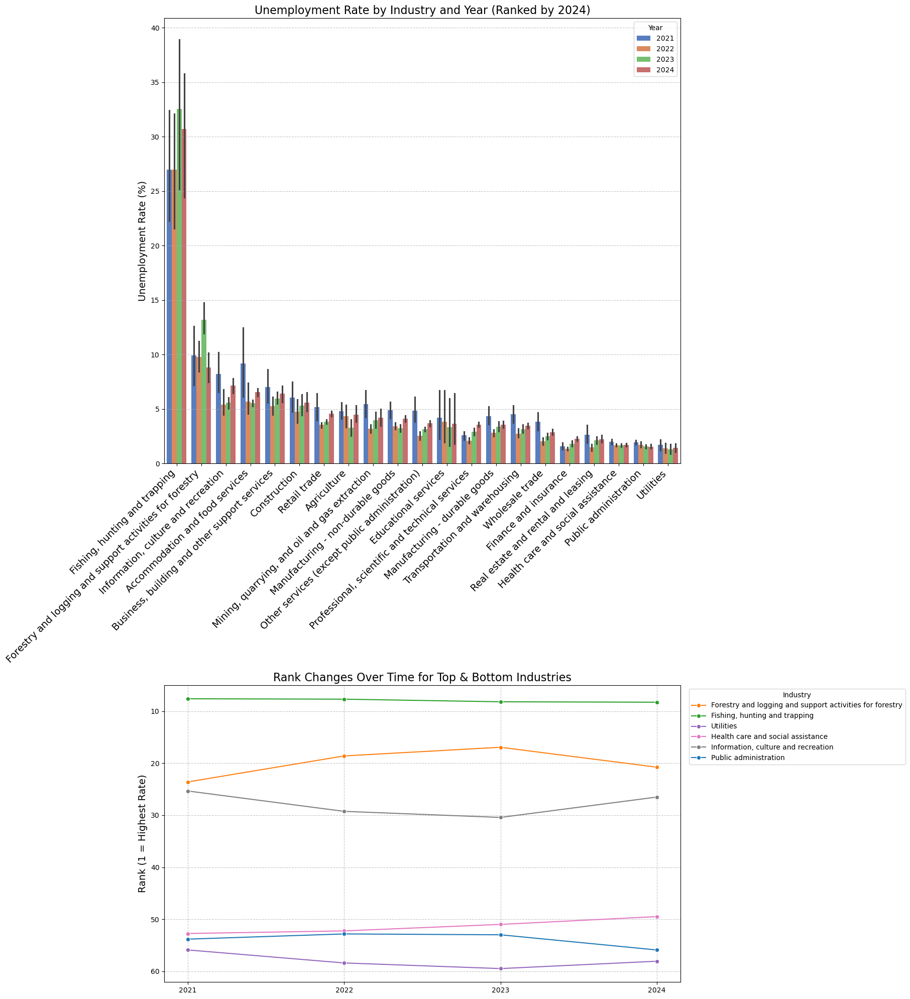

In [61]:
## Filter for 2024 and sort industries by Duration_Jobless
df_2024_agg = (
    industry_trends[industry_trends["Year"] == 2024]
    .groupby("NAICS_21_Label", as_index=False, observed=False)["Unemployment_Rate(%)"]
    .mean()
)
df_2024_sorted = df_2024_agg.sort_values("Unemployment_Rate(%)", ascending=False)
ordered_industries = df_2024_sorted["NAICS_21_Label"].tolist()

## Select top_n and bottom_n industries from the 2024 data
selected_industries = list(df_2024_sorted.head(top_n)["NAICS_21_Label"]) + \
                      list(df_2024_sorted.tail(bottom_n)["NAICS_21_Label"])

## Filter the full dataset for these industries
df_selected = industry_trends[industry_trends["NAICS_21_Label"].isin(selected_industries)].copy()

## For each year, compute the rank (with 1 = highest wage)
df_selected["Rank"] = df_selected.groupby("Year")["Unemployment_Rate(%)"].rank(ascending=False)


## Create the combined figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(18, 20), gridspec_kw={'height_ratios': [3, 2]})

# -- Subplot 1: Grouped Bar Chart --
sns.barplot(
    data=industry_trends,
    x="NAICS_21_Label",
    y="Unemployment_Rate(%)",
    hue="Year",
    order=ordered_industries,
    estimator=np.mean,
    palette="muted",
    ax=ax1
)
ax1.set_title("Unemployment Rate by Industry and Year (Ranked by 2024)", fontsize=16)
ax1.set_xlabel("")
ax1.set_ylabel("Unemployment Rate (%)", fontsize=14)
ax1.tick_params(axis="x", rotation=45)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize =14)
ax1.grid(axis="y", linestyle="--", alpha=0.7)

# -- Subplot 2: Bump Chart for Rank Changes --
sns.lineplot(
    data=df_selected,
    x="Year",
    y="Rank",
    hue="NAICS_21_Label",
    marker="o",
    palette="tab10",
    ax=ax2, 
    ci=None
)
ax2.set_title("Rank Changes Over Time for Top & Bottom Industries", fontsize=16)
ax2.set_xlabel("")
ax2.set_ylabel("Rank (1 = Highest Rate)", fontsize=14)
ax2.invert_yaxis()  # Invert so that rank 1 is at the top
ax2.set_xticks(sorted(industry_trends["Year"].unique()))
ax2.grid(True, linestyle="--", alpha=0.7)
ax2.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0)

## Filter the legend to only include selected industries
handles, labels = ax2.get_legend_handles_labels()
selected_labels = df_selected['NAICS_21_Label'].unique().tolist()
filtered = [(h, l) for h, l in zip(handles, labels) if l in selected_labels]

## Rebuild the legend with only the selected industries
if filtered:
    filtered_handles, filtered_labels = zip(*filtered)
    ax2.legend(filtered_handles, filtered_labels, title="Industry", bbox_to_anchor=(1.01, 1), loc='upper left')
plt.tight_layout()
plt.show()


/var/folders/n9/29yl9jnj61q74vg3ydjdf3qh0000gn/T/ipykernel_74272/777914554.py:38: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=14)


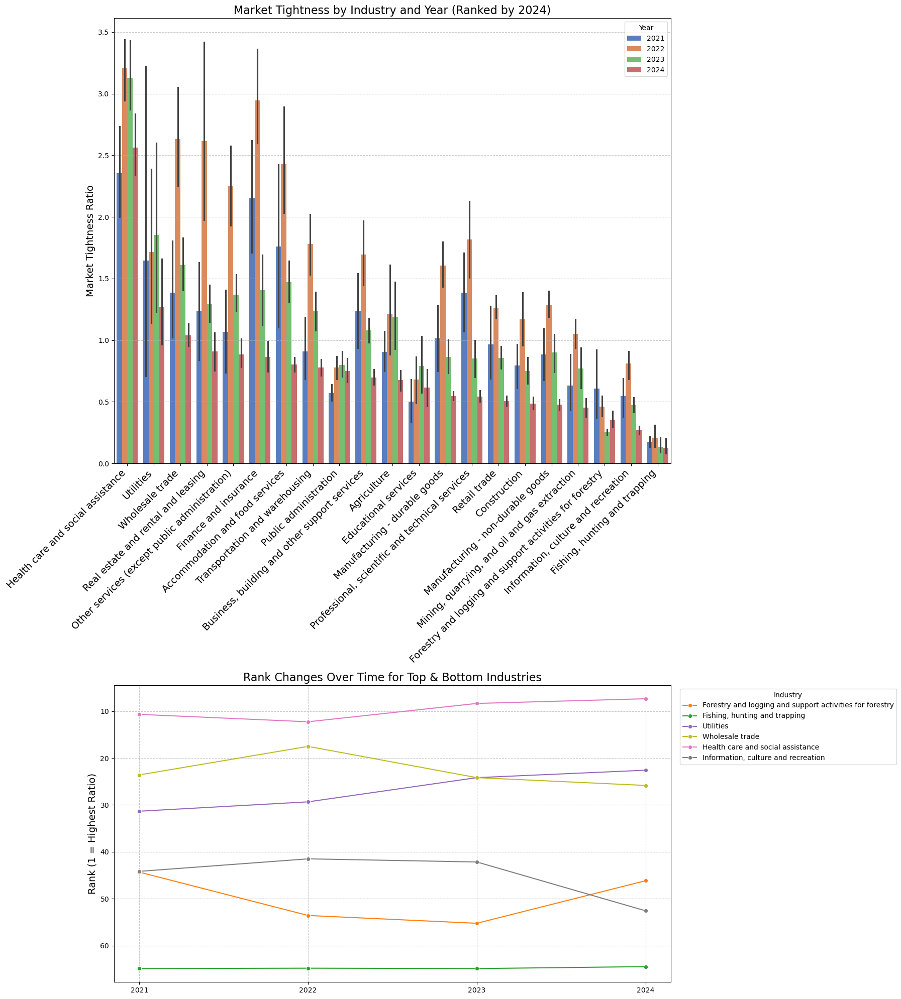

In [62]:
# Filter for 2024 and sort industries by Duration_Jobless
df_2024_agg = (
    industry_trends[industry_trends["Year"] == 2024]
    .groupby("NAICS_21_Label", as_index=False, observed=False)["Market_Tightness"]
    .mean()
)
df_2024_sorted = df_2024_agg.sort_values("Market_Tightness", ascending=False)
ordered_industries = df_2024_sorted["NAICS_21_Label"].tolist()

# Select top_n and bottom_n industries from the 2024 data
selected_industries = list(df_2024_sorted.head(top_n)["NAICS_21_Label"]) + \
                      list(df_2024_sorted.tail(bottom_n)["NAICS_21_Label"])

# Filter the full dataset for these industries
df_selected = industry_trends[industry_trends["NAICS_21_Label"].isin(selected_industries)].copy()

# For each year, compute the rank (with 1 = highest wage)
df_selected["Rank"] = df_selected.groupby("Year")["Market_Tightness"].rank(ascending=False)

# Create the combined figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(18, 20), gridspec_kw={'height_ratios': [3, 2]})

# Subplot 1: Grouped Bar Chart for Market Tightness by Industry and Year
sns.barplot(
    data=industry_trends,
    x="NAICS_21_Label",
    y="Market_Tightness",
    hue="Year",
    order=ordered_industries,
    estimator=np.mean, 
    palette="muted",
    ax=ax1
)
ax1.set_title("Market Tightness by Industry and Year (Ranked by 2024)", fontsize=16)
ax1.set_xlabel("")
ax1.set_ylabel("Market Tightness Ratio", fontsize=14)
ax1.tick_params(axis="x", rotation=45)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=14)
ax1.grid(axis="y", linestyle="--", alpha=0.7)

# -- Subplot 2: Bump Chart for Rank Changes --
sns.lineplot(
    data=df_selected,
    x="Year",
    y="Rank",
    hue="NAICS_21_Label",
    marker="o",
    palette="tab10",
    ax=ax2, 
    errorbar=None
)
ax2.set_title("Rank Changes Over Time for Top & Bottom Industries", fontsize=16)
ax2.set_xlabel("")
ax2.set_ylabel("Rank (1 = Highest Ratio)", fontsize=14)
ax2.invert_yaxis()  # Invert so that rank 1 is at the top
ax2.set_xticks(sorted(industry_trends["Year"].unique()))
ax2.grid(True, linestyle="--", alpha=0.7)
ax2.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0)

## Filter the legend to only include selected industries
handles, labels = ax2.get_legend_handles_labels()
selected_labels = df_selected['NAICS_21_Label'].unique().tolist()
filtered = [(h, l) for h, l in zip(handles, labels) if l in selected_labels]

## Rebuild the legend with only the selected industries
if filtered:
    filtered_handles, filtered_labels = zip(*filtered)
    ax2.legend(filtered_handles, filtered_labels, title="Industry", bbox_to_anchor=(1.01, 1), loc='upper left')

plt.tight_layout()
plt.show()


In [63]:
def plot_dual_axis(data, left_var, right_var, left_label, right_label, left_color='tab:blue', right_color='tab:red'):

    """This function creates a dual-axis time series plot for a given industry,
plotting one variable on the left y-axis and another on the right y-axis.
It is designed to be used inside a seaborn FacetGrid (one subplot per industry)."""

    ax = plt.gca()
    
    # Plot primary (left y-axis) variable
    ax.plot(data['REF_DATE'], data[left_var], color=left_color)
    ax.set_ylabel(left_label, color=left_color, fontsize=10)
    ax.tick_params(axis='y', labelcolor=left_color, labelsize=9)
    ax.tick_params(axis='x', labelsize=8)

    # Plot secondary (right y-axis) variable
    ax2 = ax.twinx()
    ax2.plot(data['REF_DATE'], data[right_var], color=right_color)
    ax2.set_ylabel(right_label, color=right_color, fontsize=10)
    ax2.tick_params(axis='y', labelcolor=right_color, labelsize=9)

    # Title each facet with industry name
    if 'NAICS_21_Label' in data.columns:
        ax.set_title(data['NAICS_21_Label'].iloc[0], fontsize=11)


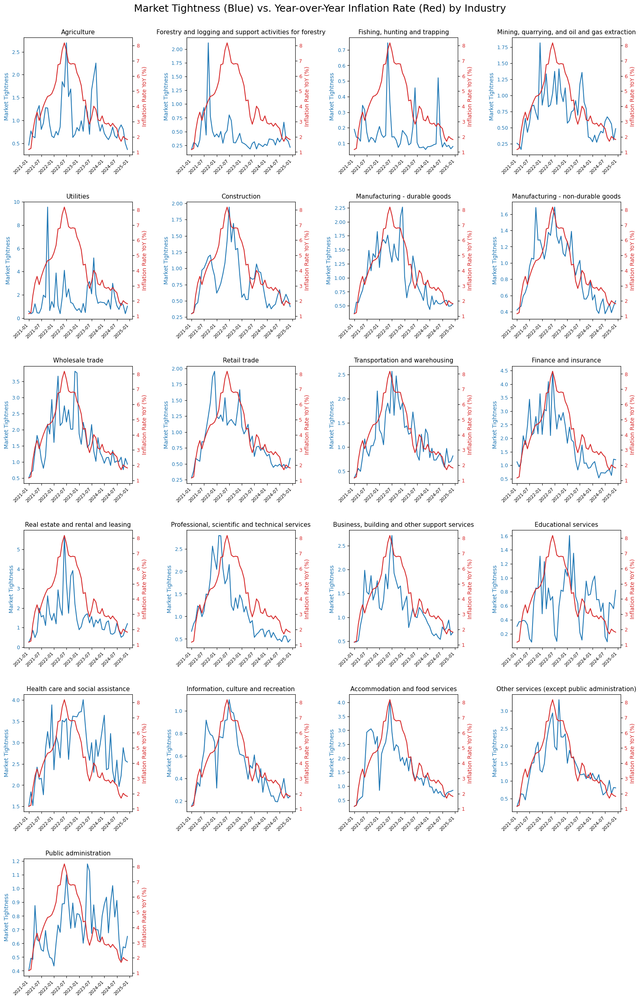

In [64]:
# Create a FacetGrid for all industries
g = sns.FacetGrid(
    industry_trends, 
    col="NAICS_21_Label", 
    col_wrap=4, 
    height=4,        
    sharex=False, 
    sharey=False
)

# Map function onto the FacetGrid
g.map_dataframe(lambda data, **kwargs: plot_dual_axis(
    data,
    left_var='Market_Tightness',
    right_var='Inflation_Rate_YoY',
    left_label='Market Tightness',
    right_label='Inflation Rate YoY (%)'
))

# Rotate x-axis labels in each facet
for ax in g.axes.flatten():
    for label in ax.get_xticklabels():
        label.set_rotation(45)
        label.set_ha('right')

# Adjust layout
plt.subplots_adjust(hspace=0.4, wspace=0.5)
plt.suptitle("Market Tightness (Blue) vs. Year-over-Year Inflation Rate (Red) by Industry", fontsize=18, y=1.02)
plt.show()


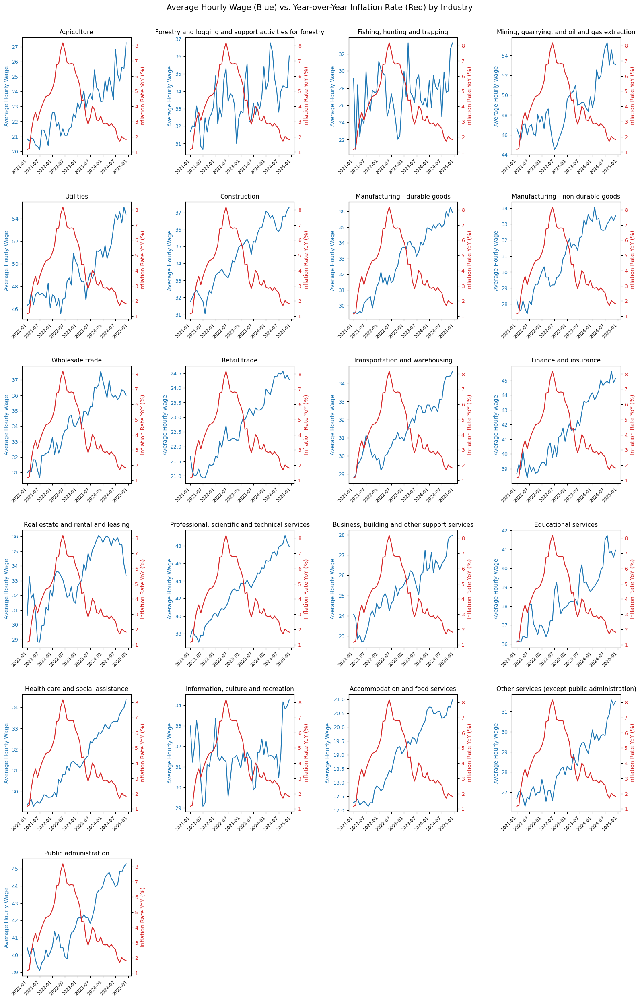

In [65]:
# Create the FacetGrid for all industries
g = sns.FacetGrid(
    industry_trends, 
    col="NAICS_21_Label", 
    col_wrap=4, 
    height=4, 
    sharex=False, 
    sharey=False
)

# Apply the reusable function using lambda to pass parameters
g.map_dataframe(lambda data, **kwargs: plot_dual_axis(
    data,
    left_var='Average_Hourly_Wage',
    right_var='Inflation_Rate_YoY',
    left_label='Average Hourly Wage',
    right_label='Inflation Rate YoY (%)'
))

# Rotate x-axis labels
for ax in g.axes.flatten():
    for label in ax.get_xticklabels():
        label.set_rotation(45)
        label.set_ha('right')

# Adjust layout and title
plt.subplots_adjust(hspace=0.4, wspace=0.5)
plt.suptitle("Average Hourly Wage (Blue) vs. Year-over-Year Inflation Rate (Red) by Industry", fontsize=14, y=1.02)
plt.show()


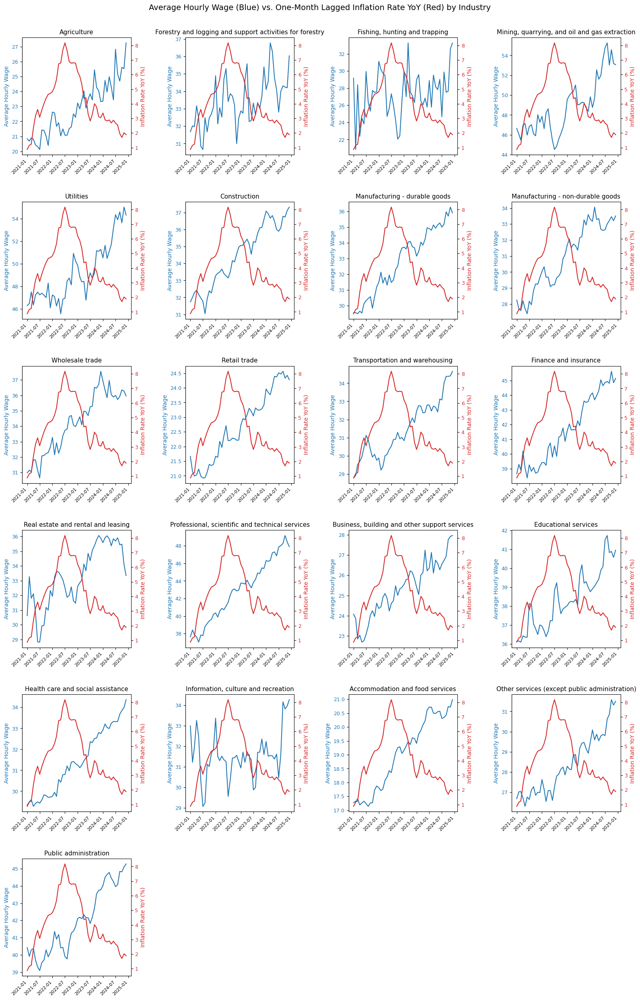

In [66]:
# Create the FacetGrid for all industries
g = sns.FacetGrid(
    industry_trends, 
    col="NAICS_21_Label", 
    col_wrap=4, 
    height=4, 
    sharex=False, 
    sharey=False
)

# Apply the reusable function using lambda to pass parameters
g.map_dataframe(lambda data, **kwargs: plot_dual_axis(
    data,
    left_var='Average_Hourly_Wage',
    right_var='Inflation_Rate_YoY_Lag1',
    left_label='Average Hourly Wage',
    right_label='Inflation Rate YoY (%)'
))

# Rotate x-axis labels
for ax in g.axes.flatten():
    for label in ax.get_xticklabels():
        label.set_rotation(45)
        label.set_ha('right')

# Adjust layout and title
plt.subplots_adjust(hspace=0.4, wspace=0.5)
plt.suptitle("Average Hourly Wage (Blue) vs. One-Month Lagged Inflation Rate YoY (Red) by Industry", fontsize=14, y=1.02)
plt.show()


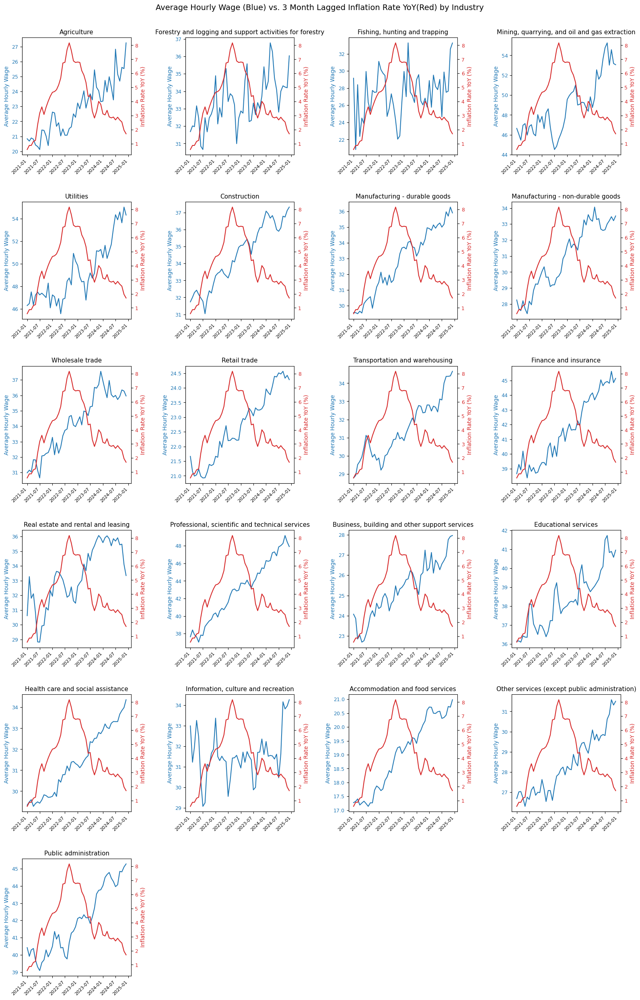

In [67]:
# Create the FacetGrid for all industries
g = sns.FacetGrid(
    industry_trends, 
    col="NAICS_21_Label", 
    col_wrap=4, 
    height=4, 
    sharex=False, 
    sharey=False
)

# Apply the reusable function using lambda to pass parameters
g.map_dataframe(lambda data, **kwargs: plot_dual_axis(
    data,
    left_var='Average_Hourly_Wage',
    right_var='Inflation_Rate_YoY_Lag3',
    left_label='Average Hourly Wage',
    right_label='Inflation Rate YoY (%)'
))

# Rotate x-axis labels
for ax in g.axes.flatten():
    for label in ax.get_xticklabels():
        label.set_rotation(45)
        label.set_ha('right')

# Adjust layout and title
plt.subplots_adjust(hspace=0.4, wspace=0.5)
plt.suptitle("Average Hourly Wage (Blue) vs. 3 Month Lagged Inflation Rate YoY(Red) by Industry", fontsize=14, y=1.02)
plt.show()


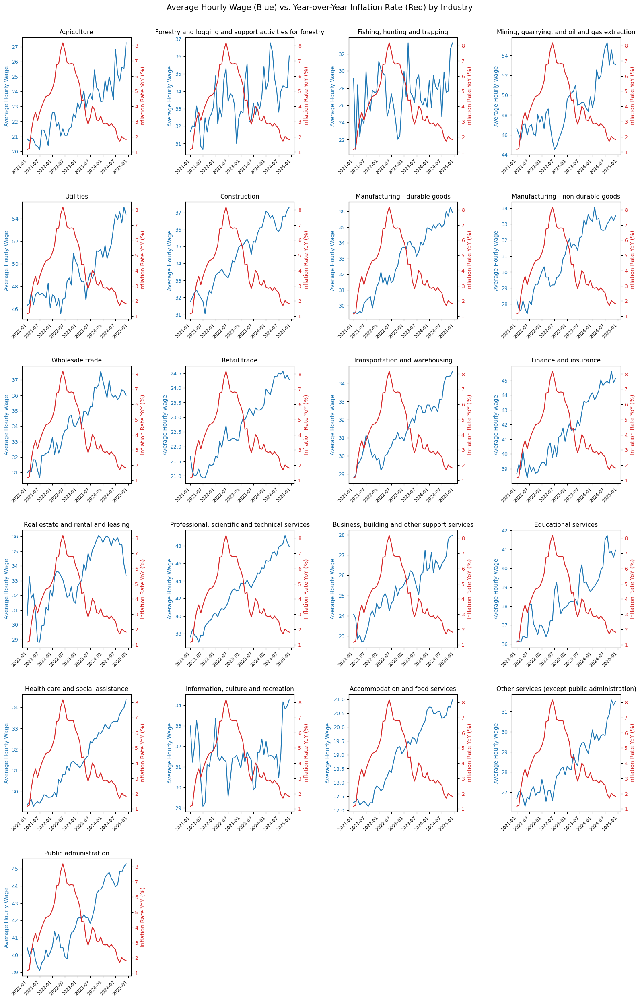

In [68]:
# Create the FacetGrid for all industries
g = sns.FacetGrid(
    industry_trends, 
    col="NAICS_21_Label", 
    col_wrap=4, 
    height=4, 
    sharex=False, 
    sharey=False
)

# Apply the reusable function using lambda to pass parameters
g.map_dataframe(lambda data, **kwargs: plot_dual_axis(
    data,
    left_var='Average_Hourly_Wage',
    right_var='Inflation_Rate_YoY',
    left_label='Average Hourly Wage',
    right_label='Inflation Rate YoY (%)'
))

# Rotate x-axis labels
for ax in g.axes.flatten():
    for label in ax.get_xticklabels():
        label.set_rotation(45)
        label.set_ha('right')

# Adjust layout and title
plt.subplots_adjust(hspace=0.4, wspace=0.5)
plt.suptitle("Average Hourly Wage (Blue) vs. Year-over-Year Inflation Rate (Red) by Industry", fontsize=14, y=1.02)
plt.show()


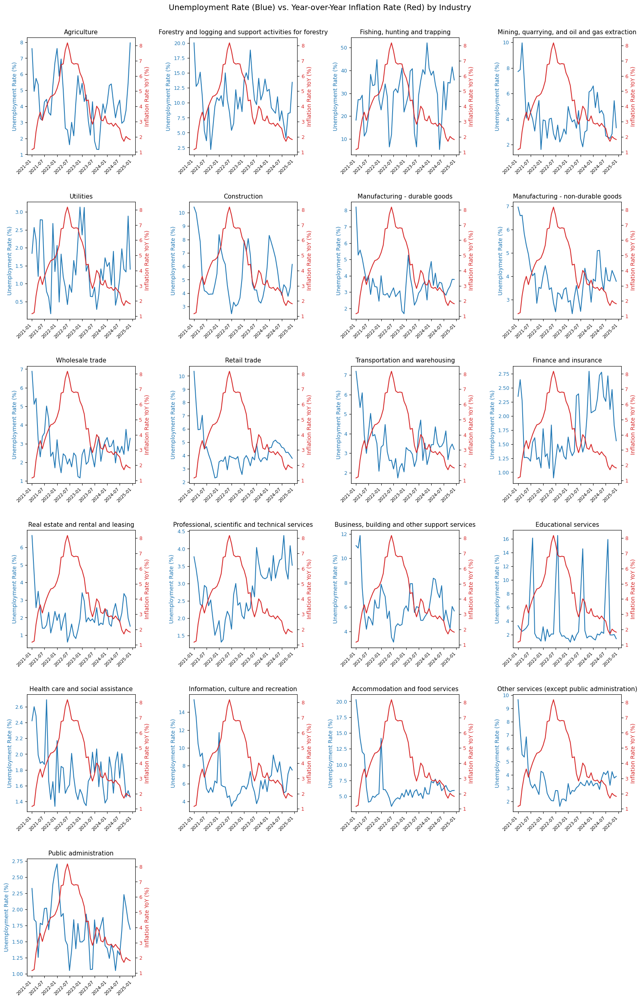

In [69]:
# Create the FacetGrid for all industries
g = sns.FacetGrid(
    industry_trends, 
    col="NAICS_21_Label", 
    col_wrap=4, 
    height=4, 
    sharex=False, 
    sharey=False
)

# Apply the reusable function using lambda to pass parameters
g.map_dataframe(lambda data, **kwargs: plot_dual_axis(
    data,
    left_var='Unemployment_Rate(%)',
    right_var='Inflation_Rate_YoY',
    left_label='Unemployment Rate (%)',
    right_label='Inflation Rate YoY (%)'
))

# Rotate x-axis labels
for ax in g.axes.flatten():
    for label in ax.get_xticklabels():
        label.set_rotation(45)
        label.set_ha('right')

# Adjust layout and title
plt.subplots_adjust(hspace=0.4, wspace=0.5)
plt.suptitle("Unemployment Rate (Blue) vs. Year-over-Year Inflation Rate (Red) by Industry", fontsize=14, y=1.02)
plt.show()


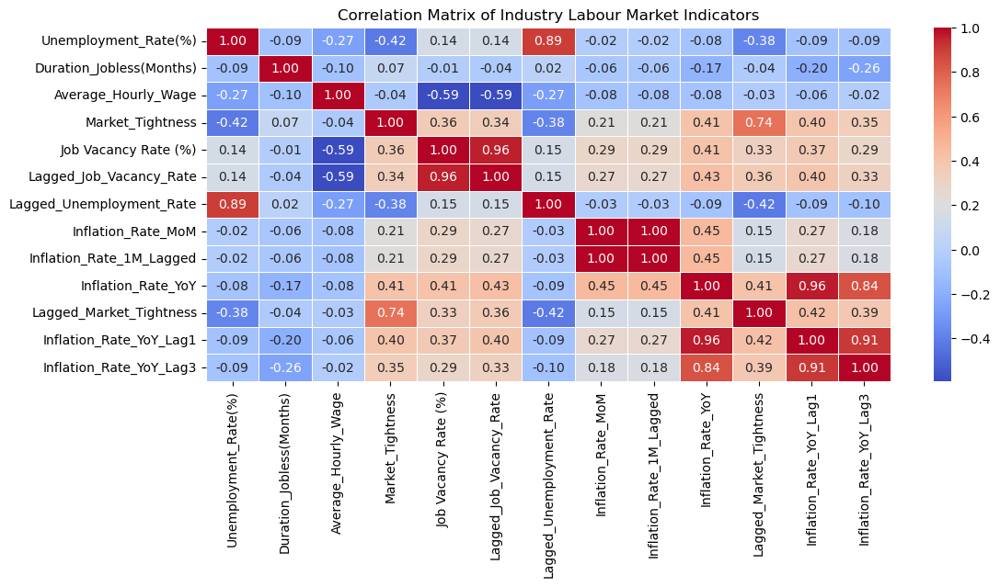

In [70]:
# Listing variables of interest
var_of_interest = (['Unemployment_Rate(%)', 'Duration_Jobless(Months)', 'Average_Hourly_Wage', 'Market_Tightness', 'Job Vacancy Rate (%)',
                    'Lagged_Job_Vacancy_Rate', 'Lagged_Unemployment_Rate', 'Inflation_Rate_MoM', 'Inflation_Rate_1M_Lagged', 
                    'Inflation_Rate_YoY', 'Lagged_Market_Tightness', 'Inflation_Rate_YoY_Lag1', 'Inflation_Rate_YoY_Lag3'])

# Compute correlation matrix
industry_trends_corr = industry_trends[var_of_interest].corr()

# Plot the correlation matrix
plt.figure(figsize=(12, 5))
sns.heatmap(industry_trends[var_of_interest].corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix of Industry Labour Market Indicators")
plt.show()


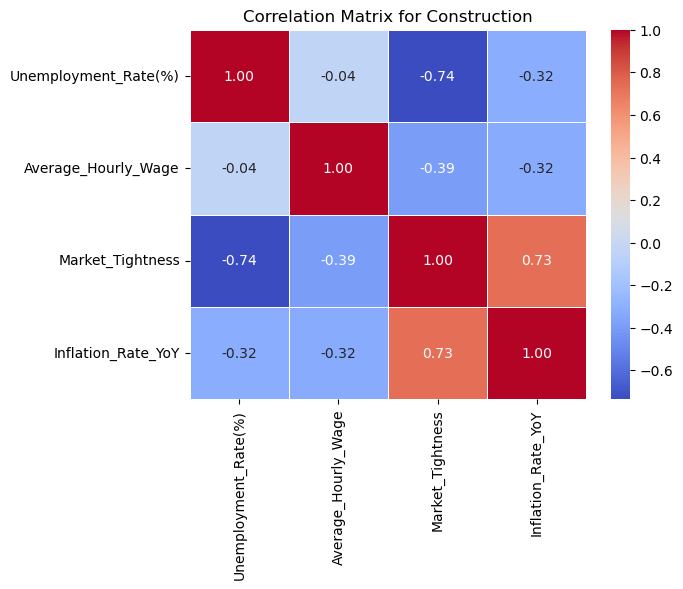


Correlation Matrix for Construction:

                      Unemployment_Rate(%)  Average_Hourly_Wage  Market_Tightness  Inflation_Rate_YoY
Unemployment_Rate(%)                 1.000               -0.043            -0.737              -0.315
Average_Hourly_Wage                 -0.043                1.000            -0.393              -0.324
Market_Tightness                    -0.737               -0.393             1.000               0.730
Inflation_Rate_YoY                  -0.315               -0.324             0.730               1.000


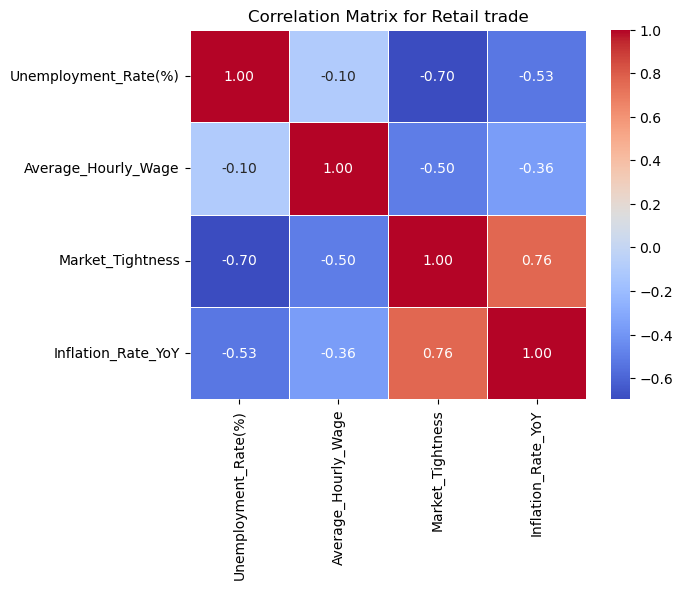


Correlation Matrix for Retail trade:

                      Unemployment_Rate(%)  Average_Hourly_Wage  Market_Tightness  Inflation_Rate_YoY
Unemployment_Rate(%)                 1.000               -0.100            -0.698              -0.530
Average_Hourly_Wage                 -0.100                1.000            -0.502              -0.363
Market_Tightness                    -0.698               -0.502             1.000               0.762
Inflation_Rate_YoY                  -0.530               -0.363             0.762               1.000


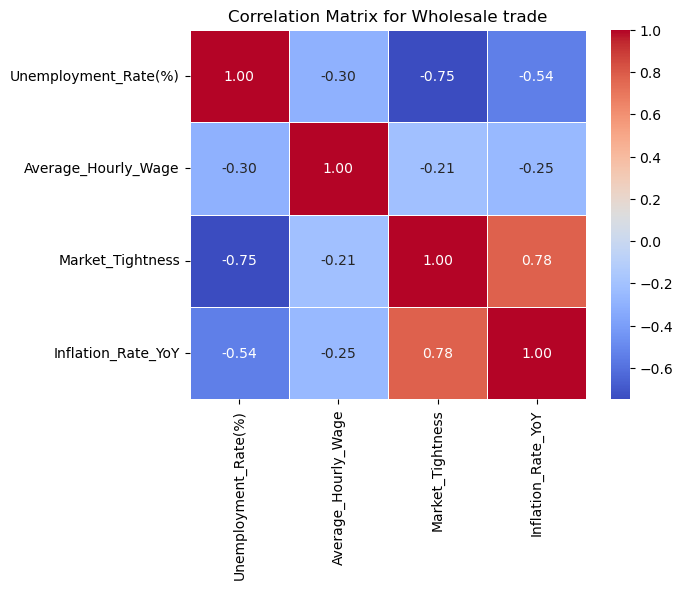


Correlation Matrix for Wholesale trade:

                      Unemployment_Rate(%)  Average_Hourly_Wage  Market_Tightness  Inflation_Rate_YoY
Unemployment_Rate(%)                 1.000               -0.302            -0.749              -0.540
Average_Hourly_Wage                 -0.302                1.000            -0.210              -0.255
Market_Tightness                    -0.749               -0.210             1.000               0.779
Inflation_Rate_YoY                  -0.540               -0.255             0.779               1.000


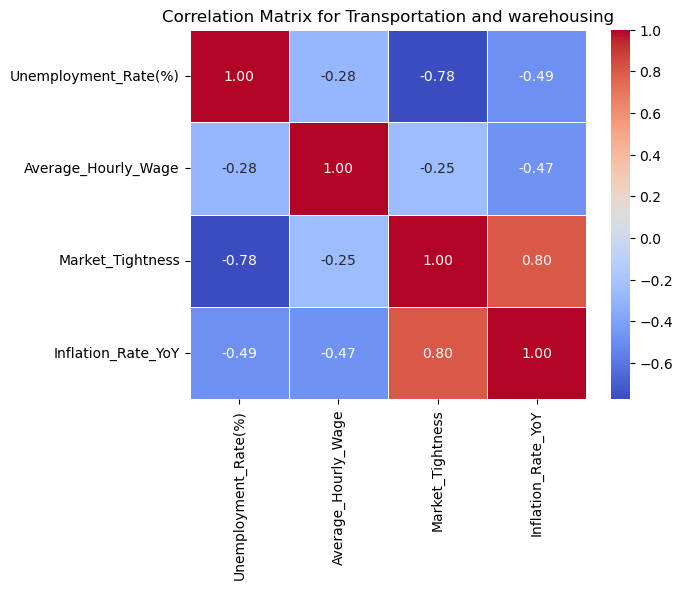


Correlation Matrix for Transportation and warehousing:

                      Unemployment_Rate(%)  Average_Hourly_Wage  Market_Tightness  Inflation_Rate_YoY
Unemployment_Rate(%)                 1.000               -0.285            -0.776              -0.487
Average_Hourly_Wage                 -0.285                1.000            -0.250              -0.472
Market_Tightness                    -0.776               -0.250             1.000               0.802
Inflation_Rate_YoY                  -0.487               -0.472             0.802               1.000


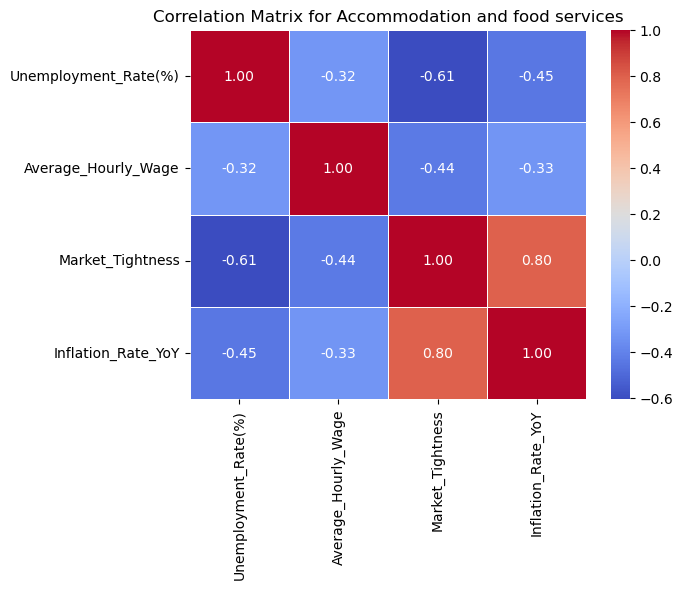


Correlation Matrix for Accommodation and food services:

                      Unemployment_Rate(%)  Average_Hourly_Wage  Market_Tightness  Inflation_Rate_YoY
Unemployment_Rate(%)                 1.000               -0.322            -0.607              -0.450
Average_Hourly_Wage                 -0.322                1.000            -0.438              -0.331
Market_Tightness                    -0.607               -0.438             1.000               0.797
Inflation_Rate_YoY                  -0.450               -0.331             0.797               1.000


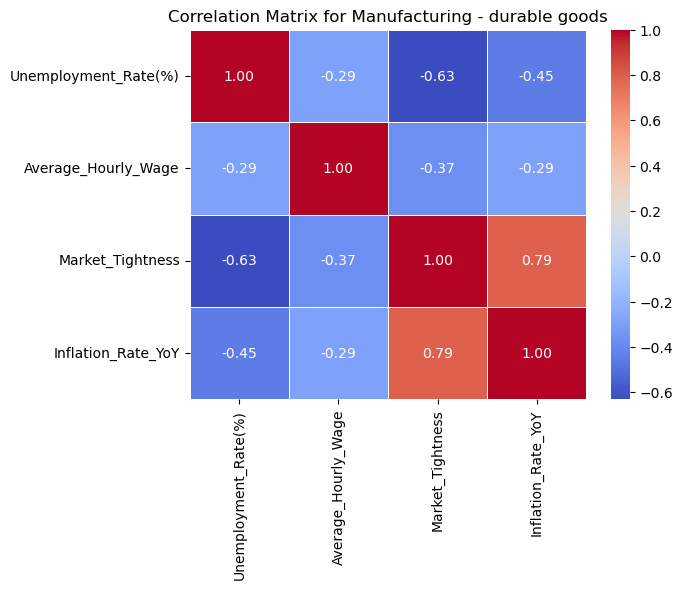


Correlation Matrix for Manufacturing - durable goods:

                      Unemployment_Rate(%)  Average_Hourly_Wage  Market_Tightness  Inflation_Rate_YoY
Unemployment_Rate(%)                 1.000               -0.292            -0.631              -0.447
Average_Hourly_Wage                 -0.292                1.000            -0.374              -0.293
Market_Tightness                    -0.631               -0.374             1.000               0.794
Inflation_Rate_YoY                  -0.447               -0.293             0.794               1.000


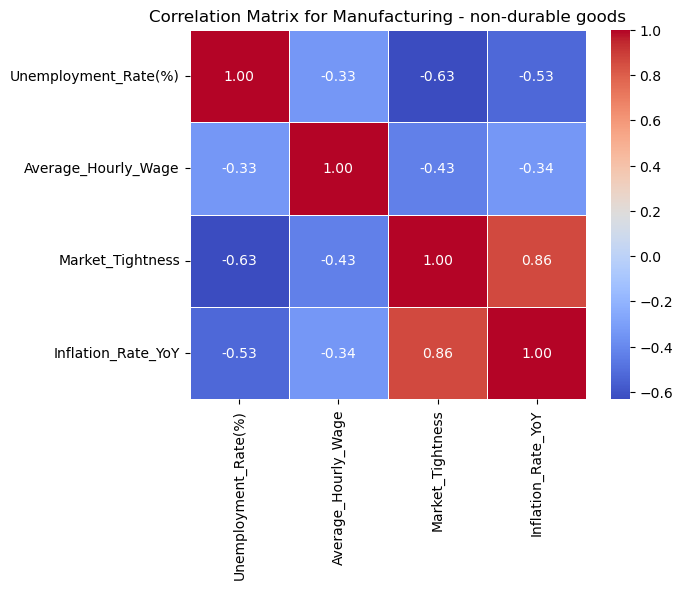


Correlation Matrix for Manufacturing - non-durable goods:

                      Unemployment_Rate(%)  Average_Hourly_Wage  Market_Tightness  Inflation_Rate_YoY
Unemployment_Rate(%)                 1.000               -0.334            -0.634              -0.529
Average_Hourly_Wage                 -0.334                1.000            -0.430              -0.340
Market_Tightness                    -0.634               -0.430             1.000               0.861
Inflation_Rate_YoY                  -0.529               -0.340             0.861               1.000


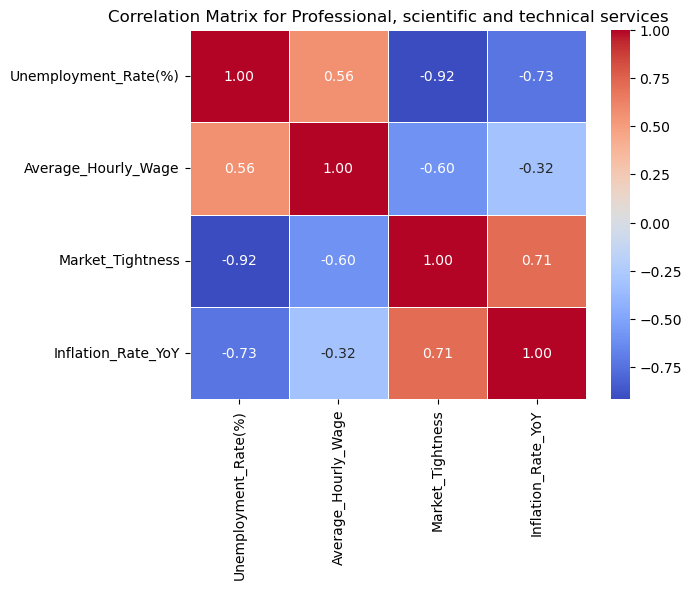


Correlation Matrix for Professional, scientific and technical services:

                      Unemployment_Rate(%)  Average_Hourly_Wage  Market_Tightness  Inflation_Rate_YoY
Unemployment_Rate(%)                 1.000                0.559            -0.916              -0.731
Average_Hourly_Wage                  0.559                1.000            -0.600              -0.316
Market_Tightness                    -0.916               -0.600             1.000               0.714
Inflation_Rate_YoY                  -0.731               -0.316             0.714               1.000


In [71]:
selected_industries = ['Construction', 'Retail trade', 'Wholesale trade', 'Transportation and warehousing',
 'Accommodation and food services', 'Manufacturing - durable goods',
 'Manufacturing - non-durable goods', 'Professional, scientific and technical services']

selected_var = ['Unemployment_Rate(%)', 'Average_Hourly_Wage', 'Market_Tightness', 
                'Inflation_Rate_YoY']
# Dictionary to store correlation matrices
industry_correlations = {}

# Loop through each selected industry
for industry in selected_industries:
    # Filter data for this industry
    df_ind = industry_trends[industry_trends['NAICS_21_Label'] == industry]
    
    # Subset the variables of interest
    df_subset = df_ind[selected_var].dropna()
    
    # Calculate correlation matrix
    corr_matrix = df_subset.corr()
    
    # Store in dictionary
    industry_correlations[industry] = corr_matrix

    sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
    plt.title(f"Correlation Matrix for {industry}")
    plt.show()
    
    # Optional: print or save
    print(f"\nCorrelation Matrix for {industry}:\n")
    print(corr_matrix)
    

## Demographic Influence on Labour Market Outcomes

### Metric Functions

In [72]:
def calculate_labour_market_indicators(LFS, category):
    """
    Calculate the weighted Labour Force Participation Rate (LFPR), Unemployment Rate, and Average Hourly Wage by a given category.

    Parameters:
    LFS (pd.DataFrame): The DataFrame containing the labour force survey data.
    category (str): The column name for which the indicators should be calculated.

    Returns:
    Tuple[pd.DataFrame, pd.DataFrame]: 
        - Monthly DataFrame with LFPR, Unemployment Rate, and Average Hourly Wage.
        - Overall DataFrame with average LFPR, Unemployment Rate, and Hourly Wage.
    """

    # Calculate total weighted labour force per category and month
    labour_force = (
        LFS[LFS['lf_status'].isin([1, 2, 3])]
        .groupby(['REF_DATE', category], as_index=False, observed=False)['final_wt']
        .sum()
        .rename(columns={'final_wt': 'weighted_labour_force'})
    )

    # Calculate total weighted working-age population per category and month
    working_age_pop = (
        LFS.groupby(['REF_DATE', category], as_index=False, observed=False)['final_wt']
        .sum()
        .rename(columns={'final_wt': 'weighted_working_age_pop'})
    )

    # Calculate total weighted unemployed per category and month
    unemployed_df = LFS[LFS["lf_status"] == 3]
    unemployed_per_month = (
        unemployed_df.groupby(['REF_DATE', category], as_index=False, observed=False)['final_wt']
        .sum()
        .rename(columns={'final_wt': 'weighted_unemployed'})
    )

    # Calculate weighted average hourly wage per month and category
    employed = LFS[LFS['lf_status'].isin([1, 2])]
    employed_df = employed[
        (employed['hourly_wage'] > 0) &  # ignore zero wages
        (~employed['hourly_wage'].isna())
    ].copy()  

    wage_per_month = (
        employed_df.groupby(['REF_DATE', category], as_index=False, observed=False)[['hourly_wage', 'final_wt']]
        .apply(lambda x: pd.Series({
            "avg_hourly_wage": (x['hourly_wage'] * x['final_wt']).sum() / x['final_wt'].sum()
        }))
        .reset_index(drop=True)  # Fix index issue
    )

    jobless_df = LFS[(LFS['lf_status'] == 3) & (LFS['duration_jobless'] > 0)].copy()

    duration_per_month = (
        jobless_df.groupby(['REF_DATE', category], as_index=False, observed=False)[['duration_jobless', 'final_wt']]
        .apply(lambda x: pd.Series({
            "avg_duration_jobless": (x['duration_jobless'] * x['final_wt']).sum() / x['final_wt'].sum()
        }))
        .reset_index(drop=True)
    )

    # Merge all DataFrames
    indicators_df = labour_force.merge(working_age_pop, on=['REF_DATE', category], how='left')
    indicators_df = indicators_df.merge(unemployed_per_month, on=['REF_DATE', category], how='left')
    indicators_df = indicators_df.merge(wage_per_month, on=['REF_DATE', category], how='left')
    indicators_df = indicators_df.merge(duration_per_month, on=['REF_DATE', category], how='left')

    # Compute LFPR and Unemployment Rate for monthly data
    indicators_df['LFPR_rate'] = (
        (indicators_df['weighted_labour_force'] / indicators_df['weighted_working_age_pop']) * 100
    ).round(2)

    indicators_df['unemployment_rate'] = (
        (indicators_df['weighted_unemployed'] / indicators_df['weighted_labour_force']) * 100
    ).round(2)

    # Calculate overall averages across all months
    total_labour_force = labour_force.groupby(category, as_index=False, observed=False)['weighted_labour_force'].sum()
    total_working_pop = working_age_pop.groupby(category, as_index=False, observed=False)['weighted_working_age_pop'].sum()
    total_unemployed = unemployed_per_month.groupby(category, as_index=False, observed=False)['weighted_unemployed'].sum()

    # Overall weighted average hourly wage
    overall_wage = (
        employed_df.groupby(category, as_index=False, observed=False)[['hourly_wage', 'final_wt']]
        .apply(lambda x: pd.Series({
            "overall_avg_hourly_wage": (x['hourly_wage'] * x['final_wt']).sum() / x['final_wt'].sum()
        }))
        .reset_index(drop=True)
    )

    # Overall jobless duration
    overall_duration = (
        jobless_df.groupby(category, as_index=False, observed=False)[['duration_jobless', 'final_wt']]
        .apply(lambda x: pd.Series({
            "overall_avg_duration_jobless": (x['duration_jobless'] * x['final_wt']).sum() / x['final_wt'].sum()
        }))
        .reset_index(drop=True)
    )

    overall_df = total_labour_force.copy()
    overall_df.rename(columns={'weighted_labour_force': 'sum_weighted_labour_force'}, inplace=True)

    # Merge totals: Note that total_working_pop has the column "weighted_working_age_pop"
    overall_df = overall_df.merge(total_working_pop, on=category, how='left')
    overall_df = overall_df.merge(total_unemployed, on=category, how='left')
    # Rename the merged columns appropriately
    overall_df.rename(columns={
        'weighted_working_age_pop': 'sum_weighted_working_pop',
        'weighted_unemployed': 'sum_weighted_unemployed'
    }, inplace=True)

    # Compute overall rates
    overall_df["overall_LFPR_rate"] = (
        overall_df["sum_weighted_labour_force"] / overall_df["sum_weighted_working_pop"] * 100
    ).round(2)

    overall_df["overall_unemployment_rate"] = (
        overall_df["sum_weighted_unemployed"] / overall_df["sum_weighted_labour_force"] * 100
    ).round(2)

    # Merge with wage & duration data
    overall_df = overall_df.merge(overall_wage, on=category, how="left")
    overall_df = overall_df.merge(overall_duration, on=category, how="left")

    return indicators_df, overall_df

In [73]:
def calculate_labour_market_indicators_two_categories(LFS, category1, category2):
    """
    Calculate the weighted Labour Force Participation Rate (LFPR), Unemployment Rate, 
    and Average Hourly Wage by two given categories.

    Parameters:
    LFS (pd.DataFrame): The DataFrame containing the labour force survey data.
    category1 (str): The first category column name.
    category2 (str): The second category column name.

    Returns:
    Tuple[pd.DataFrame, pd.DataFrame]: 
        - Monthly DataFrame with LFPR, Unemployment Rate, and Average Hourly Wage.
        - Overall DataFrame with average LFPR, Unemployment Rate, and Hourly Wage.
    """
    group_cols = ['REF_DATE', category1, category2]

    # Calculate total weighted labour force per category combination and month
    labour_force = (
        LFS[LFS['lf_status'].isin([1, 2, 3])]
        .groupby(group_cols, as_index=False, observed=False)['final_wt']
        .sum()
        .rename(columns={'final_wt': 'weighted_labour_force'})
    )

    # Calculate total weighted working-age population per category combination and month
    working_age_pop = (
        LFS.groupby(group_cols, as_index=False, observed=False)['final_wt']
        .sum()
        .rename(columns={'final_wt': 'weighted_working_age_pop'})
    )

    # Calculate total weighted unemployed per category combination and month
    unemployed_df = LFS[LFS["lf_status"] == 3]
    unemployed_per_month = (
        unemployed_df.groupby(group_cols, as_index=False, observed=False)['final_wt']
        .sum()
        .rename(columns={'final_wt': 'weighted_unemployed'})
    )

    # Calculate weighted average hourly wage per month and category combination
    employed = LFS[LFS['lf_status'].isin([1, 2])]
    # Fix: call .copy() with parentheses
    employed_df = employed[(employed['hourly_wage'] > 0)].copy()

    wage_per_month = (
        employed_df.groupby(group_cols, as_index=False, observed=False)[['hourly_wage', 'final_wt']]
        .apply(lambda x: pd.Series({
            "avg_hourly_wage": (x['hourly_wage'] * x['final_wt']).sum() / x['final_wt'].sum()
        }))
        .reset_index(drop=True)  # Fix index issue
    )

    # Weighted average jobless duration => ignoring zero durations
    jobless_df = LFS[(LFS['lf_status'] == 3) & (LFS['duration_jobless'] > 0)].copy()

    duration_per_month = (
        jobless_df.groupby(group_cols, as_index=False, observed=False)[['duration_jobless', 'final_wt']]
        .apply(lambda x: pd.Series({
            "avg_duration_jobless": (x['duration_jobless'] * x['final_wt']).sum() / x['final_wt'].sum()
        }))
        .reset_index(drop=True)
    )

    # Merge all DataFrames
    indicators_df = labour_force.merge(working_age_pop, on=group_cols, how='left')
    indicators_df = indicators_df.merge(unemployed_per_month, on=group_cols, how='left')
    indicators_df = indicators_df.merge(wage_per_month, on=group_cols, how='left')
    indicators_df = indicators_df.merge(duration_per_month, on=group_cols, how='left')

    # Compute LFPR and Unemployment Rate (monthly)
    indicators_df['LFPR_rate'] = (
        (indicators_df['weighted_labour_force'] / indicators_df['weighted_working_age_pop']) * 100
    ).round(2)

    indicators_df['unemployment_rate'] = (
        (indicators_df['weighted_unemployed'] / indicators_df['weighted_labour_force']) * 100
    ).round(2)

    # Calculate overall averages across all months
    total_labour_force = labour_force.groupby([category1, category2], as_index=False, observed=False)['weighted_labour_force'].sum()
    total_working_pop = working_age_pop.groupby([category1, category2], as_index=False, observed=False)['weighted_working_age_pop'].sum()
    total_unemployed = unemployed_per_month.groupby([category1, category2], as_index=False, observed=False)['weighted_unemployed'].sum()

    # Overall weighted average hourly wage
    overall_wage = (
        employed_df.groupby([category1, category2], as_index=False, observed=False)[['hourly_wage', 'final_wt']]
        .apply(lambda x: pd.Series({
            "overall_avg_hourly_wage": (x['hourly_wage'] * x['final_wt']).sum() / x['final_wt'].sum()
        }))
        .reset_index(drop=True)
    )

    overall_duration = (
        jobless_df.groupby([category1, category2], as_index=False, observed=False)[['duration_jobless', 'final_wt']]
        .apply(lambda x: pd.Series({
            "overall_avg_duration_jobless": (x['duration_jobless'] * x['final_wt']).sum() / x['final_wt'].sum()
        }))
        .reset_index(drop=True)
    )

    overall_df = total_labour_force.copy()
    overall_df.rename(columns={'weighted_labour_force': 'sum_weighted_labour_force'}, inplace=True)

    # Merge totals
    overall_df = overall_df.merge(total_working_pop, on=[category1, category2], how='left')
    overall_df = overall_df.merge(total_unemployed, on=[category1, category2], how='left')
    overall_df.rename(columns={
        'weighted_working_age_pop': 'sum_weighted_working_pop',
        'weighted_unemployed': 'sum_weighted_unemployed'
    }, inplace=True)

    overall_df["overall_LFPR_rate"] = (
        overall_df["sum_weighted_labour_force"] / overall_df["sum_weighted_working_pop"] * 100
    ).round(2)

    overall_df["overall_unemployment_rate"] = (
        overall_df["sum_weighted_unemployed"] / overall_df["sum_weighted_labour_force"] * 100
    ).round(2)

    # Merge with wage & duration data
    overall_df = overall_df.merge(overall_wage, on=[category1, category2], how="left")
    overall_df = overall_df.merge(overall_duration, on=[category1, category2], how="left")

    return indicators_df, overall_df



### Visualizing Demographic Labour Market Trends

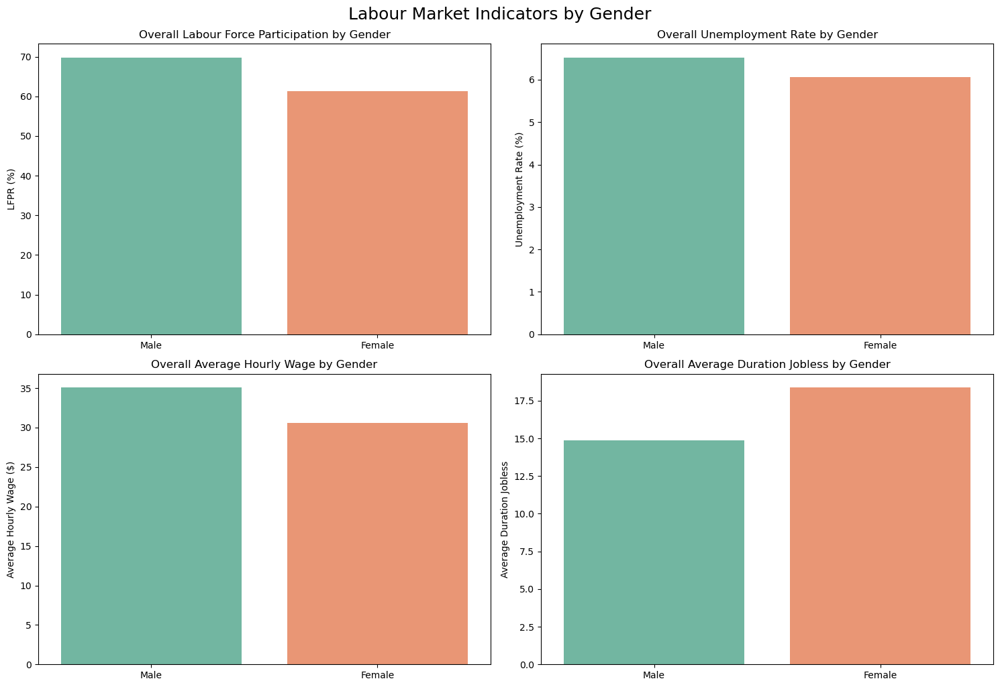

In [74]:
# Calculate labour market indicators by Gender
monthly_rates_by_gender, overall_rates_by_gender = calculate_labour_market_indicators(LFS, 'gender')

# Mapping for gender
gender_labels = {1: 'Male', 2: 'Female'}

# Copy data and apply label mapping
plot_data = overall_rates_by_gender.copy()
plot_data['gender'] = plot_data['gender'].astype('object').replace(gender_labels)

# Set categorical order for consistent plotting
plot_data['gender'] = pd.Categorical(
    plot_data['gender'],
    categories=['Male', 'Female'],
    ordered=True
)

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Plot 1: Overall Labour Force Participation Rate by Gender
sns.barplot(data=plot_data, x='gender', y='overall_LFPR_rate', hue='gender', ax=axes[0,0], palette='Set2', legend=False)
axes[0,0].set_title('Overall Labour Force Participation by Gender')
axes[0,0].set_ylabel('LFPR (%)')
axes[0,0].set_xlabel('')

# Plot 2: Overall Unemployment Rate by Gender
sns.barplot(data=plot_data, x='gender', y='overall_unemployment_rate', hue='gender', ax=axes[0,1], palette='Set2', legend=False)
axes[0,1].set_title('Overall Unemployment Rate by Gender')
axes[0,1].set_ylabel('Unemployment Rate (%)')
axes[0,1].set_xlabel('')

# Plot 3: Overall Hourly Wage by Gender
sns.barplot(data=plot_data, x='gender', y='overall_avg_hourly_wage', hue='gender', ax=axes[1,0], palette='Set2', legend=False)
axes[1,0].set_title('Overall Average Hourly Wage by Gender')
axes[1,0].set_ylabel('Average Hourly Wage ($)')
axes[1,0].set_xlabel('')

# Plot 4: Overall Average Duration Jobless by Gender
sns.barplot(data=plot_data, x='gender', y='overall_avg_duration_jobless', hue='gender', ax=axes[1,1], palette='Set2', legend=False)
axes[1,1].set_title('Overall Average Duration Jobless by Gender')
axes[1,1].set_ylabel('Average Duration Jobless')
axes[1,1].set_xlabel('')

# Adjust layout and spacing
plt.tight_layout()
plt.suptitle("Labour Market Indicators by Gender", fontsize=18, y=1.02)
plt.show()


**Interpretation**

- Men participate more in the labour force and earn higher wages on average.
- Women experience slightly longer durations of unemployment.
- Unemployment rates are similar between genders, with slightly lower for women.

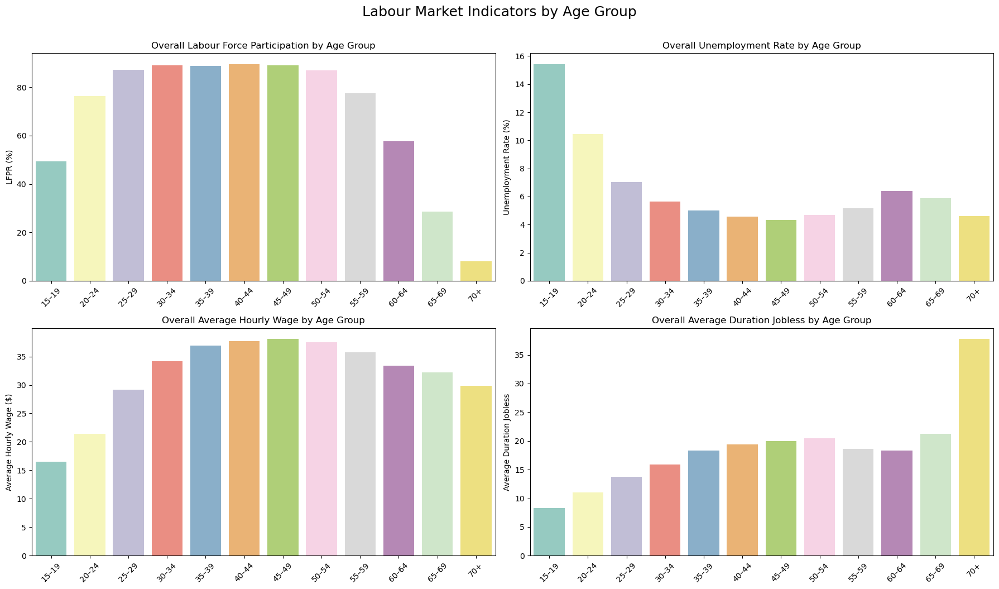

In [75]:
# Calculate labour market indicators by Age Group
monthly_rates_by_age, overall_rates_by_age = calculate_labour_market_indicators(LFS, 'age_5y_group')

# Define age group labels
age_labels = {
    1: '15–19',
    2: '20–24',
    3: '25–29',
    4: '30–34',
    5: '35–39',
    6: '40–44',
    7: '45–49',
    8: '50–54',
    9: '55–59',
    10: '60–64',
    11: '65–69',
    12: '70+'
}

# Prepare data with mapped labels
plot_data = overall_rates_by_age.copy()
plot_data['age_5y_group'] = plot_data['age_5y_group'].astype('object').replace(age_labels)

# Ensure consistent order in plotting
plot_data['age_5y_group'] = pd.Categorical(
    plot_data['age_5y_group'],
    categories=['15–19', '20–24', '25–29', '30–34', '35–39', '40–44',
                '45–49', '50–54', '55–59', '60–64', '65–69', '70+'],
    ordered=True
)

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# Plot 1: LFPR
sns.barplot(data=plot_data, x='age_5y_group', y='overall_LFPR_rate', hue='age_5y_group', ax=axes[0,0], palette='Set3', legend=False)
axes[0,0].set_title('Overall Labour Force Participation by Age Group')
axes[0,0].set_ylabel('LFPR (%)')
axes[0,0].set_xlabel('')
axes[0,0].tick_params(axis='x', rotation=45)

# Plot 2: Unemployment Rate
sns.barplot(data=plot_data, x='age_5y_group', y='overall_unemployment_rate', hue='age_5y_group', ax=axes[0,1], palette='Set3', legend=False)
axes[0,1].set_title('Overall Unemployment Rate by Age Group')
axes[0,1].set_ylabel('Unemployment Rate (%)')
axes[0,1].set_xlabel('')
axes[0,1].tick_params(axis='x', rotation=45)

# Plot 3: Hourly Wage
sns.barplot(data=plot_data, x='age_5y_group', y='overall_avg_hourly_wage', hue='age_5y_group', ax=axes[1,0], palette='Set3', legend=False)
axes[1,0].set_title('Overall Average Hourly Wage by Age Group')
axes[1,0].set_ylabel('Average Hourly Wage ($)')
axes[1,0].set_xlabel('')
axes[1,0].tick_params(axis='x', rotation=45)

# Plot 4: Duration Jobless
sns.barplot(data=plot_data, x='age_5y_group', y='overall_avg_duration_jobless', hue='age_5y_group', ax=axes[1,1], palette='Set3', legend=False)
axes[1,1].set_title('Overall Average Duration Jobless by Age Group')
axes[1,1].set_ylabel('Average Duration Jobless')
axes[1,1].set_xlabel('')
axes[1,1].tick_params(axis='x', rotation=45)

# Adjust layout
plt.tight_layout()
plt.suptitle("Labour Market Indicators by Age Group", fontsize=18, y=1.05)
plt.show()


**Interpretation**

- LFPR rises sharply from youth to mid-adulthood and declines past 55+.
- Younger and older workers have the highest unemployment rates.
- Wages increase until middle age, then decline.
- Jobless duration peaks for seniors (65+), suggesting re-entry challenges.

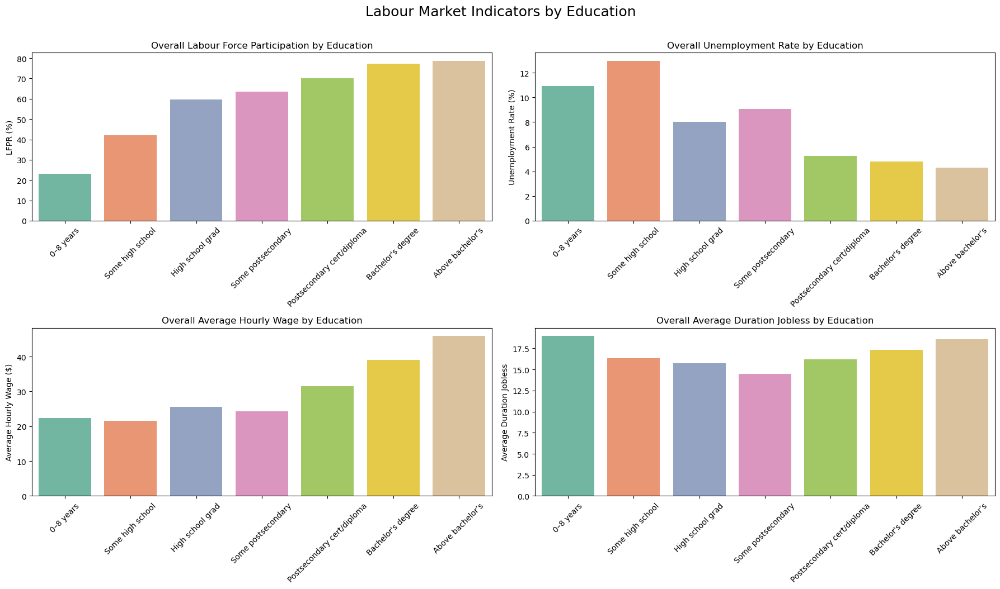

In [76]:
# Calculate labour market indicators by Education
monthly_rates_by_education, overall_rates_by_education = calculate_labour_market_indicators(LFS, 'education')

# Define education level labels
education_labels = {
    0: '0–8 years',
    1: 'Some high school',
    2: 'High school grad',
    3: 'Some postsecondary',
    4: 'Postsecondary cert/diploma',
    5: "Bachelor's degree",
    6: 'Above bachelor’s'
}

# Prepare data with mapped labels
plot_data = overall_rates_by_education.copy()
plot_data['education'] = plot_data['education'].astype('object').replace(education_labels)

# Ensure consistent plotting order
plot_data['education'] = pd.Categorical(
    plot_data['education'],
    categories=[
        '0–8 years',
        'Some high school',
        'High school grad',
        'Some postsecondary',
        'Postsecondary cert/diploma',
        "Bachelor's degree",
        'Above bachelor’s'
    ],
    ordered=True
)

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# Plot 1: LFPR
sns.barplot(data=plot_data, x='education', y='overall_LFPR_rate', hue='education', ax=axes[0,0], palette='Set2', legend=False)
axes[0,0].set_title('Overall Labour Force Participation by Education')
axes[0,0].set_ylabel('LFPR (%)')
axes[0,0].set_xlabel('')
axes[0,0].tick_params(axis='x', rotation=45)

# Plot 2: Unemployment Rate
sns.barplot(data=plot_data, x='education', y='overall_unemployment_rate', hue='education', ax=axes[0,1], palette='Set2', legend=False)
axes[0,1].set_title('Overall Unemployment Rate by Education')
axes[0,1].set_ylabel('Unemployment Rate (%)')
axes[0,1].set_xlabel('')
axes[0,1].tick_params(axis='x', rotation=45)

# Plot 3: Hourly Wage
sns.barplot(data=plot_data, x='education', y='overall_avg_hourly_wage', hue='education', ax=axes[1,0], palette='Set2', legend=False)
axes[1,0].set_title('Overall Average Hourly Wage by Education')
axes[1,0].set_ylabel('Average Hourly Wage ($)')
axes[1,0].set_xlabel('')
axes[1,0].tick_params(axis='x', rotation=45)

# Plot 4: Duration Jobless
sns.barplot(data=plot_data, x='education', y='overall_avg_duration_jobless', hue='education', ax=axes[1,1], palette='Set2', legend=False)
axes[1,1].set_title('Overall Average Duration Jobless by Education')
axes[1,1].set_ylabel('Average Duration Jobless')
axes[1,1].set_xlabel('')
axes[1,1].tick_params(axis='x', rotation=45)

# Adjust layout
plt.tight_layout()
plt.suptitle("Labour Market Indicators by Education", fontsize=18, y=1.05)
plt.show()


**Interpretation**

- Higher education correlates with higher LFPR and wages.
- Unemployment rates and jobless durations are highest for those without a highschool diploma.
- Those with university degrees and above show strongest market outcomes.


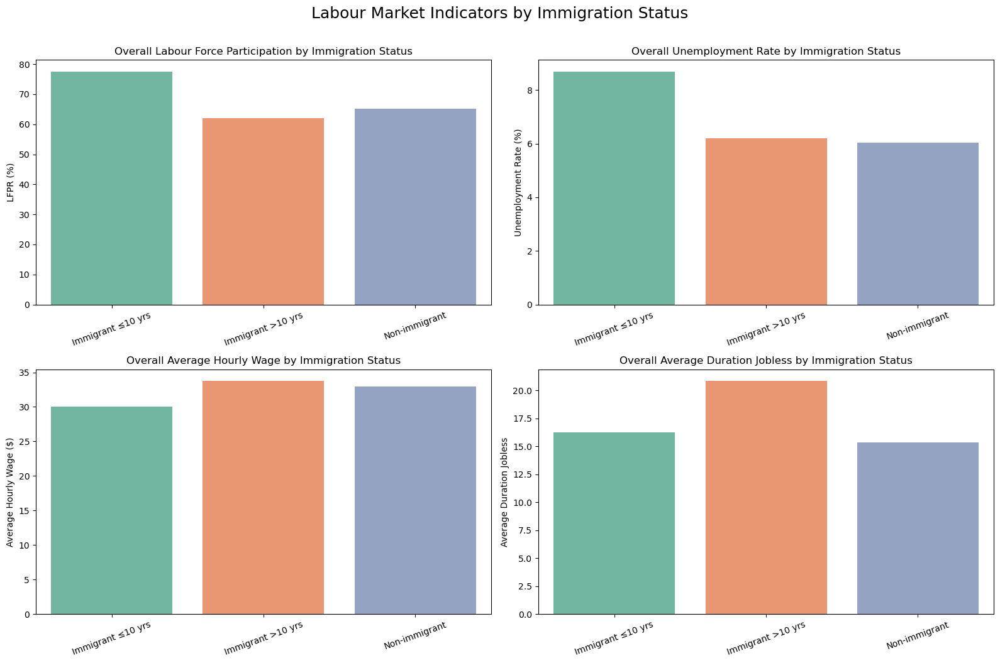

In [77]:
# Calculate labour market indicators by Immigration Status
monthly_rates_by_immigration, overall_rates_by_immigration = calculate_labour_market_indicators(LFS, 'immigration_stat')

# Define immigration status labels
immigration_labels = {
    1: 'Immigrant ≤10 yrs',
    2: 'Immigrant >10 yrs',
    3: 'Non-immigrant'
}

# Prepare data with mapped labels
plot_data = overall_rates_by_immigration.copy()
plot_data['immigration_stat'] = plot_data['immigration_stat'].astype('object').replace(immigration_labels)

# Set category order for consistent plotting
plot_data['immigration_stat'] = pd.Categorical(
    plot_data['immigration_stat'],
    categories=['Immigrant ≤10 yrs', 'Immigrant >10 yrs', 'Non-immigrant'],
    ordered=True
)

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# Plot 1: LFPR
sns.barplot(data=plot_data, x='immigration_stat', y='overall_LFPR_rate', hue='immigration_stat', ax=axes[0,0], palette='Set2', legend=False)
axes[0,0].set_title('Overall Labour Force Participation by Immigration Status')
axes[0,0].set_ylabel('LFPR (%)')
axes[0,0].set_xlabel('')
axes[0,0].tick_params(axis='x', rotation=20)

# Plot 2: Unemployment Rate
sns.barplot(data=plot_data, x='immigration_stat', y='overall_unemployment_rate', hue='immigration_stat', ax=axes[0,1], palette='Set2', legend=False)
axes[0,1].set_title('Overall Unemployment Rate by Immigration Status')
axes[0,1].set_ylabel('Unemployment Rate (%)')
axes[0,1].set_xlabel('')
axes[0,1].tick_params(axis='x', rotation=20)

# Plot 3: Hourly Wage
sns.barplot(data=plot_data, x='immigration_stat', y='overall_avg_hourly_wage', hue='immigration_stat', ax=axes[1,0], palette='Set2', legend=False)
axes[1,0].set_title('Overall Average Hourly Wage by Immigration Status')
axes[1,0].set_ylabel('Average Hourly Wage ($)')
axes[1,0].set_xlabel('')
axes[1,0].tick_params(axis='x', rotation=20)

# Plot 4: Duration Jobless
sns.barplot(data=plot_data, x='immigration_stat', y='overall_avg_duration_jobless', hue='immigration_stat', ax=axes[1,1], palette='Set2', legend=False)
axes[1,1].set_title('Overall Average Duration Jobless by Immigration Status')
axes[1,1].set_ylabel('Average Duration Jobless')
axes[1,1].set_xlabel('')
axes[1,1].tick_params(axis='x', rotation=20)

# Layout adjustments
plt.tight_layout()
plt.suptitle("Labour Market Indicators by Immigration Status", fontsize=18, y=1.05)
plt.show()


**Interpretation**

- Immigrants that have landed 10 or less years ago have the highest participation rate.
- Immigrants that have landed more than 10 years ago have slightly higher wages, but also longer periods of joblessness.
- Unemployment is highest among recent immigrants.

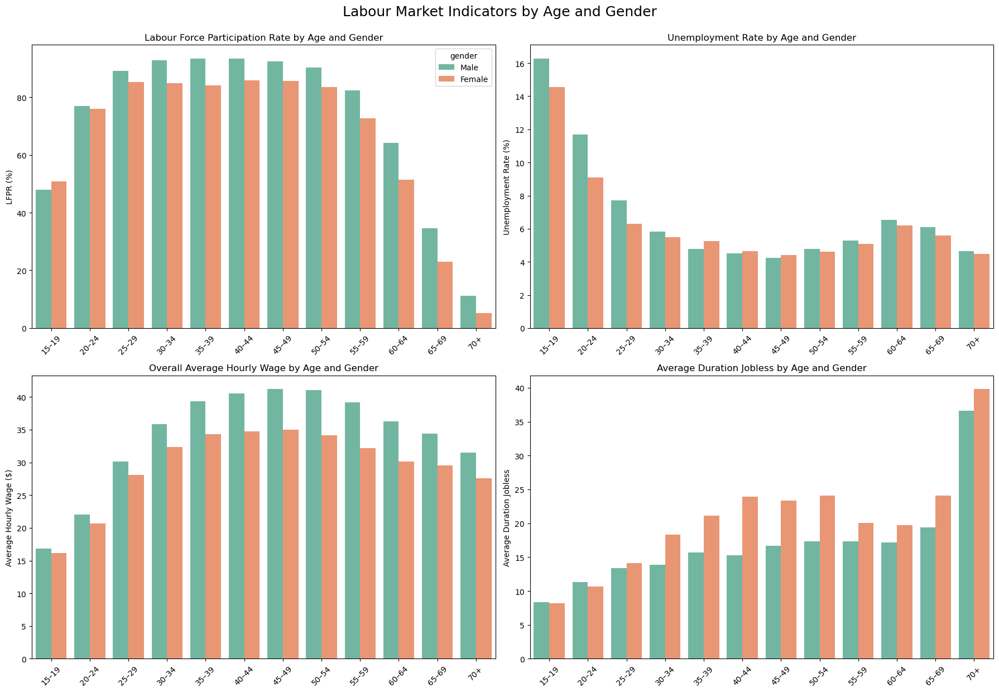

In [78]:
# Calculate labour market indicators based on age and gender
monthly_age_sex_df, overall_age_sex_df = calculate_labour_market_indicators_two_categories(LFS, 'age_5y_group', 'gender')

# Apply label mapping
plot_data = overall_age_sex_df.copy()
plot_data['age_5y_group'] = plot_data['age_5y_group'].astype('object').replace(age_labels)
plot_data['gender'] = plot_data['gender'].astype('object').replace(gender_labels)

# Set categorical order
plot_data['age_5y_group'] = pd.Categorical(
    plot_data['age_5y_group'],
    categories=['15–19', '20–24', '25–29', '30–34', '35–39', '40–44',
                '45–49', '50–54', '55–59', '60–64', '65–69', '70+'],
    ordered=True
)
plot_data['gender'] = pd.Categorical(
    plot_data['gender'],
    categories=['Male', 'Female'],
    ordered=True
)

# Create a figure with 2 rows and 2 columns
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Plot 1: Labour Force Participation Rate by Age and Gender
sns.barplot(data=plot_data, x='age_5y_group', y='overall_LFPR_rate', hue='gender', ax=axes[0, 0], palette='Set2')
axes[0, 0].set_title('Labour Force Participation Rate by Age and Gender')
axes[0, 0].set_ylabel('LFPR (%)')
axes[0, 0].set_xlabel('')
axes[0, 0].tick_params(axis='x', rotation=45)

# Plot 2: Overall Unemployment Rate by Age and Gender
sns.barplot(data=plot_data, x='age_5y_group', y='overall_unemployment_rate', hue='gender', ax=axes[0, 1], palette='Set2')
axes[0, 1].set_title('Unemployment Rate by Age and Gender')
axes[0, 1].set_ylabel('Unemployment Rate (%)')
axes[0, 1].set_xlabel('')
axes[0, 1].tick_params(axis='x', rotation=45)
axes[0, 1].legend_.remove()

# Plot 3: Overall Hourly Wage by Age and Gender
sns.barplot(data=plot_data, x='age_5y_group', y='overall_avg_hourly_wage', hue='gender', ax=axes[1, 0], palette='Set2')
axes[1, 0].set_title('Overall Average Hourly Wage by Age and Gender')
axes[1, 0].set_ylabel('Average Hourly Wage ($)')
axes[1, 0].set_xlabel('')
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].legend_.remove()

# Plot 4: Overall Average Duration Jobless by Age and Gender
sns.barplot(data=plot_data, x='age_5y_group', y='overall_avg_duration_jobless', hue='gender', ax=axes[1, 1], palette='Set2')
axes[1, 1].set_title('Average Duration Jobless by Age and Gender')
axes[1, 1].set_ylabel('Average Duration Jobless')
axes[1, 1].set_xlabel('')
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].legend_.remove()

plt.tight_layout()
plt.suptitle("Labour Market Indicators by Age and Gender", fontsize=18, y=1.03)
plt.show()



**Interpretation**

- Gender gaps in wages and participation exist at nearly all age groups.

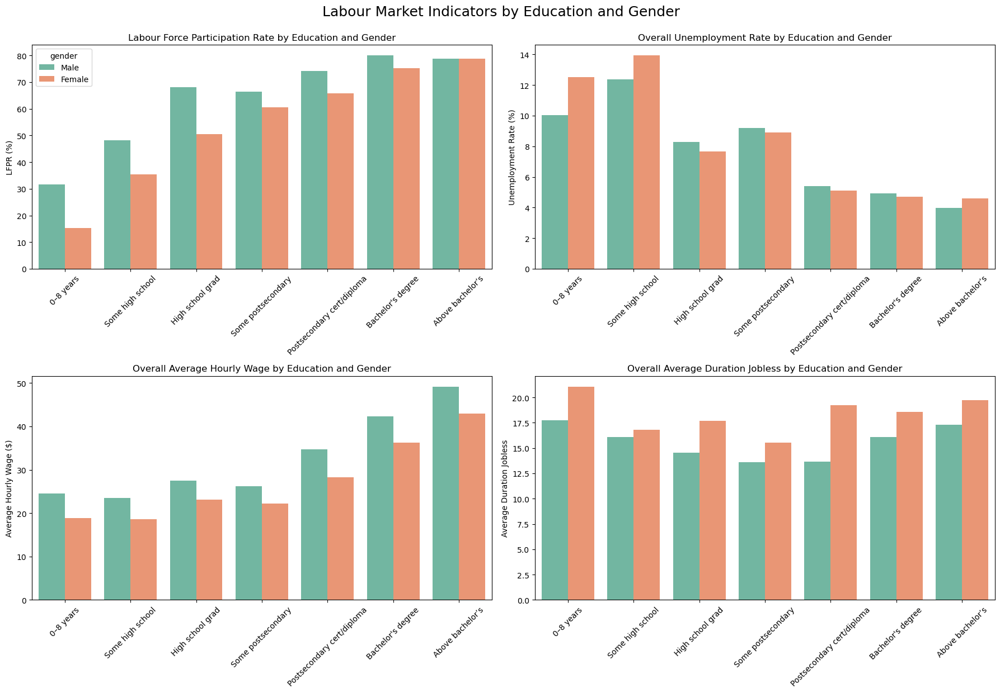

In [79]:
# Calculation LMI based on Education level and gender
monthly_education_sex_df, overall_education_sex_df = calculate_labour_market_indicators_two_categories(LFS, 'education', 'gender')

# Apply label mappings
plot_data = overall_education_sex_df.copy()
plot_data['education'] = plot_data['education'].astype('object').replace(education_labels)
plot_data['gender'] = plot_data['gender'].astype('object').replace(gender_labels)

# Set plotting order
plot_data['education'] = pd.Categorical(
    plot_data['education'],
    categories=[
        '0–8 years',
        'Some high school',
        'High school grad',
        'Some postsecondary',
        'Postsecondary cert/diploma',
        "Bachelor's degree",
        'Above bachelor’s'
    ],
    ordered=True
)
plot_data['gender'] = pd.Categorical(plot_data['gender'], categories=['Male', 'Female'], ordered=True)

# Create a figure with 2 rows and 2 columns
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Plot 1: Labour Force Participation Rate by Education and Gender
sns.barplot(data=plot_data, x='education', y='overall_LFPR_rate', hue='gender', ax=axes[0, 0], palette='Set2')
axes[0, 0].set_title('Labour Force Participation Rate by Education and Gender')
axes[0, 0].set_ylabel('LFPR (%)')
axes[0, 0].set_xlabel('')
axes[0, 0].tick_params(axis='x', rotation=45)

# Plot 2: Overall Unemployment Rate by Education and Gender
sns.barplot(data=plot_data, x='education', y='overall_unemployment_rate', hue='gender', ax=axes[0, 1], palette='Set2')
axes[0, 1].set_title('Overall Unemployment Rate by Education and Gender')
axes[0, 1].set_ylabel('Unemployment Rate (%)')
axes[0, 1].legend_.remove()
axes[0, 1].set_xlabel('')
axes[0, 1].tick_params(axis='x', rotation=45)

# Plot 3: Overall Hourly Wage by Education and Gender
sns.barplot(data=plot_data, x='education', y='overall_avg_hourly_wage', hue='gender', ax=axes[1, 0], palette='Set2')
axes[1, 0].set_title('Overall Average Hourly Wage by Education and Gender')
axes[1, 0].set_ylabel('Average Hourly Wage ($)')
axes[1, 0].legend_.remove()
axes[1, 0].set_xlabel('')
axes[1, 0].tick_params(axis='x', rotation=45)

# Plot 4: Overall Average Duration Jobless by Education and Gender
sns.barplot(data=plot_data, x='education', y='overall_avg_duration_jobless', hue='gender', ax=axes[1, 1], palette='Set2')
axes[1, 1].set_title('Overall Average Duration Jobless by Education and Gender')
axes[1, 1].set_ylabel('Average Duration Jobless')
axes[1, 1].legend_.remove()
axes[1, 1].set_xlabel('')
axes[1, 1].tick_params(axis='x', rotation=45)

# Adjust layout and add title
plt.tight_layout()
plt.suptitle("Labour Market Indicators by Education and Gender", fontsize=18, y=1.03)
plt.show()


**Interpretation** 

- Gender wage gap exists across education levels
- Women face slightly higher unemployment at lower education levels.
- Women face higher durations of joblessness across all education levels

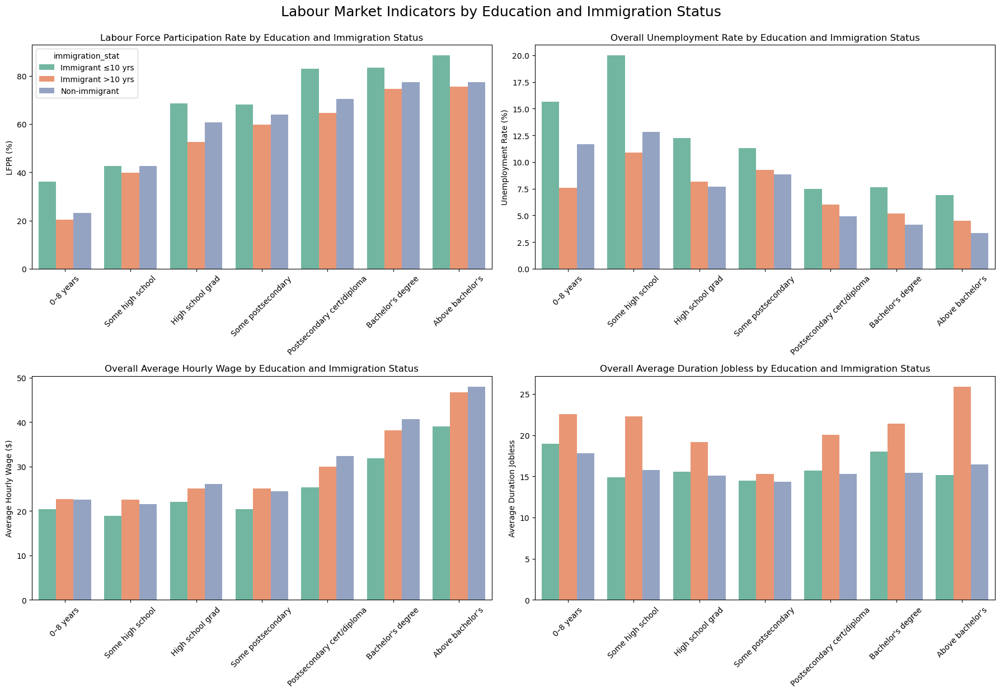

In [80]:
# Calculation LMI based on Education and Immigration status
monthly_education_immigration_df, overall_education_immigration_df = calculate_labour_market_indicators_two_categories(LFS, 'education', 'immigration_stat')

# Apply label mappings
plot_data = overall_education_immigration_df.copy()
plot_data['education'] = plot_data['education'].astype('object').replace(education_labels)
plot_data['immigration_stat'] = plot_data['immigration_stat'].astype('object').replace(immigration_labels)

# Set categorical order
plot_data['education'] = pd.Categorical(
    plot_data['education'],
    categories=[
        '0–8 years',
        'Some high school',
        'High school grad',
        'Some postsecondary',
        'Postsecondary cert/diploma',
        "Bachelor's degree",
        'Above bachelor’s'
    ],
    ordered=True
)
plot_data['immigration_stat'] = pd.Categorical(
    plot_data['immigration_stat'],
    categories=['Immigrant ≤10 yrs', 'Immigrant >10 yrs', 'Non-immigrant'],
    ordered=True
)

# Create a figure with 2 rows and 2 columns
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Plot 1: Labour Force Participation Rate by Education and Immigration status
sns.barplot(data=plot_data, x='education', y='overall_LFPR_rate', hue='immigration_stat', ax=axes[0, 0], palette='Set2')
axes[0, 0].set_title('Labour Force Participation Rate by Education and Immigration Status')
axes[0, 0].set_ylabel('LFPR (%)')
axes[0, 0].set_xlabel('')
axes[0, 0].tick_params(axis='x', rotation=45)

# Plot 2: Overall Unemployment Rate by Education and Immigration status
sns.barplot(data=plot_data, x='education', y='overall_unemployment_rate', hue='immigration_stat', ax=axes[0, 1], palette='Set2')
axes[0, 1].set_title('Overall Unemployment Rate by Education and Immigration Status')
axes[0, 1].set_ylabel('Unemployment Rate (%)')
axes[0, 1].legend_.remove()
axes[0, 1].set_xlabel('')
axes[0, 1].tick_params(axis='x', rotation=45)

# Plot 3: Overall Hourly Wage by Education and Immigration status
sns.barplot(data=plot_data, x='education', y='overall_avg_hourly_wage', hue='immigration_stat', ax=axes[1, 0], palette='Set2')
axes[1, 0].set_title('Overall Average Hourly Wage by Education and Immigration Status')
axes[1, 0].set_ylabel('Average Hourly Wage ($)')
axes[1, 0].legend_.remove()
axes[1, 0].set_xlabel('')
axes[1, 0].tick_params(axis='x', rotation=45)

# Plot 4: Overall Average Duration Jobless by Education and Immigration status
sns.barplot(data=plot_data, x='education', y='overall_avg_duration_jobless', hue='immigration_stat', ax=axes[1, 1], palette='Set2')
axes[1, 1].set_title('Overall Average Duration Jobless by Education and Immigration Status')
axes[1, 1].set_ylabel('Average Duration Jobless')
axes[1, 1].legend_.remove()
axes[1, 1].set_xlabel('')
axes[1, 1].tick_params(axis='x', rotation=45)

# Final layout adjustments
plt.tight_layout()
plt.suptitle("Labour Market Indicators by Education and Immigration Status", fontsize=18, y=1.03)
plt.show()


**Interpretation** 
- Average duration of joblessness is highest among immigrants (landed 10 years ago) across all education levels 
- Theres a wage gap across all education levels between recent immigrants and immigrants (landed 10 years ago)/non-immigrants

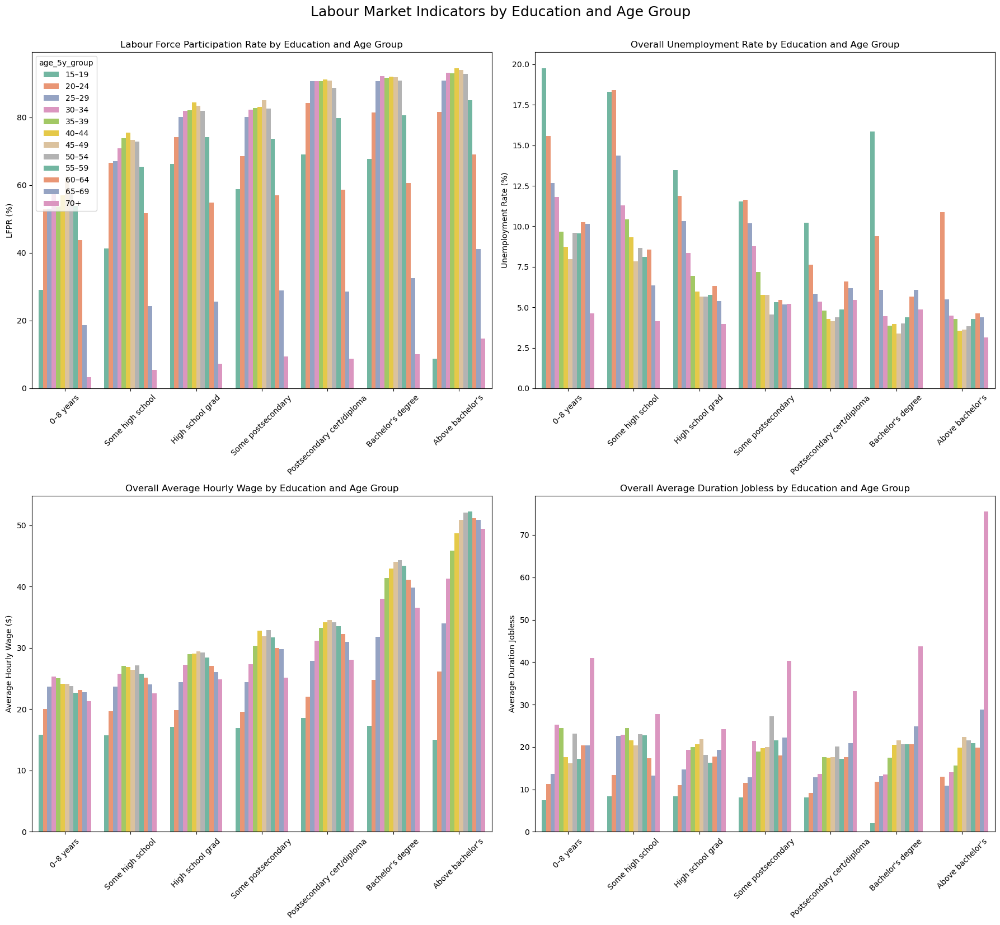

In [81]:
# Calculation LMI on Education and Age Group
monthly_education_age_df, overall_education_age_df = calculate_labour_market_indicators_two_categories(LFS, 'education', 'age_5y_group')

# Apply label mappings
plot_data = overall_education_age_df.copy()
plot_data['education'] = plot_data['education'].astype('object').replace(education_labels)
plot_data['age_5y_group'] = plot_data['age_5y_group'].astype('object').replace(age_labels)

# Set plotting order
plot_data['education'] = pd.Categorical(
    plot_data['education'],
    categories=[
        '0–8 years',
        'Some high school',
        'High school grad',
        'Some postsecondary',
        'Postsecondary cert/diploma',
        "Bachelor's degree",
        'Above bachelor’s'
    ],
    ordered=True
)
plot_data['age_5y_group'] = pd.Categorical(
    plot_data['age_5y_group'],
    categories=['15–19', '20–24', '25–29', '30–34', '35–39', '40–44',
                '45–49', '50–54', '55–59', '60–64', '65–69', '70+'],
    ordered=True
)

# Create a figure with 2 rows and 2 columns
fig, axes = plt.subplots(2, 2, figsize=(18, 16))

# Plot 1: Labour Force Participation Rate by Education and Age Group
sns.barplot(data=plot_data, x='education', y='overall_LFPR_rate', hue='age_5y_group', ax=axes[0, 0], palette='Set2')
axes[0, 0].set_title('Labour Force Participation Rate by Education and Age Group')
axes[0, 0].set_ylabel('LFPR (%)')
axes[0, 0].set_xlabel('')
axes[0, 0].tick_params(axis='x', rotation=45)

# Plot 2: Overall Unemployment Rate by Education and Age Group
sns.barplot(data=plot_data, x='education', y='overall_unemployment_rate', hue='age_5y_group', ax=axes[0, 1], palette='Set2')
axes[0, 1].set_title('Overall Unemployment Rate by Education and Age Group')
axes[0, 1].set_ylabel('Unemployment Rate (%)')
axes[0, 1].legend_.remove()
axes[0, 1].set_xlabel('')
axes[0, 1].tick_params(axis='x', rotation=45)

# Plot 3: Overall Hourly Wage by Education and Age Group
sns.barplot(data=plot_data, x='education', y='overall_avg_hourly_wage', hue='age_5y_group', ax=axes[1, 0], palette='Set2')
axes[1, 0].set_title('Overall Average Hourly Wage by Education and Age Group')
axes[1, 0].set_ylabel('Average Hourly Wage ($)')
axes[1, 0].legend_.remove()
axes[1, 0].set_xlabel('')
axes[1, 0].tick_params(axis='x', rotation=45)

# Plot 4: Overall Average Duration Jobless by Education and Age Group
sns.barplot(data=plot_data, x='education', y='overall_avg_duration_jobless', hue='age_5y_group', ax=axes[1, 1], palette='Set2')
axes[1, 1].set_title('Overall Average Duration Jobless by Education and Age Group')
axes[1, 1].set_ylabel('Average Duration Jobless')
axes[1, 1].legend_.remove()
axes[1, 1].set_xlabel('')
axes[1, 1].tick_params(axis='x', rotation=45)

# Final layout and title
plt.tight_layout()
plt.suptitle("Labour Market Indicators by Education and Age Group", fontsize=18, y=1.03)
plt.show()


**Interpretation** 
- Participation is highest among those aged 30–54 with post-secondary education (levels 4–6)
- Unemployment declines with higher education, especially in the 20–49 age range.
- Jobless duration increases with age—especially striking in the 65+ group.

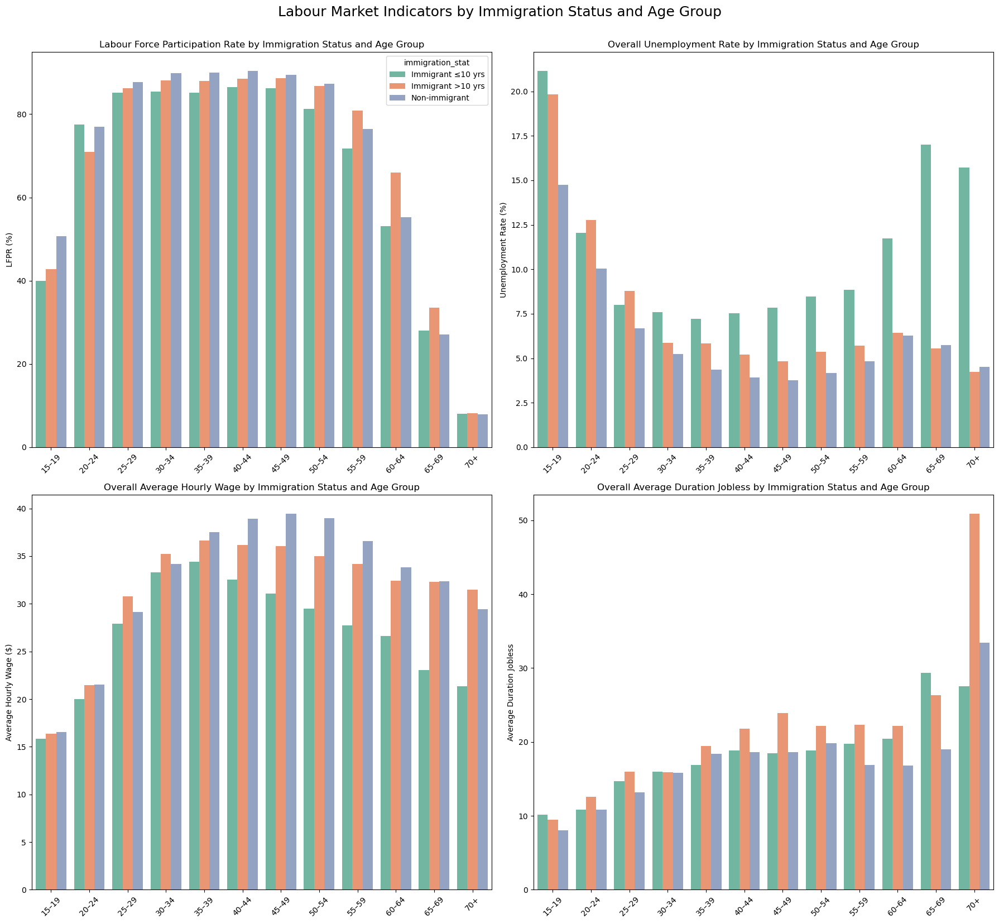

In [82]:
# Calculation LMI based on Immigration Status and Age Group
monthly_age_immigration_df, overall_age_immigration_df = calculate_labour_market_indicators_two_categories(LFS, 'age_5y_group', 'immigration_stat')

# Apply label mappings
plot_data = overall_age_immigration_df.copy()
plot_data['age_5y_group'] = plot_data['age_5y_group'].astype('object').replace(age_labels)
plot_data['immigration_stat'] = plot_data['immigration_stat'].astype('object').replace(immigration_labels)

# Set categorical order
plot_data['age_5y_group'] = pd.Categorical(
    plot_data['age_5y_group'],
    categories=['15–19', '20–24', '25–29', '30–34', '35–39', '40–44',
                '45–49', '50–54', '55–59', '60–64', '65–69', '70+'],
    ordered=True
)
plot_data['immigration_stat'] = pd.Categorical(
    plot_data['immigration_stat'],
    categories=['Immigrant ≤10 yrs', 'Immigrant >10 yrs', 'Non-immigrant'],
    ordered=True
)

# Create a figure with 2 rows and 2 columns
fig, axes = plt.subplots(2, 2, figsize=(18, 16))

# Plot 1: Labour Force Participation Rate by Immigration Status and Age Group
sns.barplot(data=plot_data, x='age_5y_group', y='overall_LFPR_rate', hue='immigration_stat', ax=axes[0, 0], palette='Set2')
axes[0, 0].set_title('Labour Force Participation Rate by Immigration Status and Age Group')
axes[0, 0].set_ylabel('LFPR (%)')
axes[0, 0].set_xlabel('')
axes[0, 0].tick_params(axis='x', rotation=45)

# Plot 2: Overall Unemployment Rate by Immigration Status and Age Group
sns.barplot(data=plot_data, x='age_5y_group', y='overall_unemployment_rate', hue='immigration_stat', ax=axes[0, 1], palette='Set2')
axes[0, 1].set_title('Overall Unemployment Rate by Immigration Status and Age Group')
axes[0, 1].set_ylabel('Unemployment Rate (%)')
axes[0, 1].legend_.remove()
axes[0, 1].set_xlabel('')
axes[0, 1].tick_params(axis='x', rotation=45)

# Plot 3: Overall Hourly Wage by Immigration Status and Age Group
sns.barplot(data=plot_data, x='age_5y_group', y='overall_avg_hourly_wage', hue='immigration_stat', ax=axes[1, 0], palette='Set2')
axes[1, 0].set_title('Overall Average Hourly Wage by Immigration Status and Age Group')
axes[1, 0].set_ylabel('Average Hourly Wage ($)')
axes[1, 0].legend_.remove()
axes[1, 0].set_xlabel('')
axes[1, 0].tick_params(axis='x', rotation=45)

# Plot 4: Overall Average Duration Jobless by Immigration Status and Age Group
sns.barplot(data=plot_data, x='age_5y_group', y='overall_avg_duration_jobless', hue='immigration_stat', ax=axes[1, 1], palette='Set2')
axes[1, 1].set_title('Overall Average Duration Jobless by Immigration Status and Age Group')
axes[1, 1].set_ylabel('Average Duration Jobless')
axes[1, 1].legend_.remove()
axes[1, 1].set_xlabel('')
axes[1, 1].tick_params(axis='x', rotation=45)

# Layout and overall title
plt.tight_layout()
plt.suptitle("Labour Market Indicators by Immigration Status and Age Group", fontsize=18, y=1.03)
plt.show()


**Interpretation** 
- Recent immigrants in older groups face elevated unemployment.
- Wage gap between recent immigrants and immigrants (landed 10 years ago)/non-immigrants, more notably after age of 40 years.

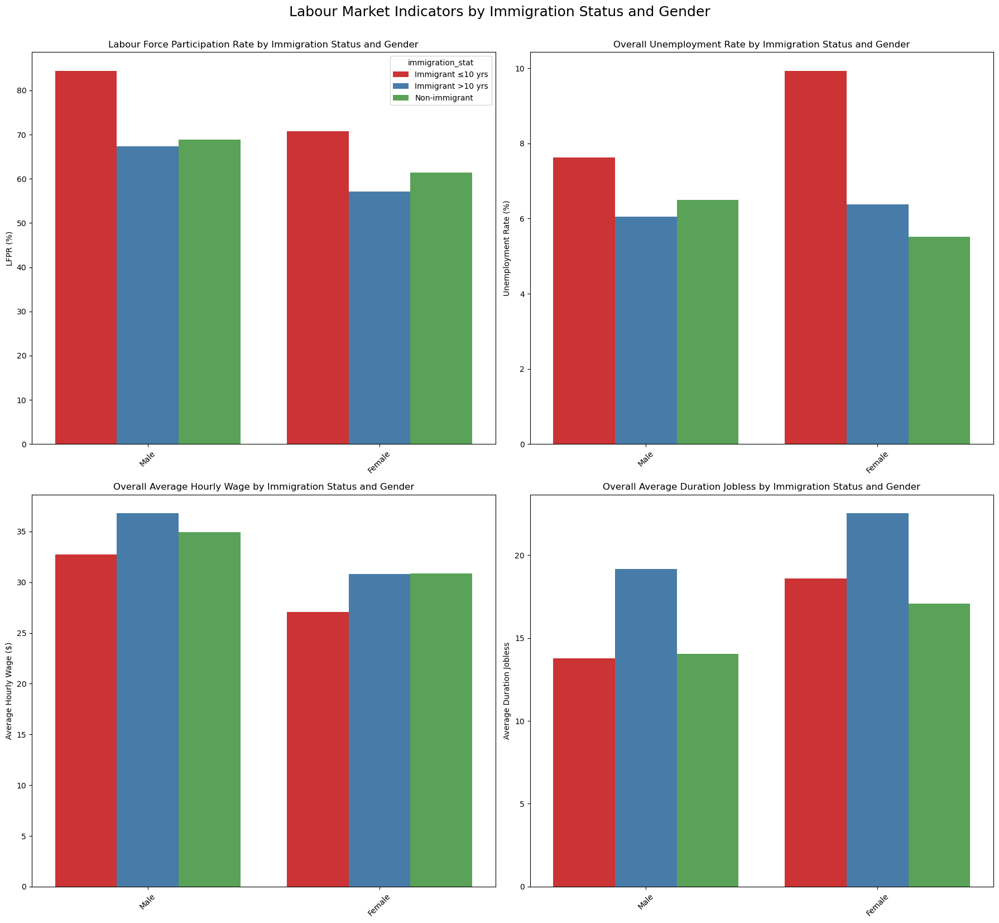

In [83]:
# Calculation LMI based on Immigration Status and Gender
monthly_gender_immigration_df, overall_gender_immigration_df = calculate_labour_market_indicators_two_categories(LFS, 'gender', 'immigration_stat')

# Apply label mappings
plot_data = overall_gender_immigration_df.copy()
plot_data['gender'] = plot_data['gender'].astype('object').replace(gender_labels)
plot_data['immigration_stat'] = plot_data['immigration_stat'].astype('object').replace(immigration_labels)

# Set categorical order
plot_data['gender'] = pd.Categorical(plot_data['gender'], categories=['Male', 'Female'], ordered=True)
plot_data['immigration_stat'] = pd.Categorical(
    plot_data['immigration_stat'],
    categories=['Immigrant ≤10 yrs', 'Immigrant >10 yrs', 'Non-immigrant'],
    ordered=True
)

# Create a figure with 2 rows and 2 columns
fig, axes = plt.subplots(2, 2, figsize=(18, 16))

# Plot 1: Labour Force Participation Rate by Immigration Status and Gender
sns.barplot(data=plot_data, x='gender', y='overall_LFPR_rate', hue='immigration_stat', ax=axes[0, 0], palette='Set1')
axes[0, 0].set_title('Labour Force Participation Rate by Immigration Status and Gender')
axes[0, 0].set_ylabel('LFPR (%)')
axes[0, 0].set_xlabel('')
axes[0, 0].tick_params(axis='x', rotation=45)

# Plot 2: Overall Unemployment Rate by Immigration Status and Gender
sns.barplot(data=plot_data, x='gender', y='overall_unemployment_rate', hue='immigration_stat', ax=axes[0, 1], palette='Set1')
axes[0, 1].set_title('Overall Unemployment Rate by Immigration Status and Gender')
axes[0, 1].set_ylabel('Unemployment Rate (%)')
axes[0, 1].legend_.remove()
axes[0, 1].set_xlabel('')
axes[0, 1].tick_params(axis='x', rotation=45)

# Plot 3: Overall Hourly Wage by Immigration Status and Gender
sns.barplot(data=plot_data, x='gender', y='overall_avg_hourly_wage', hue='immigration_stat', ax=axes[1, 0], palette='Set1')
axes[1, 0].set_title('Overall Average Hourly Wage by Immigration Status and Gender')
axes[1, 0].set_ylabel('Average Hourly Wage ($)')
axes[1, 0].legend_.remove()
axes[1, 0].set_xlabel('')
axes[1, 0].tick_params(axis='x', rotation=45)

# Plot 4: Overall Average Duration Jobless by Immigration Status and Gender
sns.barplot(data=plot_data, x='gender', y='overall_avg_duration_jobless', hue='immigration_stat', ax=axes[1, 1], palette='Set1')
axes[1, 1].set_title('Overall Average Duration Jobless by Immigration Status and Gender')
axes[1, 1].set_ylabel('Average Duration Jobless')
axes[1, 1].legend_.remove()
axes[1, 1].set_xlabel('')
axes[1, 1].tick_params(axis='x', rotation=45)

# Final layout and title
plt.tight_layout()
plt.suptitle("Labour Market Indicators by Immigration Status and Gender", fontsize=18, y=1.03)
plt.show()


**Interpretation**
- Recent immigrant women earn the lowest wages and face the highest unemplpoyment rate
- Average duration of joblessness is highest amongs both men and women immigrants who landed more than 10 years ago. 

## Modeling Dynamic Relationships Between Labour Market Indicators

### Preprocessing

In [84]:
overall_indicators.set_index('REF_DATE', inplace=True)
overall_indicators.index.freq = 'MS'
overall_indicators.sort_index(inplace=True)

overall_indicators.head()

,Employment_Rate(%),Unemployment_Rate(%),Labour_Force_Participation_Rate(%),Average_Hourly_Wage,Duration_Jobless(Months),Job Vacancies (#),Payroll Employees (#),Job Vacancy Rate (%),Month,Year,All-items,Inflation_Rate_MoM,CPI_Lagged_1M,Inflation_Rate_1M_Lagged,CPI_Lagged_12M,Inflation_Rate_YoY,Inflation_Rate_YoY_Lag1,Inflation_Rate_YoY_Lag3,Market_Tightness,Lagged_1M_Job_Vacancy_Rate,Lagged_1M_Unemployment_Rate
REF_DATE,,,,,,,,,,,,,,,,,,,,,
2021-01-01,57.793,9.841,64.101,30.752,11.519,561280.000,15294425.000,3.500,Jan,2021,139.100,0.433,138.500,0.433,137.500,1.164,0.874,0.585,0.285,3.600,8.188
2021-02-01,58.838,8.792,64.510,30.639,13.636,616555.000,15167450.000,3.900,Feb,2021,139.400,0.216,139.100,0.216,137.700,1.235,1.164,0.877,0.348,3.500,9.841
2021-03-01,59.615,8.205,64.944,30.484,13.550,643655.000,15233105.000,4.100,Mar,2021,139.500,0.072,139.400,0.072,136.300,2.348,1.235,0.874,0.387,3.900,8.792
2021-04-01,59.234,8.455,64.705,30.742,13.077,651890.000,15431950.000,4.100,Apr,2021,139.900,0.287,139.500,0.287,135.600,3.171,2.348,1.164,0.381,4.100,8.205
2021-05-01,60.141,8.392,65.650,30.549,14.394,673585.000,15556570.000,4.200,May,2021,140.300,0.286,139.900,0.286,135.400,3.619,3.171,1.235,0.391,4.100,8.455


In [85]:
# Using a subset of the overall_indicators so not to introduce multicollinearity 
initial_vars = ['Employment_Rate(%)', 'Unemployment_Rate(%)', 'Average_Hourly_Wage', 'Job Vacancy Rate (%)', 
 'Inflation_Rate_YoY', 'Duration_Jobless(Months)', 'Labour_Force_Participation_Rate(%)', 'Market_Tightness']

# Checking for any existing multicollinearity
df_initial = overall_indicators[initial_vars].dropna()


# Calculate VIF
vif_data = pd.DataFrame()
vif_data["Variable"] = df_initial.columns
vif_data["VIF"] = [variance_inflation_factor(df_initial.values, i) for i in range(df_initial.shape[1])]

vif_data

,Variable,VIF
0,Employment_Rate(%),6074410.420
1,Unemployment_Rate(%),19972.790
2,Average_Hourly_Wage,4199.441
3,Job Vacancy Rate (%),569.141
4,Inflation_Rate_YoY,59.008
5,Duration_Jobless(Months),199.346
6,Labour_Force_Participation_Rate(%),6482490.120
7,Market_Tightness,702.798


#### VIF values are extremely high indicating strong multicollinearity remaining among variables

In [86]:
# Removing LFPR, Employment Rate, Market Tightness, and Duration Jobless

# Create log-transformed variables
overall_indicators['Log_Wage'] = np.log(overall_indicators['Average_Hourly_Wage'])
overall_indicators['Log_Inflation'] = np.log(overall_indicators['Inflation_Rate_YoY'])
overall_indicators['Log_Unemp'] = np.log(overall_indicators['Unemployment_Rate(%)'])

modified_set = ['Log_Wage', 'Job Vacancy Rate (%)','Log_Inflation', 'Log_Unemp']

# Drop rows with missing values just in case
df_modified = overall_indicators[modified_set].dropna()

# Calculate VIF
vif_data = pd.DataFrame()
vif_data["Variable"] = df_modified.columns
vif_data["VIF"] = [variance_inflation_factor(df_modified.values, i) for i in range(df_modified.shape[1])]

vif_data

,Variable,VIF
0,Log_Wage,185.725
1,Job Vacancy Rate (%),107.099
2,Log_Inflation,55.077
3,Log_Unemp,190.228


#### VIF values remain high indicating some variables are still strongly linearly dependent. 

In [87]:
# Create differenced variables
overall_indicators['DLog_Wage'] = overall_indicators['Log_Wage'].diff()
overall_indicators['DLog_Inflation'] = overall_indicators['Log_Inflation'].diff()
overall_indicators['DLog_Unemp'] = overall_indicators['Log_Unemp'].diff()
overall_indicators['DVacancy'] = overall_indicators['Job Vacancy Rate (%)'].diff()

differenced_indicators = ['DLog_Wage', 'DLog_Inflation', 'DVacancy', 'DLog_Unemp']

# Drop rows with missing values just in case
var_data = overall_indicators[differenced_indicators].dropna()

# Calculate VIF
vif_data = pd.DataFrame()
vif_data["Variable"] = var_data.columns
vif_data["VIF"] = [variance_inflation_factor(var_data.values, i) for i in range(var_data.shape[1])]

vif_data


,Variable,VIF
0,DLog_Wage,1.072
1,DLog_Inflation,1.028
2,DVacancy,1.223
3,DLog_Unemp,1.143


In [88]:
# Check for stationarity using ADF tests
for var in differenced_indicators:
    result = adfuller(overall_indicators[var].dropna())
    print(f"{var}: p-value = {result[1]}")


DLog_Wage: p-value = 0.00018229572098303718
DLog_Inflation: p-value = 7.644352489960376e-05
DVacancy: p-value = 1.0366998023716271e-07
DLog_Unemp: p-value = 0.024286995527473185


### Vector Auto Regression Model

In [89]:
var_data = overall_indicators[differenced_indicators].dropna()

# Selecting the optimal lag length for VAR model
model = VAR(var_data)
lag_selection = model.select_order(maxlags=6) 
print(lag_selection.summary())

 VAR Order Selection (* highlights the minimums) 
      AIC         BIC         FPE         HQIC   
-------------------------------------------------
0     -22.74*     -22.57*  1.334e-10*     -22.68*
1      -22.40      -21.56   1.888e-10      -22.09
2      -22.08      -20.57   2.664e-10      -21.53
3      -21.81      -19.64   3.696e-10      -21.02
4      -22.00      -19.16   3.435e-10      -20.97
5      -21.88      -18.37   4.828e-10      -20.60
6      -22.68      -18.50   3.102e-10      -21.16
-------------------------------------------------


In [90]:
# Fitting the VAR model with the selected lag length
model = VAR(var_data)
var_results = model.fit(maxlags=2)
print(var_results.summary())


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Wed, 02, Apr, 2025
Time:                     17:33:08
--------------------------------------------------------------------
No. of Equations:         4.00000    BIC:                   -20.5685
Nobs:                     45.0000    HQIC:                  -21.4750
Log likelihood:           275.901    FPE:                2.81206e-10
AIC:                     -22.0138    Det(Omega_mle):     1.35613e-10
--------------------------------------------------------------------
Results for equation DLog_Wage
                       coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------------
const                     0.003979         0.001153            3.450           0.001
L1.DLog_Wage              0.034138         0.156344            0.218           0.827
L1.DLog_Inflation         0.004480      

In [91]:
# Checking residuals for Autocorrelation using Ljung-Box test
for col in var_results.resid.columns:
    lb_test = acorr_ljungbox(var_results.resid[col], lags=[1], return_df=True)
    print(f"Ljung-Box for {col}:\n{lb_test}\n")

Ljung-Box for DLog_Wage:
   lb_stat  lb_pvalue
1    0.015      0.901

Ljung-Box for DLog_Inflation:
   lb_stat  lb_pvalue
1    0.375      0.540

Ljung-Box for DVacancy:
   lb_stat  lb_pvalue
1    0.625      0.429

Ljung-Box for DLog_Unemp:
   lb_stat  lb_pvalue
1    0.714      0.398



In [92]:
# Checking residuals for normality using Jarque-Bera test
for col in var_results.resid.columns:
    jb_stat, jb_pvalue, _, _ = jarque_bera(var_results.resid[col])
    print(f"Jarque-Bera for {col}: JB={jb_stat:.2f}, p-value={jb_pvalue:.4f}")

Jarque-Bera for DLog_Wage: JB=1.30, p-value=0.5214
Jarque-Bera for DLog_Inflation: JB=2.08, p-value=0.3535
Jarque-Bera for DVacancy: JB=0.74, p-value=0.6911
Jarque-Bera for DLog_Unemp: JB=1.56, p-value=0.4573


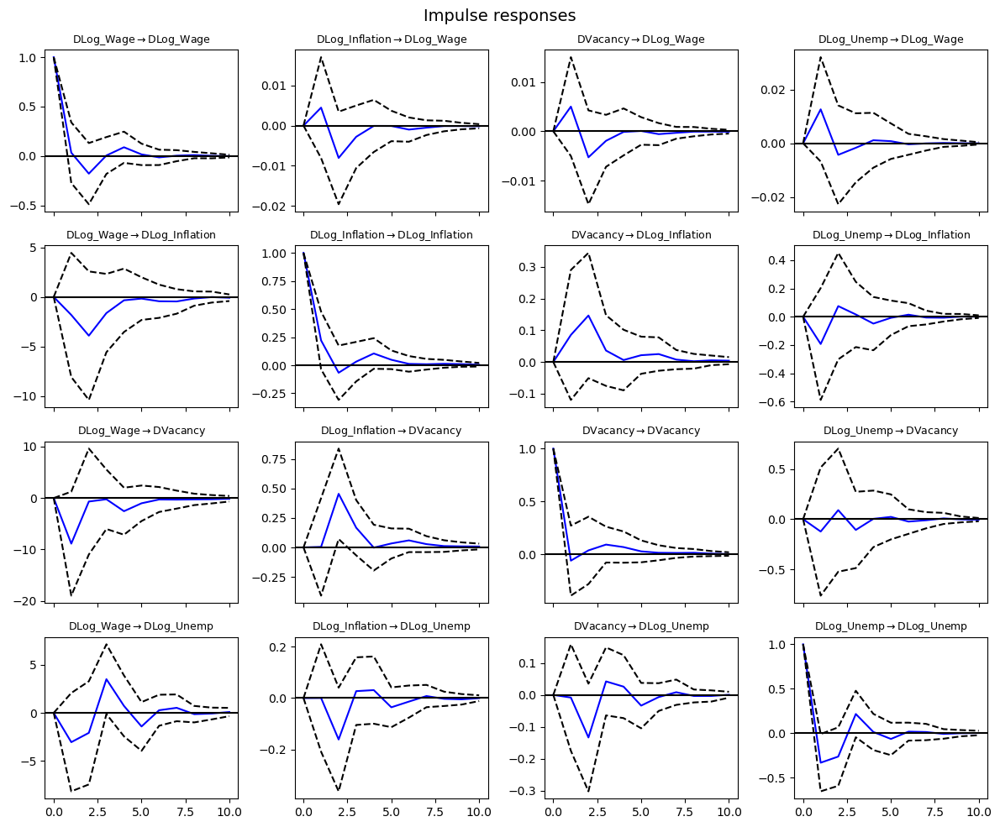

In [93]:
# Plotting Impulse Response Functions (IRF) of the VAR model
irf = var_results.irf(10)  
fig = irf.plot(
    orth=False,
    figsize=(12, 10),
    subplot_params={"fontsize": 9}
)
plt.tight_layout()
plt.show()


### Vector Error Correction Model

In [94]:
# VECM variables (non-differenced but stationary at I(1))
vecm_vars = ['Log_Wage', 'Log_Inflation', 'Log_Unemp', 'Job Vacancy Rate (%)']

# Drop NA values
vecm_data = overall_indicators[vecm_vars].dropna()

# Johansen cointegration test
johansen_test = coint_johansen(vecm_data, det_order=0, k_ar_diff=3)
johansen_test_summary = pd.DataFrame({
    'Eigenvalue': johansen_test.eig,
    'Trace Statistic': johansen_test.lr1,
    'Critical Value (5%)': johansen_test.cvt[:, 1],
    'Max Eigenvalue Statistic': johansen_test.lr2,
    'Critical Value (5%)': johansen_test.cvm[:, 1]
}, index=[f'Rank {i}' for i in range(len(johansen_test.eig))])
johansen_test_summary

,Eigenvalue,Trace Statistic,Critical Value (5%),Max Eigenvalue Statistic
Rank 0,0.407,47.144,27.586,23.019
Rank 1,0.231,24.125,21.131,11.579
Rank 2,0.198,12.546,14.264,9.727
Rank 3,0.062,2.819,3.841,2.819


There are 2 cointegrating relationships

In [95]:
# Fit VECM with 2 cointegrating relationships
vecm_model = VECM(vecm_data, k_ar_diff=3, coint_rank=2, deterministic='co')  # 'co' = constant in cointegration relation
vecm_results = vecm_model.fit()
print(vecm_results.summary())


  Det. terms outside the coint. relation & lagged endog. parameters for equation Log_Wage  
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -0.0478      0.101     -0.476      0.634      -0.245       0.149
L1.Log_Wage                 0.0326      0.150      0.218      0.828      -0.261       0.326
L1.Log_Inflation           -0.0024      0.008     -0.289      0.773      -0.018       0.014
L1.Log_Unemp                0.0111      0.013      0.826      0.409      -0.015       0.037
L1.Job Vacancy Rate (%)     0.0045      0.006      0.733      0.463      -0.007       0.016
L2.Log_Wage                -0.0789      0.155     -0.509      0.611      -0.383       0.225
L2.Log_Inflation           -0.0057      0.007     -0.802      0.422      -0.020       0.008
L2.Log_Unemp               -0.0012      0.012     -0.103      0.918      -0.024 

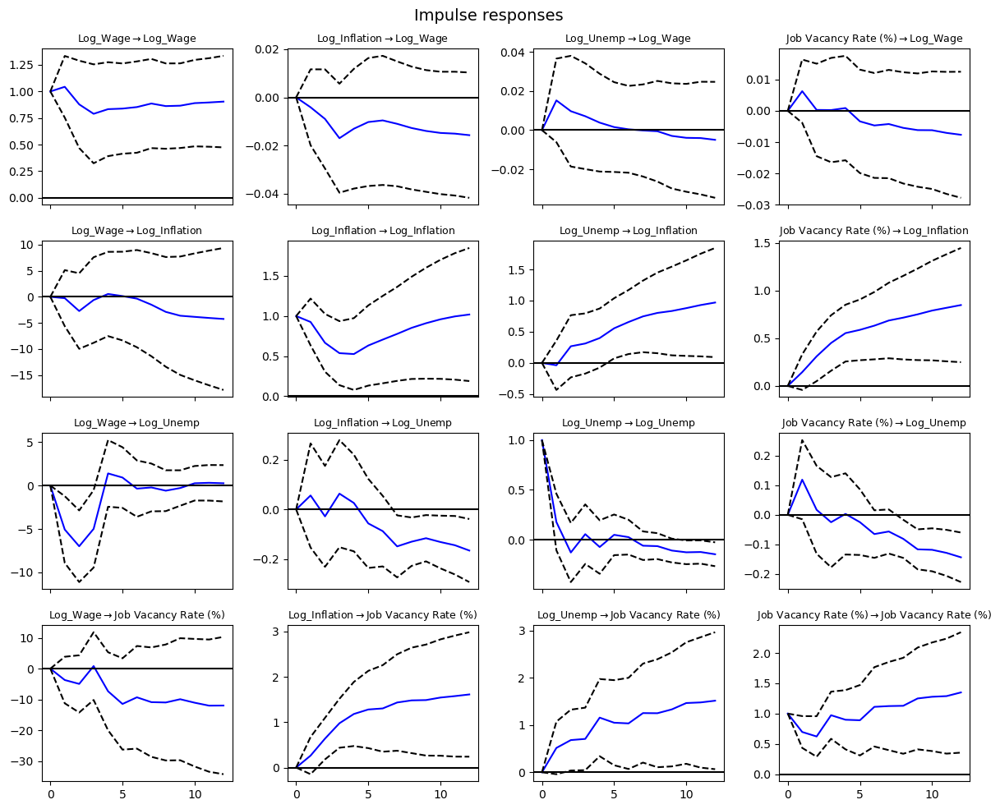

In [96]:
# Plotting Impulse Response Functions (IRF) of the VECM model
irf = vecm_results.irf(12)
fig = irf.plot(
    orth=False,
    figsize=(12, 10),
    subplot_params={"fontsize": 9}
)
plt.tight_layout()
plt.show()


In [97]:
# Accessing residuals from the VECM results
resid = vecm_results.resid 

# Test each residual series for autocorrelation and print results as a DataFrame
for i, col_name in enumerate(vecm_results.model.endog_names):
    lb_results = acorr_ljungbox(resid[:, i], lags=[12], return_df=True)
    print(f"\nResidual autocorrelation test for {col_name}:")
    print(lb_results)


Residual autocorrelation test for Log_Wage:
    lb_stat  lb_pvalue
12   23.947      0.021

Residual autocorrelation test for Log_Inflation:
    lb_stat  lb_pvalue
12   21.637      0.042

Residual autocorrelation test for Log_Unemp:
    lb_stat  lb_pvalue
12   16.472      0.171

Residual autocorrelation test for Job Vacancy Rate (%):
    lb_stat  lb_pvalue
12   10.751      0.550


In [98]:
# Accessing residuals from the VECM results
resid = vecm_results.resid  
endog_names = vecm_results.model.endog_names

# Test each residual series for normality using Jarque-Bera test
print("Jarque-Bera Test for Residual Normality:")
for i, name in enumerate(endog_names):
    jb_stat, jb_pvalue, skew, kurtosis = jarque_bera(resid[:, i])
    print(f"{name}: JB stat = {jb_stat:.4f}, p-value = {jb_pvalue:.4f}, skew = {skew:.4f}, kurtosis = {kurtosis:.4f}")


Jarque-Bera Test for Residual Normality:
Log_Wage: JB stat = 1.3940, p-value = 0.4981, skew = 0.2078, kurtosis = 2.2335
Log_Inflation: JB stat = 2.4344, p-value = 0.2961, skew = -0.4761, kurtosis = 3.6489
Log_Unemp: JB stat = 0.4104, p-value = 0.8145, skew = -0.1488, kurtosis = 3.3677
Job Vacancy Rate (%): JB stat = 2.0312, p-value = 0.3622, skew = 0.0334, kurtosis = 1.9495


**Interpretation** 
- A high p-value (p > 0.05) suggests the residuals follow a normal distribution, which supports reliable inference.

### ARIMA Model

In [99]:
# List of variables to fit ARIMA on
arima_vars = ['Log_Wage', 'Log_Inflation', 'Log_Unemp', 'Job Vacancy Rate (%)']

# Dictionary to store ARIMA models with optimal parameters for each variable
arima_models = {}

# Loop over each variable
for var in arima_vars:
    print(f"\n🔍 Fitting ARIMA model for: {var}")
    
    
    ts_data = overall_indicators[var].dropna()
    
    # Auto ARIMA model selection with stepwise search for optimal parameters
    model = auto_arima(ts_data,
                       start_p=0, max_p=4,
                       start_q=0, max_q=4,
                       d=None,               
                       seasonal=False,       
                       stepwise=True,        
                       trace=True,           
                       error_action='ignore',
                       suppress_warnings=True,
                       max_order=10,         
                       information_criterion='aic')  
    
    arima_models[var] = model
    
    print(model.summary())



🔍 Fitting ARIMA model for: Log_Wage
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-347.727, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-345.786, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-345.809, Time=0.01 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-336.615, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-346.595, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0] intercept
Total fit time: 0.107 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   48
Model:               SARIMAX(0, 1, 0)   Log Likelihood                 175.864
Date:                Wed, 02 Apr 2025   AIC                           -347.727
Time:                        17:33:10   BIC                           -344.027
Sample:                    01-01-2021   HQIC                          -346.335
                         - 12-01-2024  

### Forecasting & Model Comparison

In [100]:
# Actual data for 2025
actual_2025 = monthly_2025[['REF_DATE', 'Unemployment_Rate(%)', 'Average_Hourly_Wage', 'Inflation_Rate_YoY']]
actual_2025.set_index('REF_DATE', inplace=True)
actual_2025.index.freq = 'MS'
actual_2025.sort_index(inplace=True)

# Define functions for automation
def inverse_log(df, cols):
    """Exponentiate log-transformed columns"""
    return df.assign(**{col: np.exp(df[col]) for col in cols})

def calc_metrics(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    return round(mae, 4), round(rmse, 4), round(mape, 2)

def plot_forecasts(historical, forecast, title):
    plt.figure(figsize=(10, 6))
    for col in forecast.columns:
        if col in historical.columns:
            plt.plot(historical[col][-12:], label=f'Historical - {col}')
        plt.plot(forecast[col], '--o', label=f'Forecast - {col}')
    plt.legend()
    plt.title(title)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


In [101]:
# ARIMA Forecasting and Evaluation
arima_vars = {
    'Log_Wage': 'Average_Hourly_Wage',
    'Log_Inflation': 'Inflation_Rate_YoY',
    'Log_Unemp': 'Unemployment_Rate(%)'
}

arima_results = {}
for var_model, var_actual in arima_vars.items():
    model = arima_models[var_model]
    forecast = model.predict(n_periods=2)
    if "Log" in var_model:
        forecast = np.exp(forecast)

    y_true = actual_2025[var_actual].iloc[:2].values
    mae, rmse, mape = calc_metrics(y_true, forecast)
    arima_results[var_actual] = {'Forecast': forecast, 'MAE': mae, 'RMSE': rmse, 'MAPE': mape}

# VECM Forecasting and Evaluation
# Forecast 2 months ahead
n_forecast = 2
forecast = vecm_results.predict(steps=n_forecast)

# Create forecast DataFrame
forecast_index = pd.date_range(start=vecm_data.index[-1] + pd.DateOffset(months=1), periods=n_forecast, freq='MS')
vecm_forecast = pd.DataFrame(forecast, index=forecast_index, columns=vecm_data.columns)

# Inverse transform log variables
vecm_forecast['Log_Wage'] = np.exp(vecm_forecast['Log_Wage'])
vecm_forecast['Log_Inflation'] = np.exp(vecm_forecast['Log_Inflation'])
vecm_forecast['Log_Unemp'] = np.exp(vecm_forecast['Log_Unemp'])

# Rename columns for clarity
vecm_forecast.rename(columns={
    'Log_Wage': 'Forecast_Average_Hourly_Wage',
    'Log_Inflation': 'Forecast_Inflation_Rate_YoY',
    'Log_Unemp': 'Forecast_Unemployment_Rate(%)'
}, inplace=True)

vecm_eval = {}
for col in vecm_forecast.columns:
    actual_col = col.replace("Forecast_", "")
    if actual_col in actual_2025.columns:
        y_true = actual_2025[actual_col].iloc[:2].values
        y_pred = vecm_forecast[col].values
        mae, rmse, mape = calc_metrics(y_true, y_pred)
        vecm_eval[actual_col] = {'Forecast': y_pred, 'MAE': mae, 'RMSE': rmse, 'MAPE': mape}

# VAR Forecasting and Evaluation
forecast_input = var_data.values[-var_results.k_ar:]
forecast_diff_df = pd.DataFrame(var_results.forecast(y=forecast_input, steps=2), index=forecast_index, columns=var_results.names)

# Reconstruct actuals
reconstructed = pd.DataFrame(index=forecast_index)
reconstructed['Log_Wage'] = overall_indicators['Log_Wage'].iloc[-1] + forecast_diff_df['DLog_Wage'].cumsum()
reconstructed['Log_Inflation'] = overall_indicators['Log_Inflation'].iloc[-1] + forecast_diff_df['DLog_Inflation'].cumsum()
reconstructed['Log_Unemp'] = overall_indicators['Log_Unemp'].iloc[-1] + forecast_diff_df['DLog_Unemp'].cumsum()
reconstructed = inverse_log(reconstructed, ['Log_Wage', 'Log_Inflation', 'Log_Unemp'])

reconstructed.rename(columns={
    'Log_Wage': 'Forecast_Average_Hourly_Wage',
    'Log_Inflation': 'Forecast_Inflation_Rate_YoY',
    'Log_Unemp': 'Forecast_Unemployment_Rate(%)'
}, inplace=True)

var_eval = {}
for col in reconstructed.columns:
    actual_col = col.replace("Forecast_", "")
    if actual_col in actual_2025.columns:
        y_true = actual_2025[actual_col].iloc[:2].values
        y_pred = reconstructed[col].values
        mae, rmse, mape = calc_metrics(y_true, y_pred)
        var_eval[actual_col] = {'Forecast': y_pred, 'MAE': mae, 'RMSE': rmse, 'MAPE': mape}


# Compare All Models 

# Create Forecast Errors DataFrame
model_names = ['ARIMA', 'VECM', 'VAR']
forecast_errors = []

for target in actual_2025.columns:
    for model_name, model_eval in zip(model_names, [arima_results, vecm_eval, var_eval]):
        if target in model_eval:
            m = model_eval[target]
            forecast_errors.append({
                'Target_Variable': target,
                'Model': model_name,
                'MAE': m['MAE'],
                'RMSE': m['RMSE'],
                'MAPE (%)': m['MAPE']
            })

forecast_errors_df = pd.DataFrame(forecast_errors)
forecast_errors_df.to_csv("forecast_error_metrics.csv", index=False)

# Create Best Model Summary DataFrame (based on lowest MAPE)
best_models = (
    forecast_errors_df
    .loc[forecast_errors_df.groupby('Target_Variable')['MAPE (%)'].idxmin()]
    .reset_index(drop=True)
    .rename(columns={
        'Model': 'Best_Model',
        'MAPE (%)': 'Lowest_MAPE (%)'
    })[['Target_Variable', 'Best_Model', 'Lowest_MAPE (%)']]
)
best_model_df = best_models
best_model_df.to_csv("best_forecasting_models.csv", index=False)

# Display both DataFrames
print("\nForecast Errors:")
display(forecast_errors_df)

print("\nBest Model per Variable:")
display(best_model_df)




Forecast Errors:


,Target_Variable,Model,MAE,RMSE,MAPE (%)
0,Unemployment_Rate(%),ARIMA,0.662,0.690,9.570
1,Unemployment_Rate(%),VECM,0.180,0.240,2.680
2,Unemployment_Rate(%),VAR,0.694,0.713,10.040
3,Average_Hourly_Wage,ARIMA,0.056,0.057,0.150
4,Average_Hourly_Wage,VECM,0.041,0.046,0.110
5,Average_Hourly_Wage,VAR,0.005,0.005,0.010
6,Inflation_Rate_YoY,ARIMA,0.488,0.568,20.050
7,Inflation_Rate_YoY,VECM,0.398,0.497,16.030
8,Inflation_Rate_YoY,VAR,0.382,0.466,15.480



Best Model per Variable:


,Target_Variable,Best_Model,Lowest_MAPE (%)
0,Average_Hourly_Wage,VAR,0.010
1,Inflation_Rate_YoY,VAR,15.480
2,Unemployment_Rate(%),VECM,2.680


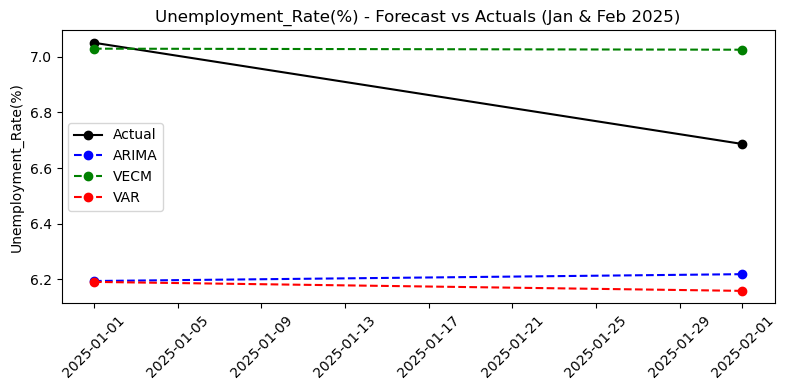

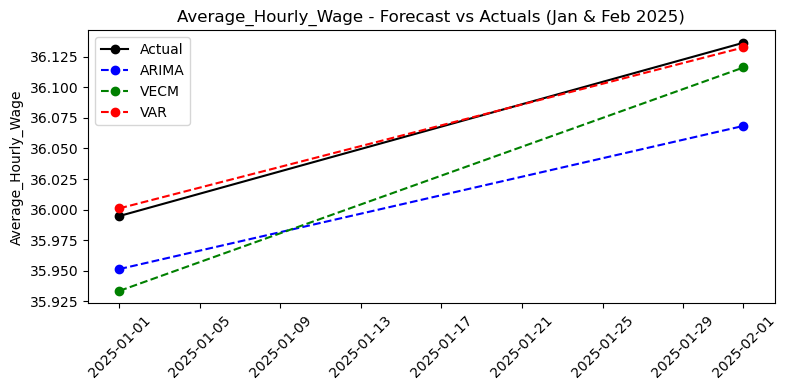

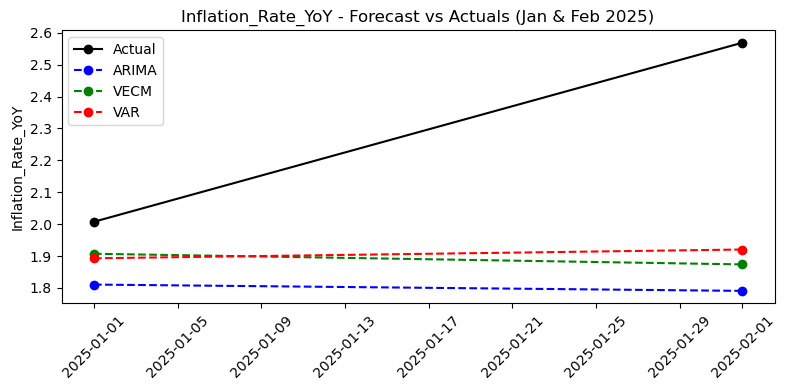

In [102]:
# Plot model forecasts vs actuals for each variable
for target in actual_2025.columns:
    plt.figure(figsize=(8, 4))
    actual_vals = actual_2025[target].iloc[:2].values
    dates = actual_2025.index[:2]

    plt.plot(dates, actual_vals, 'k-o', label='Actual')

    if target in arima_results:
        plt.plot(dates, arima_results[target]['Forecast'], 'b--o', label='ARIMA')
    if target in vecm_eval:
        plt.plot(dates, vecm_eval[target]['Forecast'], 'g--o', label='VECM')
    if target in var_eval:
        plt.plot(dates, var_eval[target]['Forecast'], 'r--o', label='VAR')

    plt.title(f"{target} - Forecast vs Actuals (Jan & Feb 2025)")
    plt.ylabel(target)
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()



## Understanding Which Factors Predict Industy's Unemployment Rate Change: Model Approach

In [103]:
# Prepare data for modeling
df = industry_trends.sort_values(['NAICS_21_Label', 'REF_DATE']).reset_index(drop=True)
df['Unemp_change'] = df.groupby('NAICS_21_Label')['Unemployment_Rate(%)'].diff()
df['target'] = (df['Unemp_change'] > 0).astype(int)
df_model = df.dropna(subset=['Unemp_change']).copy()

predictors = [
    'Job Vacancies (#)', 'Payroll Employees (#)', 'Job Vacancy Rate (%)', 'Employment_Rate(%)', 
    'Unemployment_Rate(%)', 'Labour_Force_Participation_Rate(%)', 'Duration_Jobless(Months)', 
    'Average_Hourly_Wage', 'Market_Tightness', 'Lagged_Job_Vacancy_Rate', 'Lagged_Unemployment_Rate', 
    'Lagged_Market_Tightness', 'All-items', 'Inflation_Rate_MoM', 'CPI_Lagged_1M', 'Inflation_Rate_1M_Lagged', 
    'CPI_Lagged_12M', 'Inflation_Rate_YoY'
]

X = df_model[predictors]
y = df_model['target']


# Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)


# Baseline Models

print("\n--- Random Forest Baseline ---")
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)
print(classification_report(y_test, y_pred_rf))
print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print("ROC-AUC:", roc_auc_score(y_test, rf.predict_proba(X_test)[:,1]))

print("\n--- XGBoost Baseline ---")
xgb = XGBClassifier(random_state=42, eval_metric='logloss')
xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)
print(classification_report(y_test, y_pred_xgb))
print("Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("ROC-AUC:", roc_auc_score(y_test, xgb.predict_proba(X_test)[:,1]))

/var/folders/n9/29yl9jnj61q74vg3ydjdf3qh0000gn/T/ipykernel_74272/1610669339.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df['Unemp_change'] = df.groupby('NAICS_21_Label')['Unemployment_Rate(%)'].diff()



--- Random Forest Baseline ---
              precision    recall  f1-score   support

           0       0.81      0.85      0.83       156
           1       0.83      0.77      0.80       141

    accuracy                           0.81       297
   macro avg       0.82      0.81      0.81       297
weighted avg       0.82      0.81      0.81       297

Accuracy: 0.8148148148148148
ROC-AUC: 0.8777505000909256

--- XGBoost Baseline ---
              precision    recall  f1-score   support

           0       0.90      0.92      0.91       156
           1       0.91      0.89      0.90       141

    accuracy                           0.90       297
   macro avg       0.90      0.90      0.90       297
weighted avg       0.90      0.90      0.90       297

Accuracy: 0.9023569023569024
ROC-AUC: 0.9638570649208946


In [104]:
# Initialize Random Forest and XGBoost
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)
xgb = XGBClassifier(random_state=42, eval_metric='logloss')
xgb.fit(X_train, y_train)

# Define thresholds and container for results
thresholds = np.linspace(0.01, 0.1, 10)
rf_results = []
xgb_results = []

# Feature importance
rf_importance_df = pd.DataFrame({'feature': X.columns, 'importance': rf.feature_importances_})
xgb_importance_df = pd.DataFrame({'feature': X.columns, 'importance': xgb.feature_importances_})

# Thresholding loop for both models
for model_name, importance_df in [('RF', rf_importance_df), ('XGB', xgb_importance_df)]:
    for thresh in thresholds:
        selected = importance_df[importance_df['importance'] > thresh]['feature'].tolist()
        if len(selected) == 0:
            continue
        X_train_thresh = X_train[selected]
        X_test_thresh = X_test[selected]

        model = XGBClassifier(random_state=42, eval_metric='logloss')
        model.fit(X_train_thresh, y_train)
        auc = roc_auc_score(y_test, model.predict_proba(X_test_thresh)[:, 1])
        acc = accuracy_score(y_test, model.predict(X_test_thresh))

        result = (thresh, len(selected), auc, acc)
        if model_name == 'RF':
            rf_results.append(result)
        else:
            xgb_results.append(result)

# Create DataFrames
rf_thresh_df = pd.DataFrame(rf_results, columns=['Threshold', 'n_features', 'ROC_AUC', 'Accuracy'])
xgb_thresh_df = pd.DataFrame(xgb_results, columns=['Threshold', 'n_features', 'ROC_AUC', 'Accuracy'])

# Select best threshold from each
best_rf_thresh = rf_thresh_df.loc[rf_thresh_df['ROC_AUC'].idxmax()]['Threshold']
best_xgb_thresh = xgb_thresh_df.loc[xgb_thresh_df['ROC_AUC'].idxmax()]['Threshold']

# Refined feature sets
rf_selected_features = rf_importance_df[rf_importance_df['importance'] > best_rf_thresh]['feature'].tolist()
xgb_selected_features = xgb_importance_df[xgb_importance_df['importance'] > best_xgb_thresh]['feature'].tolist()

# Prepare final refined datasets
X_train_rf = X_train[rf_selected_features]
X_test_rf_refined = X_test[rf_selected_features]
X_train_xgb = X_train[xgb_selected_features]
X_test_xgb_refined = X_test[xgb_selected_features]



# Refined Models

print("\n--- Random Forest Post Feature Importance ---")
rf_refined = RandomForestClassifier(random_state=42)
rf_refined.fit(X_train_rf, y_train)
y_pred_rf_refined = rf_refined.predict(X_test_rf_refined)
print(classification_report(y_test, y_pred_rf_refined))
print("Accuracy:", accuracy_score(y_test, y_pred_rf_refined))
print("ROC-AUC:", roc_auc_score(y_test, rf_refined.predict_proba(X_test_rf_refined)[:,1]))

print("\n--- XGBoost Post Feature Importance ---")
xgb_refined = XGBClassifier(random_state=42, eval_metric='logloss')
xgb_refined.fit(X_train_xgb, y_train)
y_pred_xgb_refined = xgb_refined.predict(X_test_xgb_refined)
print(classification_report(y_test, y_pred_xgb_refined))
print("Accuracy:", accuracy_score(y_test, y_pred_xgb_refined))
print("ROC-AUC:", roc_auc_score(y_test, xgb_refined.predict_proba(X_test_xgb_refined)[:,1]))


--- Random Forest Post Feature Importance ---
              precision    recall  f1-score   support

           0       0.89      0.90      0.89       156
           1       0.89      0.88      0.88       141

    accuracy                           0.89       297
   macro avg       0.89      0.89      0.89       297
weighted avg       0.89      0.89      0.89       297

Accuracy: 0.8888888888888888
ROC-AUC: 0.9560374613566103

--- XGBoost Post Feature Importance ---
              precision    recall  f1-score   support

           0       0.91      0.89      0.90       156
           1       0.88      0.91      0.90       141

    accuracy                           0.90       297
   macro avg       0.90      0.90      0.90       297
weighted avg       0.90      0.90      0.90       297

Accuracy: 0.898989898989899
ROC-AUC: 0.9737224949990908


In [105]:
# RFE Tuning for Random Forest
rfe_scores_rf = []
for n in range(3, len(X_train.columns) + 1):
    rfe = RFE(estimator=RandomForestClassifier(random_state=42), n_features_to_select=n)
    rfe.fit(X_train, y_train)
    selected = X_train.columns[rfe.support_]
    X_train_rfe = X_train[selected]
    X_test_rfe = X_test[selected]
    model = RandomForestClassifier(random_state=42)
    model.fit(X_train_rfe, y_train)
    auc = roc_auc_score(y_test, model.predict_proba(X_test_rfe)[:, 1])
    acc = accuracy_score(y_test, model.predict(X_test_rfe))
    rfe_scores_rf.append((n, auc, acc))

rfe_df_rf = pd.DataFrame(rfe_scores_rf, columns=['n_features', 'ROC_AUC', 'Accuracy'])
best_rfe_row_rf = rfe_df_rf.loc[rfe_df_rf['ROC_AUC'].idxmax()]
best_rfe_n_rf = int(best_rfe_row_rf['n_features'])

# RFE Tuning for XGBoost
rfe_scores_xgb = []
for n in range(3, len(X_train.columns) + 1):
    rfe = RFE(estimator=XGBClassifier(random_state=42, eval_metric='logloss'), n_features_to_select=n)
    rfe.fit(X_train, y_train)
    selected = X_train.columns[rfe.support_]
    X_train_rfe = X_train[selected]
    X_test_rfe = X_test[selected]
    model = XGBClassifier(random_state=42, eval_metric='logloss')
    model.fit(X_train_rfe, y_train)
    auc = roc_auc_score(y_test, model.predict_proba(X_test_rfe)[:, 1])
    acc = accuracy_score(y_test, model.predict(X_test_rfe))
    rfe_scores_xgb.append((n, auc, acc))

rfe_df_xgb = pd.DataFrame(rfe_scores_xgb, columns=['n_features', 'ROC_AUC', 'Accuracy'])
best_rfe_row_xgb = rfe_df_xgb.loc[rfe_df_xgb['ROC_AUC'].idxmax()]
best_rfe_n_xgb = int(best_rfe_row_xgb['n_features'])


# RFE model fit for best RF
rfe_rf = RFE(estimator=RandomForestClassifier(random_state=42), n_features_to_select=best_rfe_n_rf)
rfe_rf.fit(X_train, y_train)
rf_features = X_train.columns[rfe_rf.support_]
X_train_rf_rfe = X_train[rf_features]
X_test_rf_rfe = X_test[rf_features]
rf_model = RandomForestClassifier(n_estimators=200, random_state=42)
rf_model.fit(X_train_rf_rfe, y_train)
y_pred_rf_rfe = rf_model.predict(X_test_rf_rfe)
print("\n--- Random Forest Post RFE ---")
print(classification_report(y_test, y_pred_rf_rfe))
print("Accuracy:", accuracy_score(y_test, y_pred_rf_rfe))
print("ROC-AUC:", roc_auc_score(y_test, rf_model.predict_proba(X_test_rf_rfe)[:, 1]))

# RFE model fit for best XGB
rfe_xgb = RFE(estimator=XGBClassifier(random_state=42, eval_metric='logloss'), n_features_to_select=best_rfe_n_xgb)
rfe_xgb.fit(X_train, y_train)
xgb_features = X_train.columns[rfe_xgb.support_]
X_train_xgb_rfe = X_train[xgb_features]
X_test_xgb_rfe = X_test[xgb_features]
xgb_model = XGBClassifier(learning_rate=0.2, max_depth=3, n_estimators=200, eval_metric='logloss', random_state=42)
xgb_model.fit(X_train_xgb_rfe, y_train)
y_pred_xgb_rfe = xgb_model.predict(X_test_xgb_rfe)
print("\n--- XGBoost Post RFE ---")
print(classification_report(y_test, y_pred_xgb_rfe))
print("Accuracy:", accuracy_score(y_test, y_pred_xgb_rfe))
print("ROC-AUC:", roc_auc_score(y_test, xgb_model.predict_proba(X_test_xgb_rfe)[:, 1]))



--- Random Forest Post RFE ---
              precision    recall  f1-score   support

           0       0.90      0.90      0.90       156
           1       0.89      0.89      0.89       141

    accuracy                           0.90       297
   macro avg       0.90      0.90      0.90       297
weighted avg       0.90      0.90      0.90       297

Accuracy: 0.8956228956228957
ROC-AUC: 0.9552191307510456

--- XGBoost Post RFE ---
              precision    recall  f1-score   support

           0       0.93      0.92      0.93       156
           1       0.92      0.92      0.92       141

    accuracy                           0.92       297
   macro avg       0.92      0.92      0.92       297
weighted avg       0.92      0.92      0.92       297

Accuracy: 0.9225589225589226
ROC-AUC: 0.9834060738316058


In [106]:
# Hyperparameter Tuning using feature sets from RFE
print("\n--- GridSearchCV for RF ---")
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 3, 5, 7],
}
grid_rf = GridSearchCV(RandomForestClassifier(random_state=42), param_grid_rf, cv=5, scoring='roc_auc')
grid_rf.fit(X_train_rf_rfe, y_train)
print("Best RF params:", grid_rf.best_params_)
print("Best ROC-AUC:", grid_rf.best_score_)

print("\n--- GridSearchCV for XGB ---")
param_grid_xgb = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
}
grid_xgb = GridSearchCV(XGBClassifier(random_state=42, eval_metric='logloss'), param_grid_xgb, cv=5, scoring='roc_auc')
grid_xgb.fit(X_train_xgb_rfe, y_train)
print("Best XGB params:", grid_xgb.best_params_)
print("Best ROC-AUC:", grid_xgb.best_score_)



--- GridSearchCV for RF ---
Best RF params: {'max_depth': None, 'n_estimators': 50}
Best ROC-AUC: 0.9659969824695853

--- GridSearchCV for XGB ---
Best XGB params: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200}
Best ROC-AUC: 0.9784048333705867


In [107]:
# Final Random Forest Model
print("\n--- Final Random Forest Model ---")
final_rf = RandomForestClassifier(
    n_estimators=50,
    max_depth=None,
    random_state=42
)

final_rf.fit(X_train_rf_rfe, y_train)
y_pred_final_rf = final_rf.predict(X_test_rf_rfe)
y_proba_final_rf = final_rf.predict_proba(X_test_rf_rfe)[:, 1]

print(classification_report(y_test, y_pred_rf))
print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print("ROC-AUC:", roc_auc_score(y_test, y_proba_final_rf))

# Final XGBoost Model
print("\n--- Final XGBoost Model ---")
final_xgb = XGBClassifier(
    learning_rate=0.1,
    max_depth=7,
    n_estimators=200,
    eval_metric='logloss',
    random_state=42
)

final_xgb.fit(X_train_xgb_rfe, y_train)
y_pred_xgb_final = final_xgb.predict(X_test_xgb_rfe)
y_proba_xgb_final = final_xgb.predict_proba(X_test_xgb_rfe)[:, 1]

print(classification_report(y_test, y_pred_xgb))
print("Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("ROC-AUC:", roc_auc_score(y_test, y_proba_xgb_final))

# Printing the selected features by models
print(f"\nFeatures used by XGBoost (RFE + GridSearch): {xgb_features}")
print(f"Features used by Random Forest (RFE + GridSearch): {rf_features}")



--- Final Random Forest Model ---
              precision    recall  f1-score   support

           0       0.81      0.85      0.83       156
           1       0.83      0.77      0.80       141

    accuracy                           0.81       297
   macro avg       0.82      0.81      0.81       297
weighted avg       0.82      0.81      0.81       297

Accuracy: 0.8148148148148148
ROC-AUC: 0.9534233496999455

--- Final XGBoost Model ---
              precision    recall  f1-score   support

           0       0.90      0.92      0.91       156
           1       0.91      0.89      0.90       141

    accuracy                           0.90       297
   macro avg       0.90      0.90      0.90       297
weighted avg       0.90      0.90      0.90       297

Accuracy: 0.9023569023569024
ROC-AUC: 0.9814966357519548

Features used by XGBoost (RFE + GridSearch): Index(['Unemployment_Rate(%)', 'Lagged_Unemployment_Rate', 'Lagged_Market_Tightness'], dtype='object')
Features used by Ra

In [108]:
# Creating dataframe for model comparison
results_df = pd.DataFrame({
    'Model': [
        'Baseline RF',
        'Baseline XGB',
        'RF (Feature Importance)',
        'XGB (Feature Importance)',
        'RF (RFE + GridSearch)',
        'XGB (RFE + GridSearch)'
    ],
    'ROC-AUC': [
        roc_auc_score(y_test, rf.predict_proba(X_test)[:, 1]),
        roc_auc_score(y_test, xgb.predict_proba(X_test)[:, 1]),
        roc_auc_score(y_test, rf_refined.predict_proba(X_test_rf_refined)[:, 1]),
        roc_auc_score(y_test, xgb_refined.predict_proba(X_test_xgb_refined)[:, 1]),
        roc_auc_score(y_test, final_rf.predict_proba(X_test_rf_rfe)[:, 1]),
        roc_auc_score(y_test, final_xgb.predict_proba(X_test_xgb_rfe)[:, 1])
    ],
    'Accuracy': [
        accuracy_score(y_test, rf.predict(X_test)),
        accuracy_score(y_test, xgb.predict(X_test)),
        accuracy_score(y_test, y_pred_rf_refined),
        accuracy_score(y_test, y_pred_xgb_refined),
        accuracy_score(y_test, y_pred_final_rf),
        accuracy_score(y_test, y_pred_xgb_final)
    ]
})

print("\nModel Comparison (Refined + Final Tuning):")
print(results_df.sort_values(by='ROC-AUC', ascending=False))



Model Comparison (Refined + Final Tuning):
                      Model  ROC-AUC  Accuracy
5    XGB (RFE + GridSearch)    0.981     0.916
3  XGB (Feature Importance)    0.974     0.899
1              Baseline XGB    0.964     0.902
2   RF (Feature Importance)    0.956     0.889
4     RF (RFE + GridSearch)    0.953     0.886
0               Baseline RF    0.878     0.815


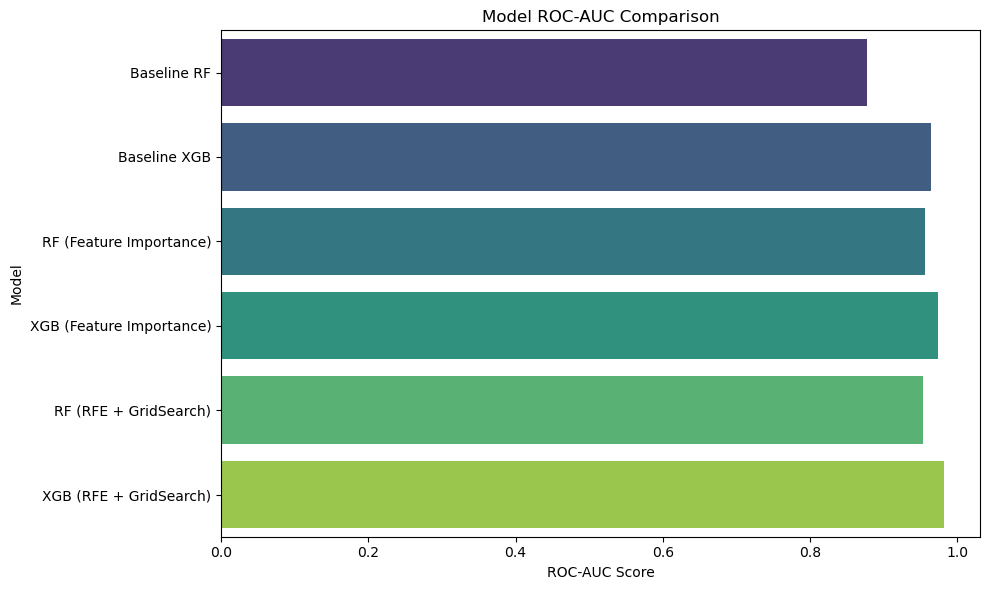

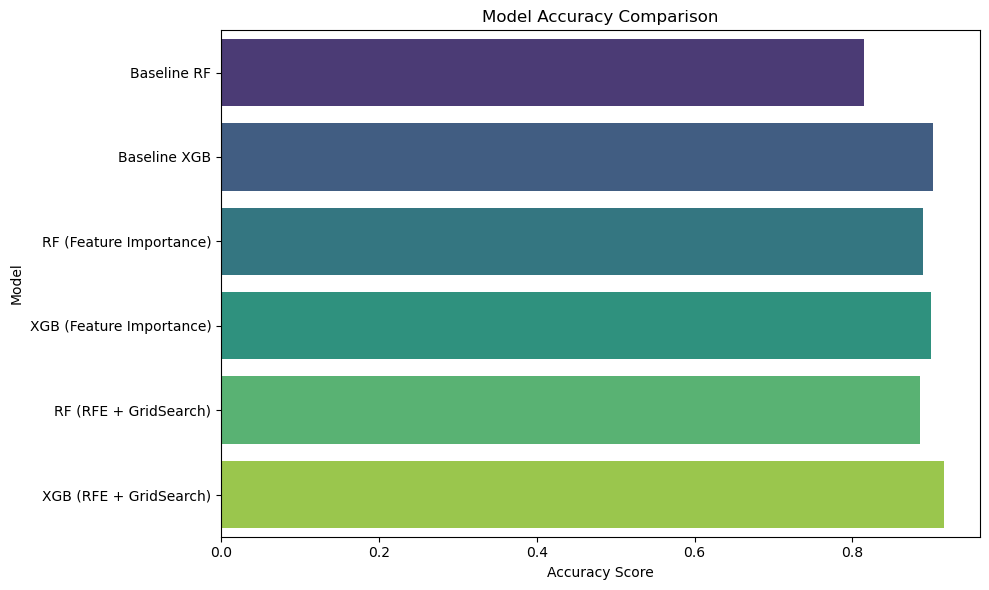

In [109]:
# Plotting ROC-AUC comparison
plt.figure(figsize=(10, 6))
sns.barplot(data=results_df, y='Model', x='ROC-AUC', palette='viridis', hue='Model')
plt.title("Model ROC-AUC Comparison")
plt.xlabel("ROC-AUC Score")
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
sns.barplot(data=results_df, y='Model', x='Accuracy', palette='viridis', hue='Model')
plt.title("Model Accuracy Comparison")
plt.xlabel("Accuracy Score")
plt.tight_layout()
plt.show()